In [1]:
%load_ext autoreload
%autoreload 2

# Complete Helper Plots Recreation - All Pipelines
### Using Real Agent Optimization with Comprehensive Visualization

This notebook recreates **ALL** helper.py plotting functions using the three established EMS pipelines:
- **Pipeline A**: Comparison optimization (decentralized vs centralized)
- **Pipeline B**: Integrated learning + optimization with probability tracking  
- **Pipeline C**: Probability learning rate optimization

Strictly follows \"USE REAL AGENT OPTIMIZERS\" compliance with step-by-step pipeline visualization.

In [2]:
import sys
import os
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import duckdb

# Notebooks are IN the notebooks directory, so go up to project root
sys.path.append(str(Path.cwd().parent))

# Import agents from current directory (we're already in notebooks/)
from agents.ProbabilityModelAgent import ProbabilityModelAgent
from agents.BatteryAgent import BatteryAgent
from agents.EVAgent import EVAgent
from agents.PVAgent import PVAgent
from agents.GridAgent import GridAgent
from agents.FlexibleDeviceAgent import FlexibleDevice
from agents.GlobalOptimizer import GlobalOptimizer
from agents.GlobalConnectionLayer import GlobalConnectionLayer
from agents.WeatherAgent import WeatherAgent

# Import utilities from current directory
from utils.helper import *
from utils.device_specs import device_specs

# Import common from parent directory scripts
import scripts.common as common

print("✓ Successfully imported all modules from notebooks directory")

✓ Successfully imported all modules from notebooks directory


In [3]:
# Configuration - exactly like working notebooks
building_id = "DE_KN_residential4"
n_days = 30
battery_enabled = True
ev_enabled = False

# Setup DuckDB connection with error handling
print("📊 Setting up DuckDB connection...")
try:
    con, view_name = common.get_con(building_id)
except Exception as e:
    print(f"⚠️  get_con failed: {e}")
    # Manual fallback - create in-memory DB and load parquet directly
    con = duckdb.connect(":memory:")
    
    # Try to find and load the parquet file
    import os
    from pathlib import Path
    
    project_root = Path.cwd().parent  # Go up from notebooks to project root
    parquet_candidates = [
        project_root / "data" / f"{building_id}_processed_data.parquet",
        project_root / "notebooks" / "data" / f"{building_id}_processed_data.parquet",
    ]
    
    for parquet_path in parquet_candidates:
        if parquet_path.exists():
            view_name = f"{building_id}_processed_data"
            con.execute(f"""
            CREATE TABLE {view_name} AS 
            SELECT * FROM read_parquet('{str(parquet_path).replace(os.sep, '/')}')
            """)
            print(f"✓ Manually loaded data from {parquet_path}")
            break
    else:
        raise FileNotFoundError(f"No parquet file found for {building_id}")

# Verify connection
try:
    total_rows = con.execute(f"SELECT COUNT(*) FROM {view_name}").fetchone()[0]
    print(f"✓ Connected to DuckDB: {total_rows:,} rows")
except Exception as e:
    print(f"✗ Database connection failed: {e}")

📊 Setting up DuckDB connection...
✓ Connected to DuckDB: 20,358 rows


In [4]:
# Select days using DuckDB queries - copy from working scripts
print("📅 Selecting days using DuckDB queries...")

# Get all available days with complete 24-hour data (same as working scripts)
query = f"""
SELECT DATE(utc_timestamp) as day, COUNT(*) as hour_count
FROM {view_name}
GROUP BY DATE(utc_timestamp)
HAVING COUNT(*) = 24
ORDER BY DATE(utc_timestamp)
LIMIT {n_days}
"""

try:
    result = con.execute(query).fetchall()
    selected_days = [row[0] for row in result]
    print(f"✓ Selected {len(selected_days)} days from DuckDB:")
    for day in selected_days:
        print(f"  - {day}")
except Exception as e:
    print(f"✗ Day selection failed: {e}")
    selected_days = []

📅 Selecting days using DuckDB queries...
✓ Selected 30 days from DuckDB:
  - 2015-10-11
  - 2015-10-12
  - 2015-10-13
  - 2015-10-14
  - 2015-10-15
  - 2015-10-16
  - 2015-10-17
  - 2015-10-18
  - 2015-10-19
  - 2015-10-20
  - 2015-10-21
  - 2015-10-22
  - 2015-10-23
  - 2015-10-24
  - 2015-10-26
  - 2015-10-27
  - 2015-10-28
  - 2015-10-29
  - 2015-10-30
  - 2015-10-31
  - 2015-11-01
  - 2015-11-02
  - 2015-11-03
  - 2015-11-04
  - 2015-11-05
  - 2015-11-06
  - 2015-11-07
  - 2015-11-08
  - 2015-11-09
  - 2015-11-10


In [5]:
# helper_extensions.py

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle, Patch
from matplotlib.lines import Line2D

# ─────────────────────────────────────────────────────────────────────────────
# Section: Synthetic Usage Profile Generator
# ─────────────────────────────────────────────────────────────────────────────
def synthetic_profile(dev_name: str) -> np.ndarray:
    """
    I generate a fallback 24-hour usage curve when no real data exists.
    """
    arr = np.zeros(24, dtype=float)
    n = dev_name.lower()
    if "dishwasher" in n:
        arr[19:22] = 1.0
    elif "washing_machine" in n or "washing machine" in n:
        arr[14:17] = 1.0
    elif "heat_pump" in n or "heat pump" in n:
        arr[2:7]   = 0.8
        arr[18:23] = 0.6
    elif "freezer" in n:
        arr[:]      = 0.6
        arr[23]    += 0.1
        arr[0:2]   += 0.1
    elif "refrigerator" in n:
        arr[:]      = 0.5
        arr[10:14] = 0.3
        arr[23]    += 0.1
        arr[0:2]   += 0.1
    elif "ev" in n or "electric_vehicle" in n:
        arr[:]      = 0.3
        arr[21:24] = 0.9
        arr[12:14] = 0.4
    else:
        arr[:]      = 0.4
        arr[6:9]    = 0.6
        arr[17:19]  = 0.6

    # I smooth the profile to avoid harsh edges
    return np.convolve(arr, np.ones(3)/3.0, mode="same")


# ─────────────────────────────────────────────────────────────────────────────
# Section: Full-Scenario Heatmaps (Actual vs Next-Day + Price + Probability)
# ─────────────────────────────────────────────────────────────────────────────
def plot_heatmaps_for_scenario(devices, building_id, scenario_name, save_path=None):
    """
    I render two panels:
      (1.a) Actual usage heatmap + electricity price
      (1.b) Next-day charging/usage heatmap + price + learned probability + allowed-hours
    """
    # --- (1) Build actual usage matrix
    init_matrix, dev_names = [], []
    for dev in devices:
        raw = getattr(dev, "actual_usage_discretized", None)
        if isinstance(raw, (list, np.ndarray)) and len(raw) == 24:
            arr = np.array(raw, float)
        else:
            arr = synthetic_profile(dev.device_name)
        init_matrix.append(arr)
        dev_names.append(dev.device_name)
    init_matrix = np.array(init_matrix)

    # --- (2) Extract price curve robustly
    price_data = None
    for dev in devices:
        if hasattr(dev, "data") and "price_per_kwh" in dev.data.columns:
            df = dev.data.copy()
            # derive 'hour' if possible
            if "utc_timestamp" in df.columns:
                df["hour"] = df["utc_timestamp"].dt.hour
            if "hour" in df.columns:
                series = df.groupby("hour")["price_per_kwh"].mean()
            else:
                # fallback uniform grouping
                series = pd.Series(df["price_per_kwh"].values[:24], index=range(24))
            price_data = series.reindex(range(24), fill_value=series.mean())
            break
    if price_data is None:
        price_data = pd.Series([0.25]*24, index=range(24))

    # --- (3) Normalize helper
    def _normalize(mat):
        out = np.zeros_like(mat)
        for i in range(mat.shape[0]):
            mn, mx = mat[i].min(), mat[i].max()
            out[i] = (mat[i]-mn)/(mx-mn) if mx>mn else mat[i]
        return out

    norm_init = _normalize(init_matrix)

    # --- (4) Build next-day / phases schedule + probability
    nd_matrix, nd_names, prob_matrix = [], [], []
    for dev in devices:
        # (4.a) EVAgent: use its hourly_charge if present
        if hasattr(dev, "hourly_charge"):
            arr_nd = np.array(dev.hourly_charge, float)
        else:
            # (4.b) fallback to any optimized_schedule attribute
            raw = None
            for attr in (
                "phases_optimized_schedule",
                "nextday_optimized_schedule",
                "centralized_optimized_schedule",
                "optimized_schedule"
            ):
                cand = getattr(dev, attr, None)
                if isinstance(cand, (list, np.ndarray)) and len(cand)==24 and np.ptp(cand)>1e-8:
                    raw = cand
                    break
            arr_nd = np.array(raw, float) if raw is not None else synthetic_profile(dev.device_name)

        nd_matrix.append(arr_nd)
        nd_names.append(dev.device_name)

        hp = getattr(dev, "hour_probability", {})
        prob_matrix.append([hp.get(h, 0.0) for h in range(24)])

    nd_matrix   = np.array(nd_matrix)
    prob_matrix = np.array(prob_matrix)
    norm_nd     = _normalize(nd_matrix)

    # --- (5) Panel helper: price + heatmap
    def _panel(fig, gs, price, mat, labels, cmap):
        axp = fig.add_subplot(gs[0,0])
        x = np.arange(24)+0.5
        axp.plot(x, price.values, color="#1f77b4", linewidth=2)
        axp.fill_between(x, price.values, color="#aec7e8", alpha=0.4)
        axp.tick_params(bottom=False, labelbottom=False)
        axp.set_ylabel("Price (€/kWh)")
        for hr, p in enumerate(price.values):
            axp.text(hr+0.5, p+0.001, f"{p:.3f}",
                     ha="center", va="bottom", fontsize=8, color="#1f77b4")

        axh = fig.add_subplot(gs[1,0], sharex=axp)
        im = axh.imshow(mat, aspect="auto", cmap=cmap, vmin=0, vmax=1,
                       extent=(0,24,len(mat),0))
        axh.set_yticks(np.arange(len(mat))+0.5)
        axh.set_yticklabels(labels)
        axh.set_xlabel("Hour of Day")
        axh.set_ylabel("Devices")
        return im, axh

    # --- (6.a) Plot actual usage panel
    fig = plt.figure(figsize=(14, max(5, len(devices)//2 + 3)))
    gs  = gridspec.GridSpec(2,2, width_ratios=[20,1], height_ratios=[1,4],
                             wspace=0.1, hspace=0)
    im1, _ = _panel(fig, gs, price_data, norm_init, dev_names, "Blues")
    cax1   = fig.add_subplot(gs[:,1])
    plt.colorbar(im1, cax=cax1, label="Normalized Usage")
    fig.suptitle(f"(1.a) Actual Usage Heatmap — {building_id} [{scenario_name}]",
                 fontsize=14, y=0.98)
    if save_path:
        plt.savefig(f"{save_path}/heat_actual_{building_id}.png",
                    dpi=300, bbox_inches="tight")
    plt.show()

    # --- (6.b) Plot next-day / charging panel
    fig = plt.figure(figsize=(16, max(6, len(devices)//2 + 3)))
    gs  = gridspec.GridSpec(2,2, width_ratios=[20,1], height_ratios=[1,4],
                             wspace=0.1, hspace=0)
    im2, axm = _panel(fig, gs, price_data, norm_nd, nd_names, "Blues")

    # overlay allowed‐hours + learned probability
    for i, dev in enumerate(devices):
        allowed = dev.spec.get("allowed_hours", [])
        if allowed:
            s, e = min(allowed), max(allowed)
            axm.add_patch(Rectangle((s,i), e-s+1, 1,
                                    fill=False, edgecolor="#006400", linewidth=2))
        for hr in range(24):
            alpha = 0.1 + 0.4*(prob_matrix[i,hr]/prob_matrix[i].max()) \
                    if prob_matrix.size else 0.1
            axm.add_patch(Rectangle((hr,i),1,1,
                                    facecolor="#2ca02c", alpha=alpha, linewidth=0))

    cax2 = fig.add_subplot(gs[:,1])
    plt.colorbar(im2, cax=cax2, label="Normalized Next-Day Usage")

    legend = [
        Patch(facecolor="#1f77b4", alpha=0.7, label="Scheduled Usage"),
        Patch(facecolor="#2ca02c", alpha=0.4, label="Learned Probability"),
        Patch(facecolor="none", edgecolor="#006400", linewidth=2, label="Allowed Hours"),
        Line2D([0],[0], color="#1f77b4", linewidth=2, label="Price")
    ]
    axm.legend(handles=legend, loc="upper center", bbox_to_anchor=(0.5,-0.15),
               ncol=4)

    fig.suptitle(f"(1.b) Next-Day Coverage Heatmap — {building_id} [{scenario_name}]",
                 fontsize=14, y=0.98)
    if save_path:
        plt.savefig(f"{save_path}/heat_nextday_{building_id}.png",
                    dpi=300, bbox_inches="tight")
    plt.tight_layout(rect=[0,0,1,0.95])
    plt.show()


# ─────────────────────────────────────────────────────────────────────────────
# Section: Single-Device 3-Panel Heatmap (Price | Schedule+Full-By | PMF)
# ─────────────────────────────────────────────────────────────────────────────
def plot_single_device_heatmap(
    devices,
    building_id,
    scenario_name,
    device_name_or_index,
    save_path=None
):
    """
    I render either three (non-EV) or four (EV) vertically stacked panels:
      1) Electricity price
      2) Scheduled usage / charging + allowed-hours + “Full by”
      3) Learned PMF (inverted)
      4) (EV only) Bar chart of hourly_charge / hourly_discharge + SOC line
    All panels share the same hour x-axis.
    """
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    from matplotlib.patches import Rectangle

    # ─── (A) Locate the target device ─────────────────────────────────────────
    if isinstance(device_name_or_index, int):
        dev = devices[device_name_or_index]
    else:
        dev = next(
            (d for d in devices
             if d.device_name == device_name_or_index
             or d.device_name.endswith(f"_{device_name_or_index}")),
            None
        )
    if dev is None:
        raise ValueError(f"Device not found: {device_name_or_index}")
    name  = dev.device_name
    is_ev = hasattr(dev, "hourly_charge")

    # ─── (B) Extract electricity price robustly ───────────────────────────────
    try:
        df = dev.data.copy()
        if "utc_timestamp" in df.columns:
            df["hour"] = df["utc_timestamp"].dt.hour
        price = (
            df.groupby("hour")["price_per_kwh"]
              .mean()
              .reindex(range(24),
                       fill_value=df["price_per_kwh"].mean())
        )
    except Exception:
        price = pd.Series([0.25]*24, index=range(24))

    # ─── (C) Extract schedule or fallback ─────────────────────────────────────
    if is_ev:
        sched = np.array(dev.hourly_charge, float)
    else:
        raw = None
        for attr in (
            "phases_optimized_schedule",
            "nextday_optimized_schedule",
            "centralized_optimized_schedule",
            "optimized_schedule"
        ):
            cand = getattr(dev, attr, None)
            if isinstance(cand, (list, np.ndarray)) \
               and len(cand)==24 and np.ptp(cand)>1e-8:
                raw = cand
                break
        sched = np.array(raw, float) if raw is not None else synthetic_profile(name)
    mn, mx     = sched.min(), sched.max()
    norm_sched = (sched-mn)/(mx-mn) if mx>mn else sched

    # ─── (D) Build PMF with uniform fallback ──────────────────────────────────
    hp   = getattr(dev, "hour_probability", None)
    if not isinstance(hp, dict) or len(hp)==0:
        hp = {h: 1/24 for h in range(24)}
    pmf  = np.array([hp.get(h, 0.0) for h in range(24)], float)
    maxp = pmf.max() if pmf.max()>0 else 1.0

    # ─── (E) EV “Full by” deadline ────────────────────────────────────────────
    fb = getattr(dev, "must_be_full_by_hour", None)

    # ─────────────────────────────────────────────────────────────────────────
    # Section: Create GridSpec (3 rows for non-EV, 4 for EV)
    # ─────────────────────────────────────────────────────────────────────────
    nrows = 4 if is_ev else 3
    fig = plt.figure(figsize=(14, 3 * nrows + 1))
    gs  = gridspec.GridSpec(
        nrows, 2,
        width_ratios=[20, 1],
        height_ratios=[1]*nrows,
        wspace=0.1,
        hspace=0.4
    )
    x = np.arange(24) + 0.5

    # ─── Panel 1: Electricity Price ──────────────────────────────────────────
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(x, price.values, color="#1f77b4", linewidth=2)
    ax1.fill_between(x, price.values, color="#aec7e8", alpha=0.4)
    ax1.set_title("1) Electricity Price")
    ax1.set_ylabel("€/kWh")
    ax1.set_xticks(range(0, 25, 3))

    # ─── Panel 2: Scheduled Usage / Charging ────────────────────────────────
    ax2 = fig.add_subplot(gs[1, 0], sharex=ax1)
    im2 = ax2.imshow(
        norm_sched.reshape(1, -1),
        aspect="auto",
        cmap="Blues",
        vmin=0, vmax=1,
        extent=(0, 24, 1, 0)
    )
    ax2.set_title("2) Scheduled Usage / Charging")
    ax2.set_yticks([0.5]); ax2.set_yticklabels([name])
    # allowed-hours area
    allowed = dev.spec.get("allowed_hours", [])
    if allowed:
        s, e = min(allowed), max(allowed)
        ax2.add_patch(Rectangle((s, 0), e-s+1, 1,
                                facecolor="#d3d3d3", alpha=0.3))
    # full-by line
    if isinstance(fb, (int, float)) and 0 <= fb <= 24:
        ax2.axvline(fb, color="#2ca02c", linestyle="--", linewidth=2)
        ax2.text(fb+0.3, 0.5, f"Full by {int(fb)}:00",
                 rotation=90, va="center", ha="left",
                 fontsize=9, color="#2ca02c",
                 bbox=dict(facecolor="white", alpha=0.6, edgecolor="none"))
    cax2 = fig.add_subplot(gs[1, 1])
    plt.colorbar(im2, cax=cax2, label="Normalized Usage")

    # ─── Panel 3: Learned PMF (Inverted) ───────────────────────────────────
    ax3 = fig.add_subplot(gs[2, 0], sharex=ax1)
    ax3.plot(x, pmf, color="#2ca02c", linewidth=2)
    ax3.fill_between(x, pmf, 0, color="#98df8a", alpha=0.4)
    ax3.invert_yaxis()
    ax3.set_title("3) Learned Probability (Inverted)")
    ax3.set_ylabel("Probability")
    ax3.set_xticks(range(0, 25, 3))

    # ─── Panel 4: EV Charge/Discharge & SOC ────────────────────────────────
    if is_ev:
        ax4 = fig.add_subplot(gs[3, 0], sharex=ax1)
        ax4.set_title("4) EV Charge (blue) / Discharge (red) & SOC (green)")
        ax4.set_xlabel("Hour of Day")
        charge    = dev.hourly_charge
        discharge = dev.hourly_discharge
        soc       = dev.hourly_soc
        # charge/discharge bars
        ax4.bar(x, charge, width=1.0, align='center',
                label='Charge', alpha=0.7)
        ax4.bar(x, [-d for d in discharge], width=1.0, align='center',
                label='Discharge', alpha=0.7, color='red')
        # SOC line on twin axis
        ax4b = ax4.twinx()
        ax4b.plot(x, soc, color="#2ca02c", linewidth=2,
                  marker='o', markersize=4, label='SOC')
        ax4b.set_ylabel("SOC (kWh)")
        # legends
        ax4.legend(loc='upper left')
        ax4b.legend(loc='upper right')
        ax4.grid(True, alpha=0.3)

    # ─── Overall Title & Save ───────────────────────────────────────────────
    fig.suptitle(
        f"Single Device Analysis: {name}\n"
        f"Building: {building_id} | Scenario: {scenario_name}",
        fontsize=16, y=0.97
    )
    plt.tight_layout(rect=[0, 0, 1, 0.94])

    if save_path:
        plt.savefig(f"{save_path}/single_{name}_{building_id}.png",
                    dpi=300, bbox_inches="tight")
    plt.show()


In [6]:
# Initialize all agents with real DuckDB data - copy from working scripts
print("🤖 Initializing ALL agents with DuckDB...")
from utils.config import BATTERY_PARAMS, EV_PARAMS, GRID_PARAMS

print("🤖 Initializing ALL agents with imported config...")
print(f"📋 EV_PARAMS imported: {EV_PARAMS}")
print(f"📋 BATTERY_PARAMS imported: {BATTERY_PARAMS}")

# Initialize agents using imported parameters
battery_agent = None
if battery_enabled:
    battery_agent = BatteryAgent(**BATTERY_PARAMS)
    print(f"✓ Initialized BatteryAgent: {BATTERY_PARAMS['capacity']}kWh capacity")

# EV Agent using imported EV_PARAMS
ev_agent = None
if ev_enabled:
    columns_df = con.execute(f"DESCRIBE {view_name}").df()
    ev_columns = [col for col in columns_df['column_name'] if 'ev' in col.lower() and building_id in col]
    if ev_columns:
        ev_agent = EVAgent(
            device_name=ev_columns[0],
            category="ev",
            power_rating=EV_PARAMS["max_charge_rate"],
            **EV_PARAMS
        )
        print(f"✓ Initialized EVAgent: {EV_PARAMS['capacity']}kWh capacity")

# PV Agent - query DuckDB for PV and forecast columns
pv_agent = None
columns_df = con.execute(f"DESCRIBE {view_name}").df()
pv_columns = [col for col in columns_df['column_name'] if 'pv' in col.lower() and building_id in col and 'forecast' not in col.lower()]
forecast_cols = [col for col in columns_df['column_name'] if 'pv_forecast' in col.lower() or 'solar' in col.lower()]

if pv_columns:
    # Get sample data for PV agent initialization
    sample_data = con.execute(f"SELECT * FROM {view_name} LIMIT 100").df()
    
    # Initialize PVAgent with DuckDB connection and sample data
    pv_agent = PVAgent(
        profile_data=sample_data, 
        profile_cols=pv_columns,
        forecast_data=sample_data,
        forecast_cols=forecast_cols if forecast_cols else None
    )
    # Store DuckDB connection for future queries
    pv_agent.duckdb_con = con
    pv_agent.view_name = view_name
    
    print(f"✓ Initialized PVAgent with {len(pv_columns)} PV columns and {len(forecast_cols)} forecast columns")

# Grid Agent
grid_agent = GridAgent(**GRID_PARAMS)
print("✓ Initialized GridAgent")

# Weather Agent - with sample data (exact pattern from working scripts)
weather_agent = None
try:
    # Get sample weather data for initialization
    weather_sample = con.execute(f"SELECT * FROM {view_name} LIMIT 100").df()
    weather_agent = WeatherAgent(weather_sample)
    weather_agent.duckdb_con = con
    weather_agent.view_name = view_name
    print("✓ Initialized WeatherAgent with DuckDB")
except Exception as e:
    weather_agent = None
    print(f"⚠ WeatherAgent initialization failed: {e}")

print("✓ All agents initialized successfully!")

🤖 Initializing ALL agents with DuckDB...

2025-06-10 12:07:16,824 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:07:16,827 - root - INFO - No data provided; using direct battery parameters only.
2025-06-10 12:07:16,828 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:07:16,828 - root - INFO -   capacity range => 0.6 to 14.0 kWh
2025-06-10 12:07:16,829 - root - INFO -   charge rate => 5.00 kW, discharge rate => 5.00 kW
2025-06-10 12:07:16,830 - root - INFO -   initial SOC => 8.00 kWh



🤖 Initializing ALL agents with imported config...
📋 EV_PARAMS imported: {'capacity': 60.0, 'efficiency_discharge': 0.92, 'efficiency_charge': 0.92, 'max_discharge_rate': 11.0, 'max_charge_rate': 11.0, 'initial_soc': 20, 'soc_min': 3, 'soc_max': 57, 'power_rating': 11.0, 'must_be_full_by_hour': 7, 'degradation_cost': 0.007}
📋 BATTERY_PARAMS imported: {'capacity': 15.0, 'max_charge_rate': 5.0, 'max_discharge_rate': 5.0, 'initial_soc': 8.0, 'soc_min': 0.6, 'soc_max': 14.0, 'degradation_rate': 1e-05, 'temperature_coefficient': 1.0, 'max_ramp_rate': 1.0, 'efficiency_charge': 0.95, 'efficiency_discharge': 0.95}
✓ Initialized BatteryAgent: 15.0kWh capacity


2025-06-10 12:07:19,677 - root - INFO - PVAgent: Found profile columns: ['DE_KN_residential4_pv']
2025-06-10 12:07:19,691 - root - INFO - PVAgent: Using forecast column: pv_forecast
2025-06-10 12:07:19,693 - root - INFO - PV Profile stats: mean=0.714, min=-0.000, max=6.840
2025-06-10 12:07:19,694 - root - INFO - PV Forecast stats: mean=3679.975, min=0.000, max=21542.250


✓ Initialized PVAgent with 1 PV columns and 1 forecast columns
✓ Initialized GridAgent
✓ Initialized WeatherAgent with DuckDB
✓ All agents initialized successfully!


## 🧠 Pipeline B: Learning + Phases Optimization r


🧠 COMPLETE FIXED Pipeline: Learning + Preference Penalty Analysis...

--- Phase 1: Probability Learning ---
ProbabilityModelAgent ready (adaptive PMF with DuckDB priors)
✓ Training on days: ['2015-10-11', '2015-10-12', '2015-10-13', '2015-10-14', '2015-10-15', '2015-10-16', '2015-10-17', '2015-10-18', '2015-10-19', '2015-10-20', '2015-10-21', '2015-10-22', '2015-10-23', '2015-10-24', '2015-10-26', '2015-10-27', '2015-10-28', '2015-10-29', '2015-10-30', '2015-10-31', '2015-11-01', '2015-11-02', '2015-11-03', '2015-11-04', '2015-11-05', '2015-11-06', '2015-11-07', '2015-11-08', '2015-11-09', '2015-11-10']
Training PMFs for building=DE_KN_residential4 over 30 days
  Day 1/30 : 2015-10-11
Using in-memory DuckDB database to save disk space
⚠ Failed DuckDB query: Catalog Error: Cannot launch in-memory database in read-only mode!
Loading probabilities from d:\Kenneth - TU Eindhoven\Jads\Graduation Project 2024-2025\ems_project\ems-optimization-pipeline\notebooks\probabilities\device_hourly_pr

2025-06-10 12:49:24,824 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:49:24,825 - root - INFO - Detected battery charge columns => []
2025-06-10 12:49:24,826 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:49:24,827 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:49:24,827 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:49:24,828 - root - INFO -   capacity range => 2.0 to 40.0 kWh
2025-06-10 12:49:24,828 - root - INFO -   charge rate => 5.50 kW, discharge rate => 0.00 kW
2025-06-10 12:49:24,828 - root - INFO -   initial SOC => 5.00 kWh
2025-06-10 12:49:24,830 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 5.0-40.0 kWh, Charge/Discharge: 5.5/0.0 kW, Full by hour: 7
2025-06-10 12:49:24,830 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:49:24,831 - root - INFO -   Max charge rate: 5.5 kW
2025-06-10 1


Processing day 2015-10-11

--- Testing No Preference (Weight: 0.0) ---
  ✓ FlexibleDevice created for 'dishwasher' with penalty weight: 0.0
    📊 dishwasher has non-uniform probabilities: False
  ✓ EVAgent created with penalty weight: 0.0
    📊 EV has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'freezer' with penalty weight: 0.0
    📊 freezer has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'heat_pump' with penalty weight: 0.0
    📊 heat_pump has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'refrigerator' with penalty weight: 0.0
    📊 refrigerator has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'washing_machine' with penalty weight: 0.0
    📊 washing_machine has non-uniform probabilities: False
Starting centralized next-day optimization...
Processing DE_KN_residential4_dishwasher: discrete-phase model with 3 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Processing DE_KN_resid

2025-06-10 12:49:25,002 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:49:25,002 - root - INFO - Detected battery charge columns => []
2025-06-10 12:49:25,004 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:49:25,005 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:49:25,005 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:49:25,006 - root - INFO -   capacity range => 2.0 to 40.0 kWh
2025-06-10 12:49:25,006 - root - INFO -   charge rate => 5.50 kW, discharge rate => 0.00 kW
2025-06-10 12:49:25,007 - root - INFO -   initial SOC => 5.00 kWh
2025-06-10 12:49:25,008 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 5.0-40.0 kWh, Charge/Discharge: 5.5/0.0 kW, Full by hour: 7
2025-06-10 12:49:25,008 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:49:25,009 - root - INFO -   Max charge rate: 5.5 kW
2025-06-10 1

  ✓ EVAgent created with penalty weight: 5.0
    📊 EV has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'freezer' with penalty weight: 5.0
    📊 freezer has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'heat_pump' with penalty weight: 5.0
    📊 heat_pump has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'refrigerator' with penalty weight: 5.0
    📊 refrigerator has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'washing_machine' with penalty weight: 5.0
    📊 washing_machine has non-uniform probabilities: False
Starting centralized next-day optimization...
Processing DE_KN_residential4_dishwasher: discrete-phase model with 3 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Processing DE_KN_residential4_ev: partial-usage model, allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Processing DE_KN_residential4_heat_pump: partial-usage model

2025-06-10 12:49:25,217 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:49:25,218 - root - INFO - Detected battery charge columns => []
2025-06-10 12:49:25,218 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:49:25,219 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:49:25,219 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:49:25,220 - root - INFO -   capacity range => 2.0 to 40.0 kWh
2025-06-10 12:49:25,221 - root - INFO -   charge rate => 5.50 kW, discharge rate => 0.00 kW
2025-06-10 12:49:25,221 - root - INFO -   initial SOC => 5.00 kWh
2025-06-10 12:49:25,221 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 5.0-40.0 kWh, Charge/Discharge: 5.5/0.0 kW, Full by hour: 7
2025-06-10 12:49:25,222 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:49:25,222 - root - INFO -   Max charge rate: 5.5 kW
2025-06-10 1

Solver objective value: 0.9303885864076069
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 14: 3.00 kWh allocated
  Hour 15: 2.60 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=38.00, day charge=33.00, day discharge=0.00
Costs for day 2015-10-11 evaluated and stored for standardized comparison with solver objective value: 0.9303885864076069
  ✓ Optimization successful: True
  💰 Total Cost: €0.2990
  🎯 Preference Penalty: €0.0000
  📊 Combined Cost: €0.2990

--- Testing Medium Preference (Weight: 15.0) ---
  ✓ FlexibleDevic

2025-06-10 12:49:25,570 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:49:25,572 - root - INFO - Detected battery charge columns => []
2025-06-10 12:49:25,572 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:49:25,573 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:49:25,573 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:49:25,574 - root - INFO -   capacity range => 2.0 to 40.0 kWh
2025-06-10 12:49:25,575 - root - INFO -   charge rate => 5.50 kW, discharge rate => 0.00 kW
2025-06-10 12:49:25,576 - root - INFO -   initial SOC => 5.00 kWh
2025-06-10 12:49:25,576 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 5.0-40.0 kWh, Charge/Discharge: 5.5/0.0 kW, Full by hour: 7
2025-06-10 12:49:25,577 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:49:25,577 - root - INFO -   Max charge rate: 5.5 kW
2025-06-10 1

Processing DE_KN_residential4_dishwasher: discrete-phase model with 3 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Processing DE_KN_residential4_ev: partial-usage model, allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Processing DE_KN_residential4_heat_pump: partial-usage model, allowed hours: [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
DE_KN_residential4_heat_pump: Following phases in order: [2.8, 3.0, 2.8]
Processing DE_KN_residential4_washing_machine: discrete-phase model with 2 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Battery available with capacity: 15.0 kWh, current SOC: 0.6
EV available with capacity: 60.0 kWh, current SOC: 5.0
Adding building-wide load constraints...
Solving centralized MILP...
Solver objective value: 0.9303885864076069
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 

2025-06-10 12:49:25,758 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:49:25,759 - root - INFO - Detected battery charge columns => []
2025-06-10 12:49:25,759 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:49:25,761 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:49:25,761 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:49:25,762 - root - INFO -   capacity range => 2.0 to 40.0 kWh
2025-06-10 12:49:25,763 - root - INFO -   charge rate => 5.50 kW, discharge rate => 0.00 kW
2025-06-10 12:49:25,763 - root - INFO -   initial SOC => 5.00 kWh
2025-06-10 12:49:25,763 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 5.0-40.0 kWh, Charge/Discharge: 5.5/0.0 kW, Full by hour: 7
2025-06-10 12:49:25,764 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:49:25,764 - root - INFO -   Max charge rate: 5.5 kW
2025-06-10 1

Solver objective value: 1.0495700181904783
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 16: 2.60 kWh allocated
  Hour 23: 3.00 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=38.00, day charge=33.00, day discharge=0.00
Costs for day 2015-10-12 evaluated and stored for standardized comparison with solver objective value: 1.0495700181904783
  ✓ Optimization successful: True
  💰 Total Cost: €0.4680
  🎯 Preference Penalty: €0.0000
  📊 Combined Cost: €0.4680

--- Testing Low Preference (Weight: 5.0) ---
  ✓ FlexibleDevice cr

2025-06-10 12:49:25,952 - root - INFO - Detected battery charge columns => []
2025-06-10 12:49:25,953 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:49:25,955 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:49:25,955 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:49:25,956 - root - INFO -   capacity range => 2.0 to 40.0 kWh
2025-06-10 12:49:25,956 - root - INFO -   charge rate => 5.50 kW, discharge rate => 0.00 kW
2025-06-10 12:49:25,957 - root - INFO -   initial SOC => 5.00 kWh
2025-06-10 12:49:25,957 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 5.0-40.0 kWh, Charge/Discharge: 5.5/0.0 kW, Full by hour: 7
2025-06-10 12:49:25,958 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:49:25,959 - root - INFO -   Max charge rate: 5.5 kW
2025-06-10 12:49:25,959 - root - INFO -   Battery capacity: 40.0 kWh
2025-06-10 12:

  ✓ EVAgent created with penalty weight: 15.0
    📊 EV has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'freezer' with penalty weight: 15.0
    📊 freezer has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'heat_pump' with penalty weight: 15.0
    📊 heat_pump has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'refrigerator' with penalty weight: 15.0
    📊 refrigerator has non-uniform probabilities: False
  ✓ FlexibleDevice created for 'washing_machine' with penalty weight: 15.0
    📊 washing_machine has non-uniform probabilities: False
Starting centralized next-day optimization...
Processing DE_KN_residential4_dishwasher: discrete-phase model with 3 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Processing DE_KN_residential4_ev: partial-usage model, allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Processing DE_KN_residential4_heat_pump: partial-usage 

2025-06-10 12:49:26,180 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:49:26,180 - root - INFO - Detected battery charge columns => []
2025-06-10 12:49:26,181 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:49:26,182 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:49:26,183 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:49:26,183 - root - INFO -   capacity range => 2.0 to 40.0 kWh
2025-06-10 12:49:26,184 - root - INFO -   charge rate => 5.50 kW, discharge rate => 0.00 kW
2025-06-10 12:49:26,184 - root - INFO -   initial SOC => 5.00 kWh
2025-06-10 12:49:26,185 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 5.0-40.0 kWh, Charge/Discharge: 5.5/0.0 kW, Full by hour: 7
2025-06-10 12:49:26,185 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:49:26,186 - root - INFO -   Max charge rate: 5.5 kW
2025-06-10 1

Solver objective value: 1.0495700181904783
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 16: 2.60 kWh allocated
  Hour 23: 3.00 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=38.00, day charge=33.00, day discharge=0.00
Costs for day 2015-10-12 evaluated and stored for standardized comparison with solver objective value: 1.0495700181904783
  ✓ Optimization successful: True
  💰 Total Cost: €0.4680
  🎯 Preference Penalty: €0.0000
  📊 Combined Cost: €0.4680

--- Testing High Preference (Weight: 25.0) ---
  ✓ FlexibleDevice 

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


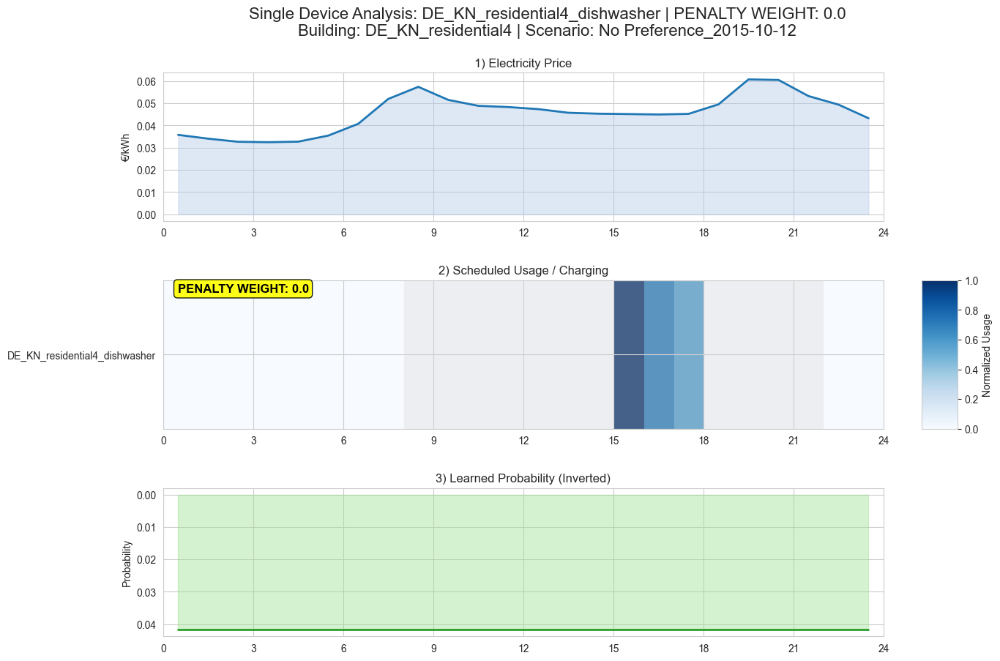

  📈 Plotting Low Preference (Weight: 5.0) for DE_KN_residential4_dishwasher


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


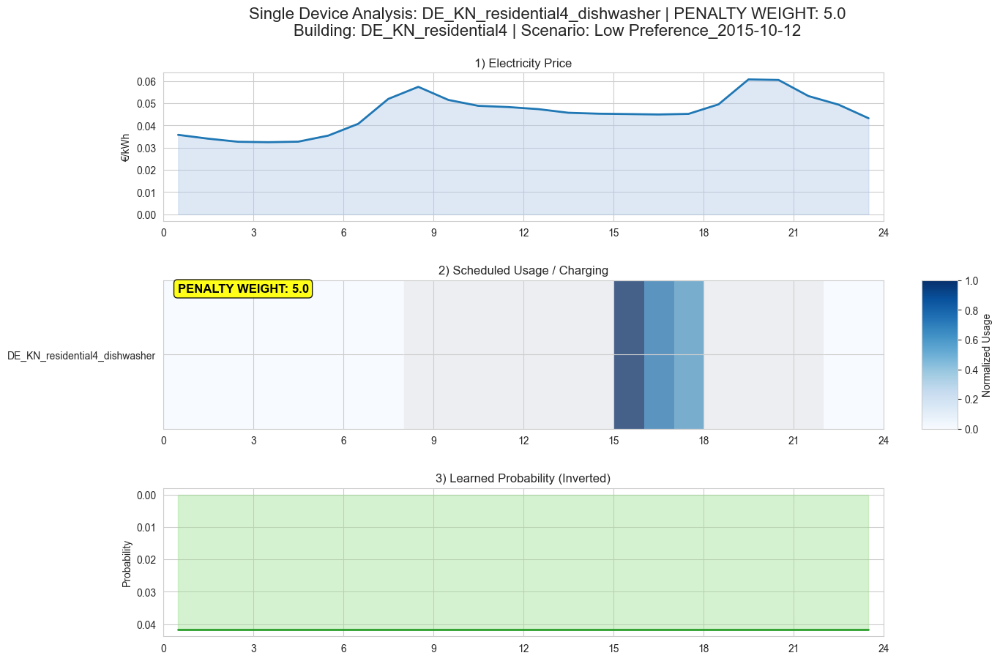

  📈 Plotting Medium Preference (Weight: 15.0) for DE_KN_residential4_dishwasher


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


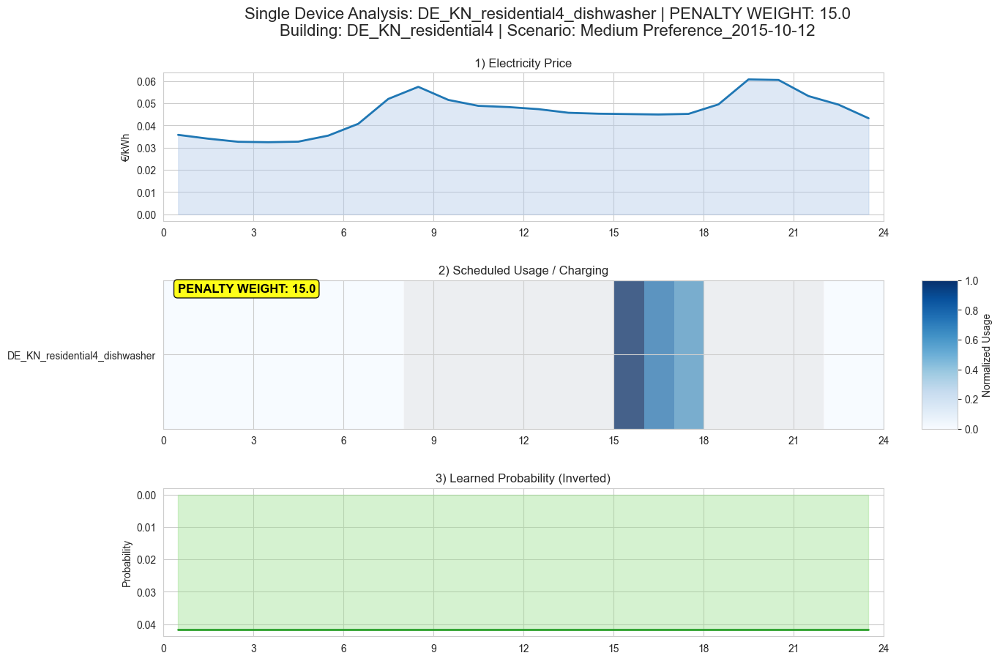

  📈 Plotting High Preference (Weight: 25.0) for DE_KN_residential4_dishwasher


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


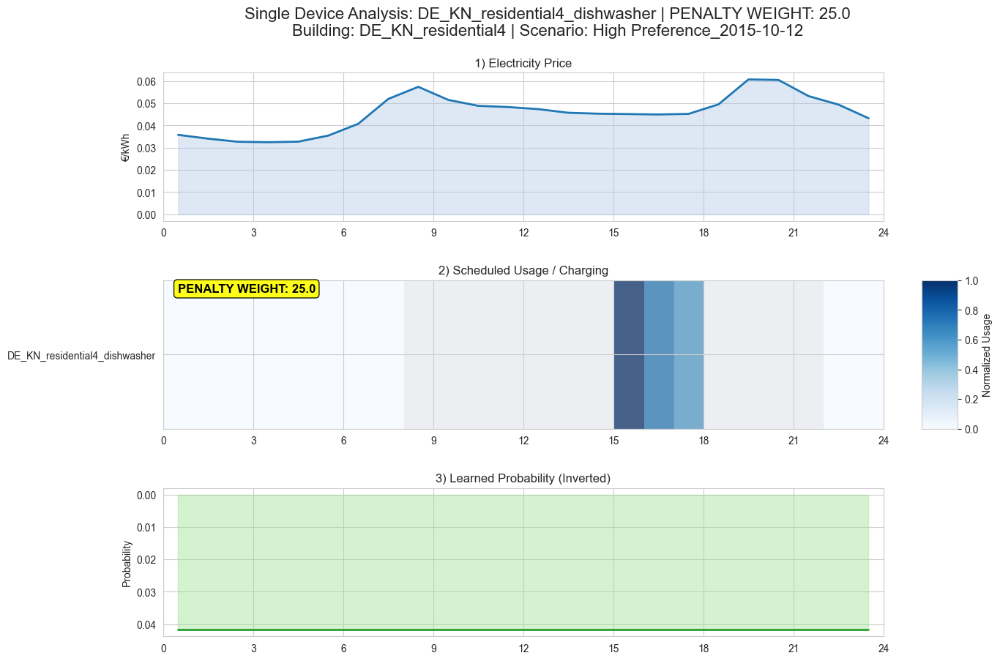


📊 Creating plots for DE_KN_residential4_ev on day 2015-10-12...
  📈 Plotting No Preference (Weight: 0.0) for DE_KN_residential4_ev


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


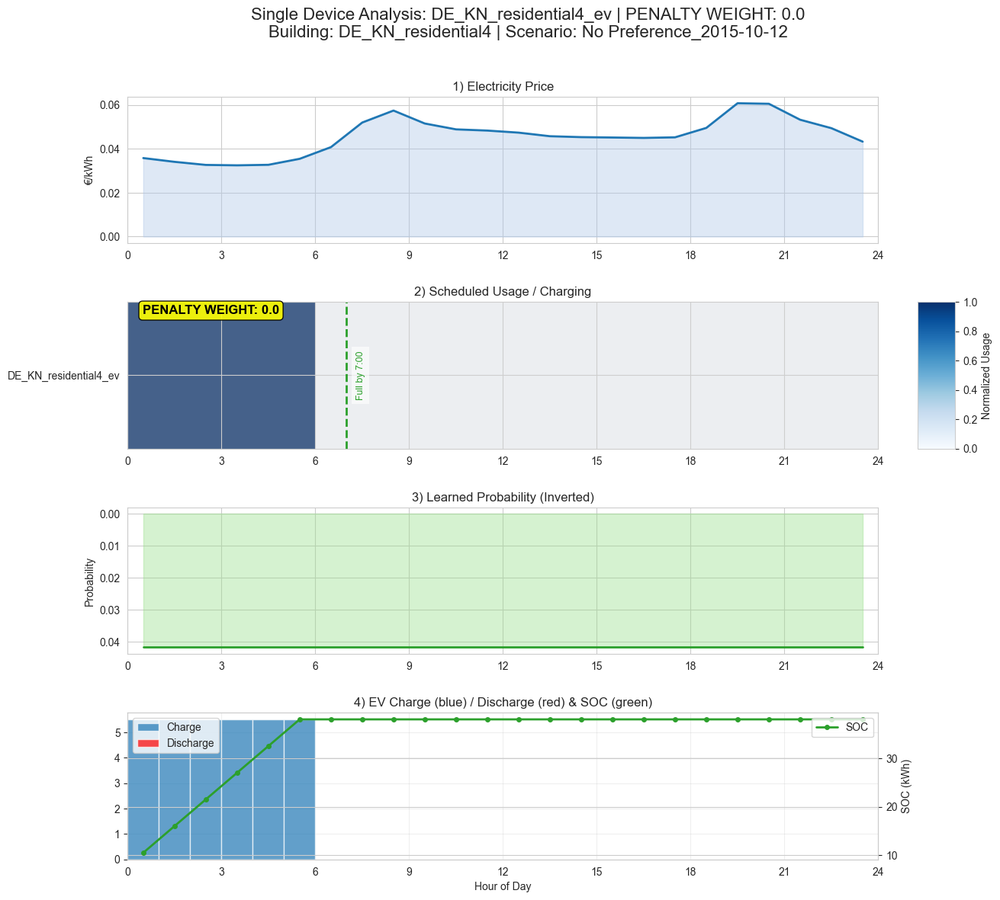

  📈 Plotting Low Preference (Weight: 5.0) for DE_KN_residential4_ev


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


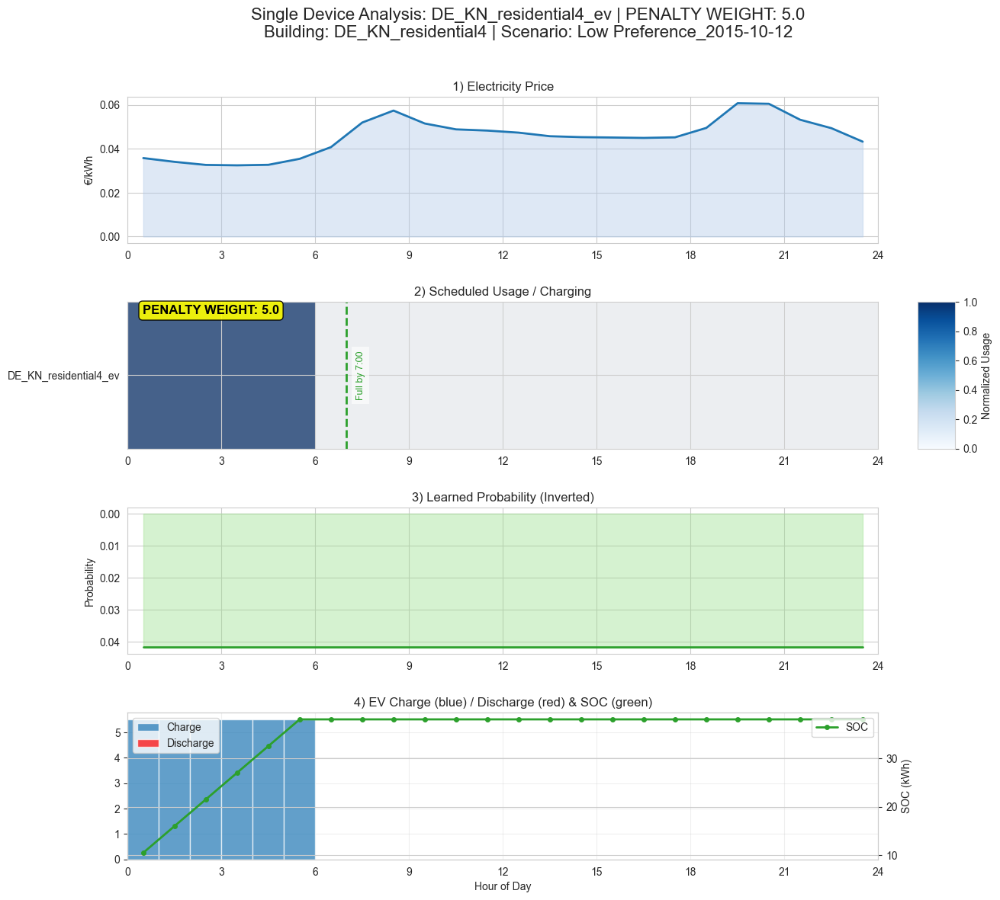

  📈 Plotting Medium Preference (Weight: 15.0) for DE_KN_residential4_ev


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


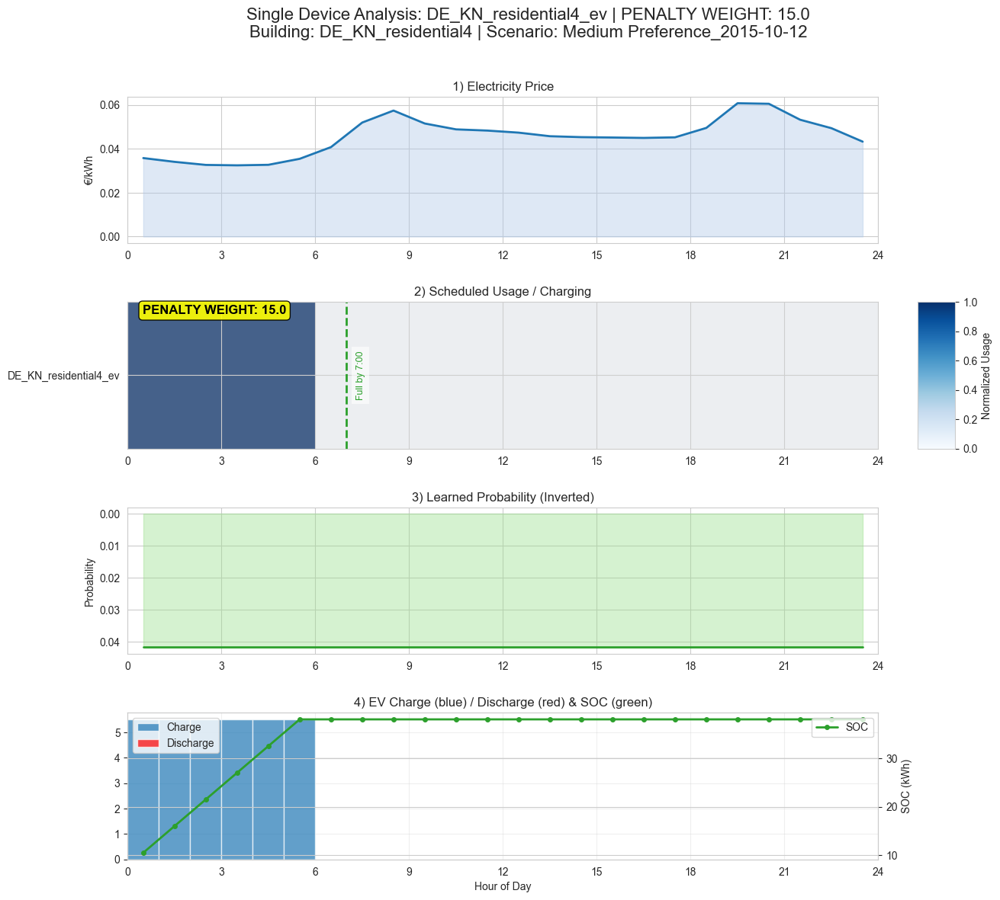

  📈 Plotting High Preference (Weight: 25.0) for DE_KN_residential4_ev


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


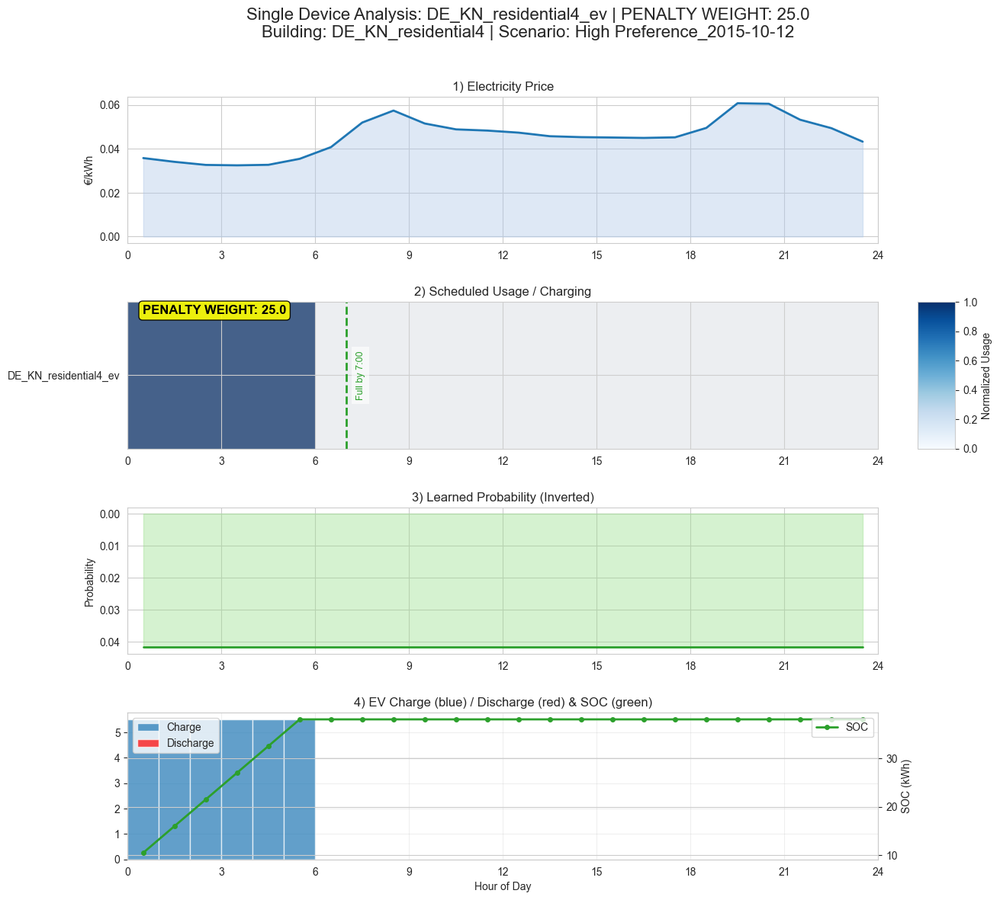


📊 Creating plots for DE_KN_residential4_freezer on day 2015-10-12...
  📈 Plotting No Preference (Weight: 0.0) for DE_KN_residential4_freezer


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


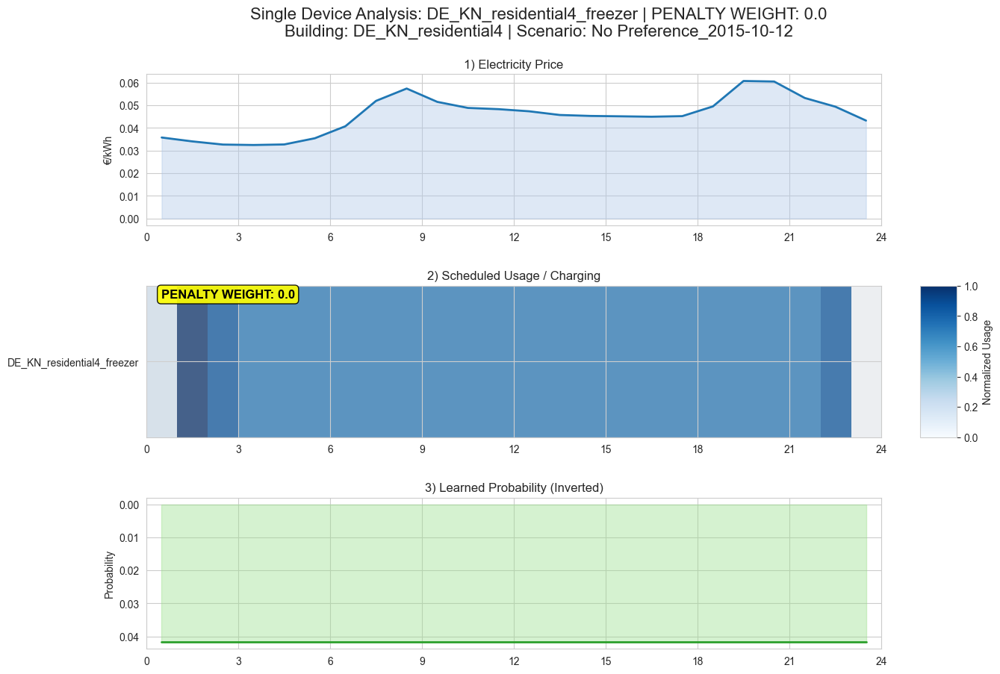

  📈 Plotting Low Preference (Weight: 5.0) for DE_KN_residential4_freezer


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


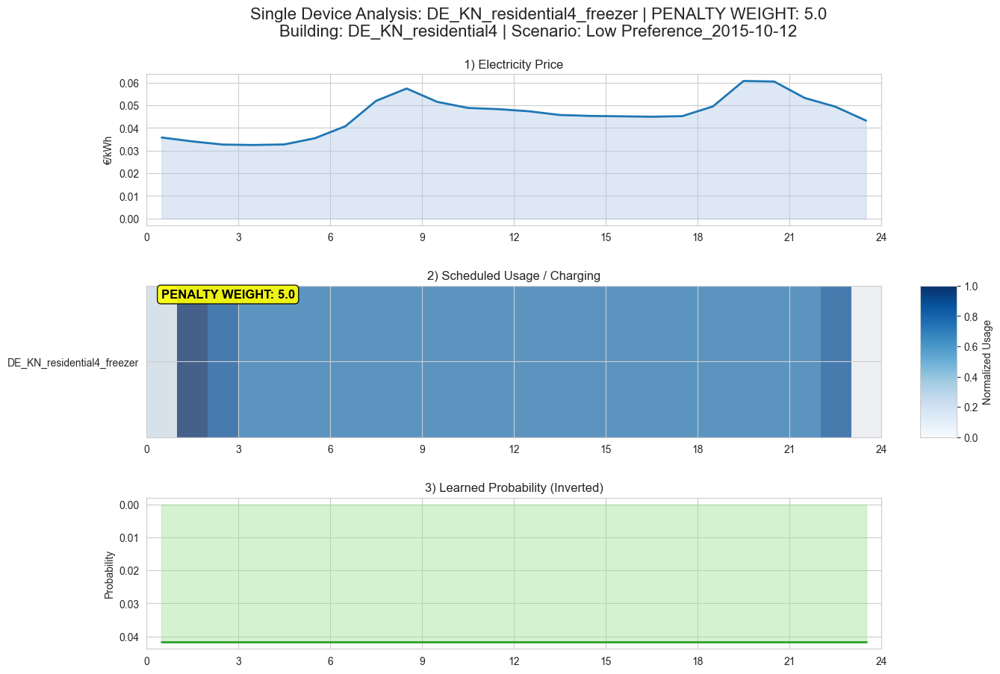

  📈 Plotting Medium Preference (Weight: 15.0) for DE_KN_residential4_freezer


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


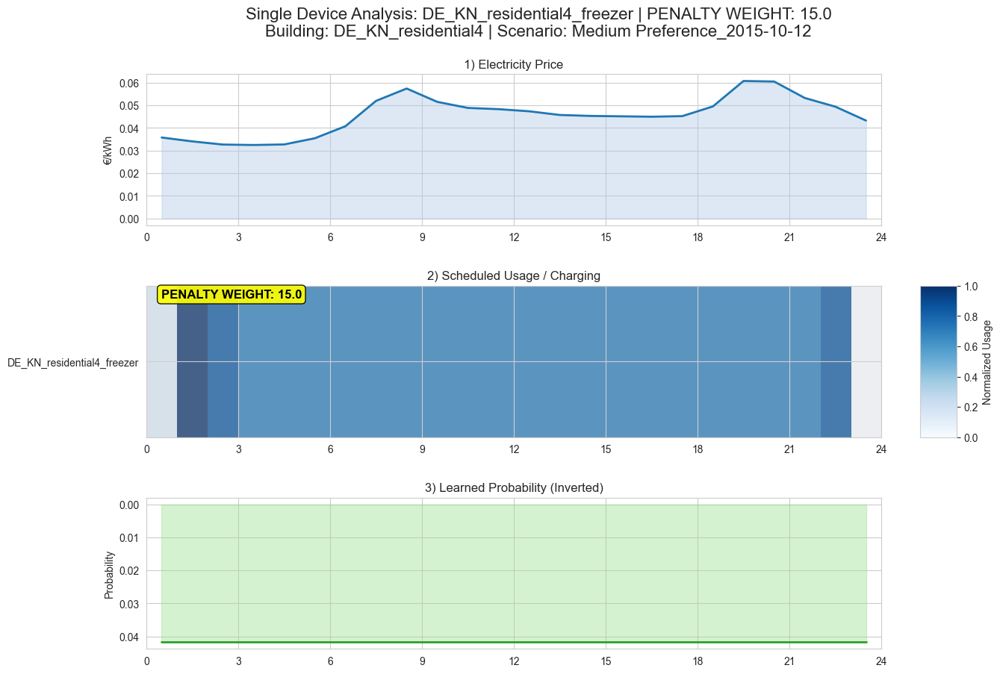

  📈 Plotting High Preference (Weight: 25.0) for DE_KN_residential4_freezer


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


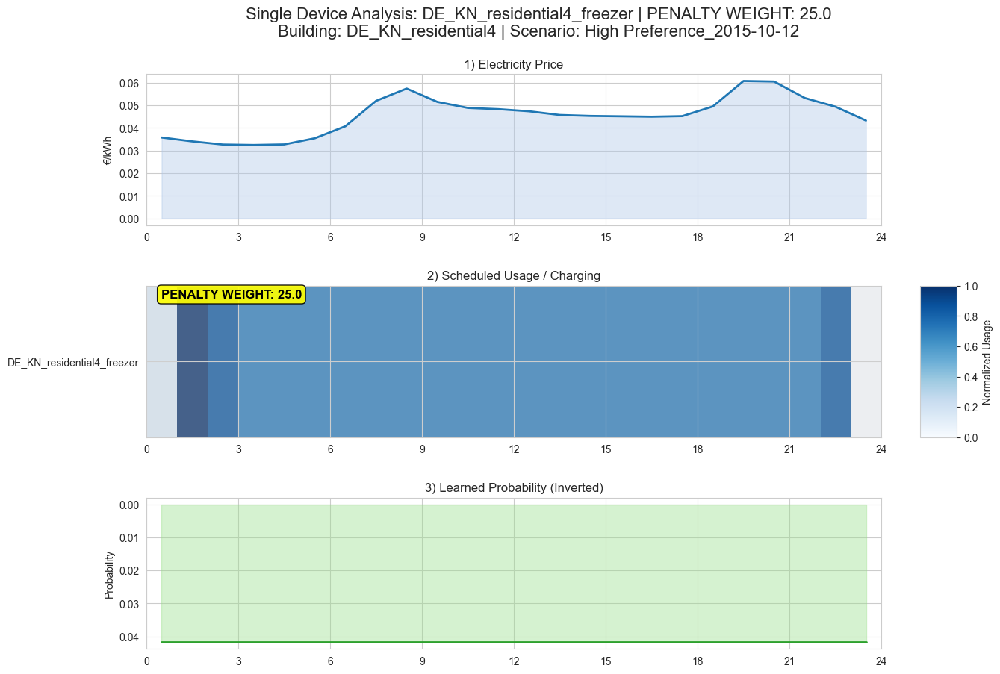


📊 Creating plots for DE_KN_residential4_heat_pump on day 2015-10-12...
  📈 Plotting No Preference (Weight: 0.0) for DE_KN_residential4_heat_pump


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


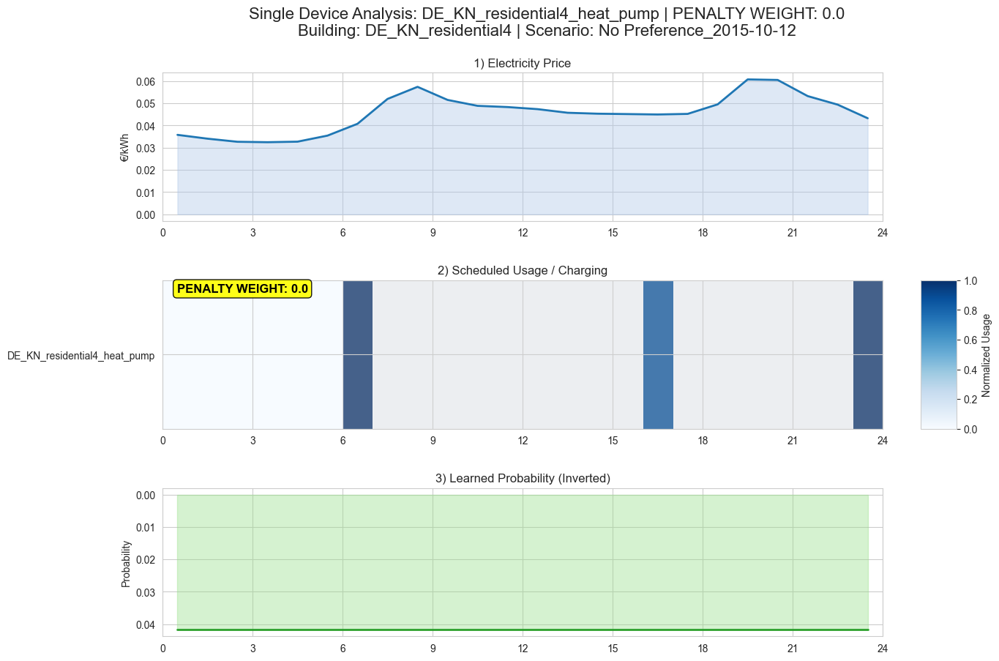

  📈 Plotting Low Preference (Weight: 5.0) for DE_KN_residential4_heat_pump


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


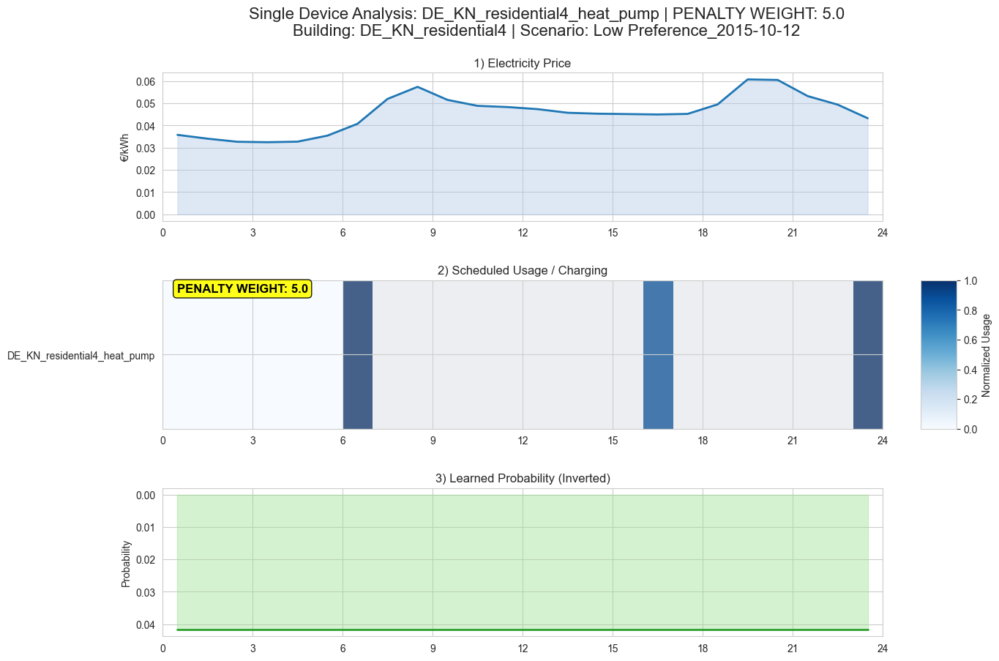

  📈 Plotting Medium Preference (Weight: 15.0) for DE_KN_residential4_heat_pump


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


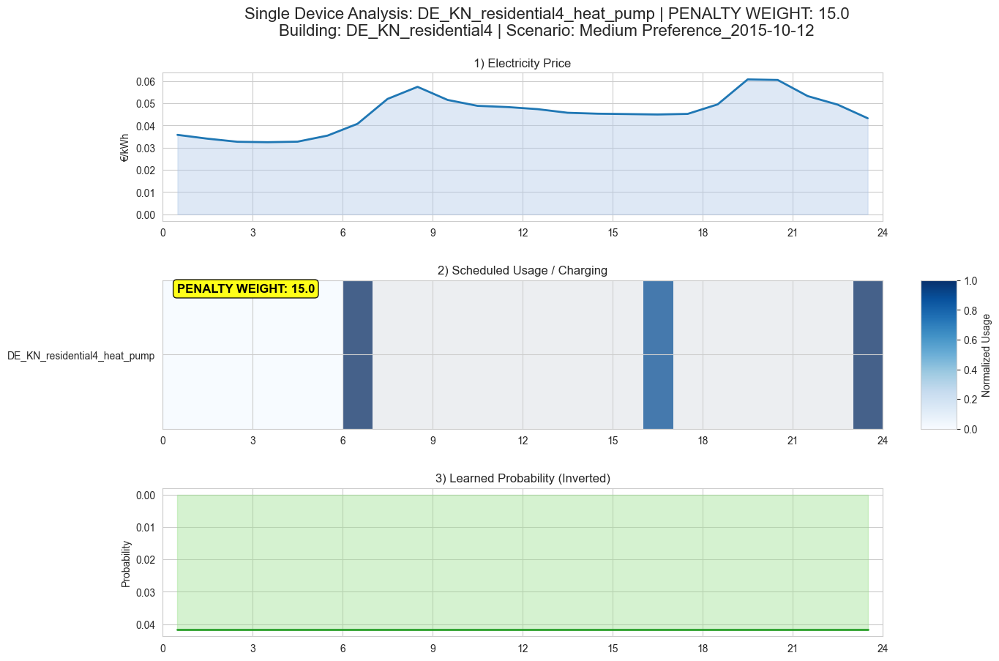

  📈 Plotting High Preference (Weight: 25.0) for DE_KN_residential4_heat_pump


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


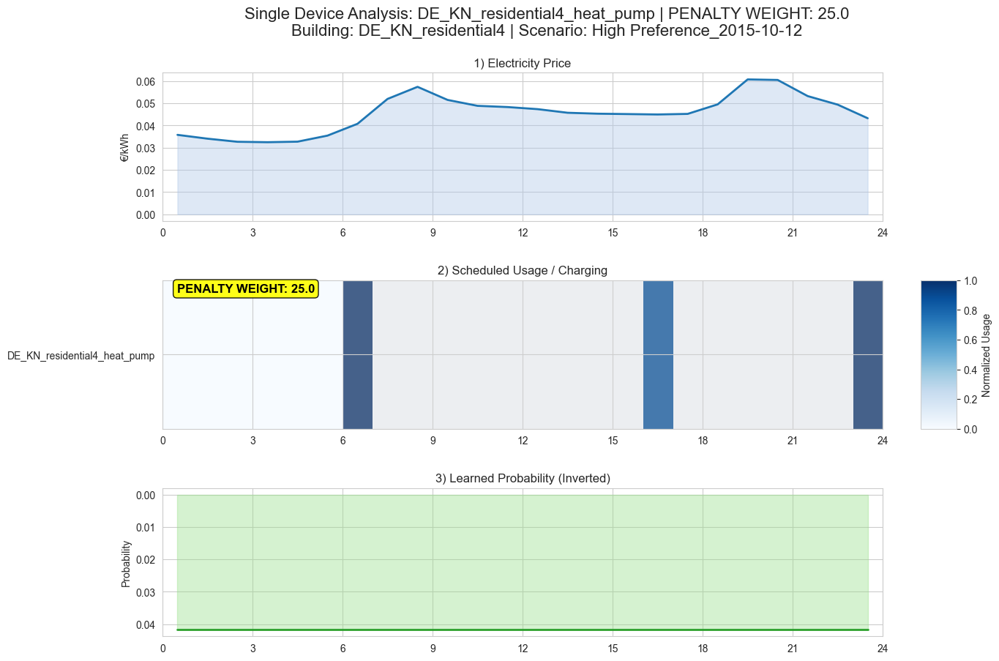


📊 Creating plots for DE_KN_residential4_refrigerator on day 2015-10-12...
  📈 Plotting No Preference (Weight: 0.0) for DE_KN_residential4_refrigerator


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


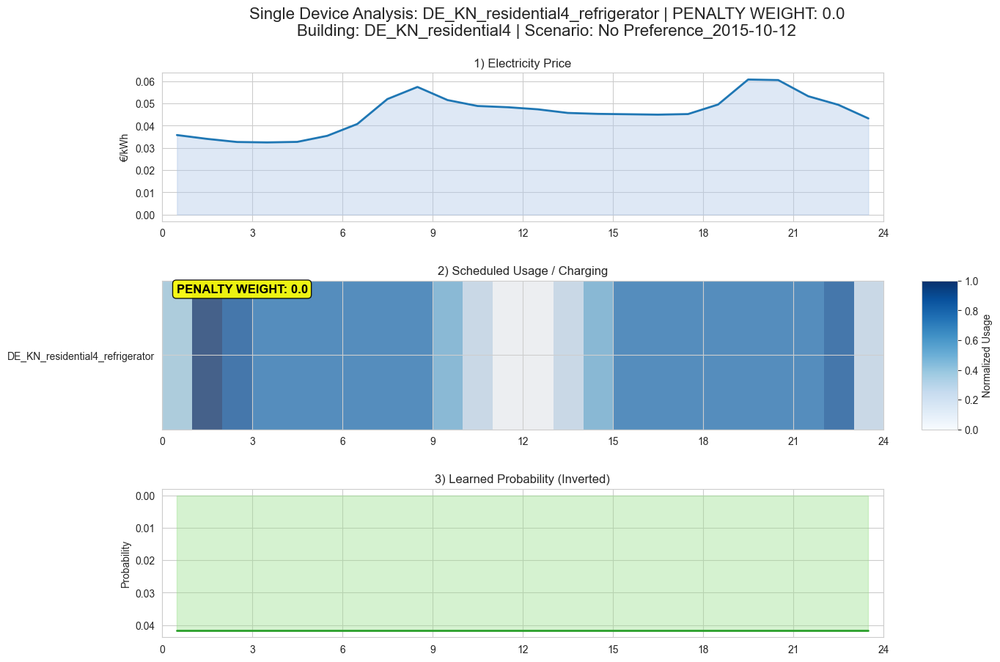

  📈 Plotting Low Preference (Weight: 5.0) for DE_KN_residential4_refrigerator


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


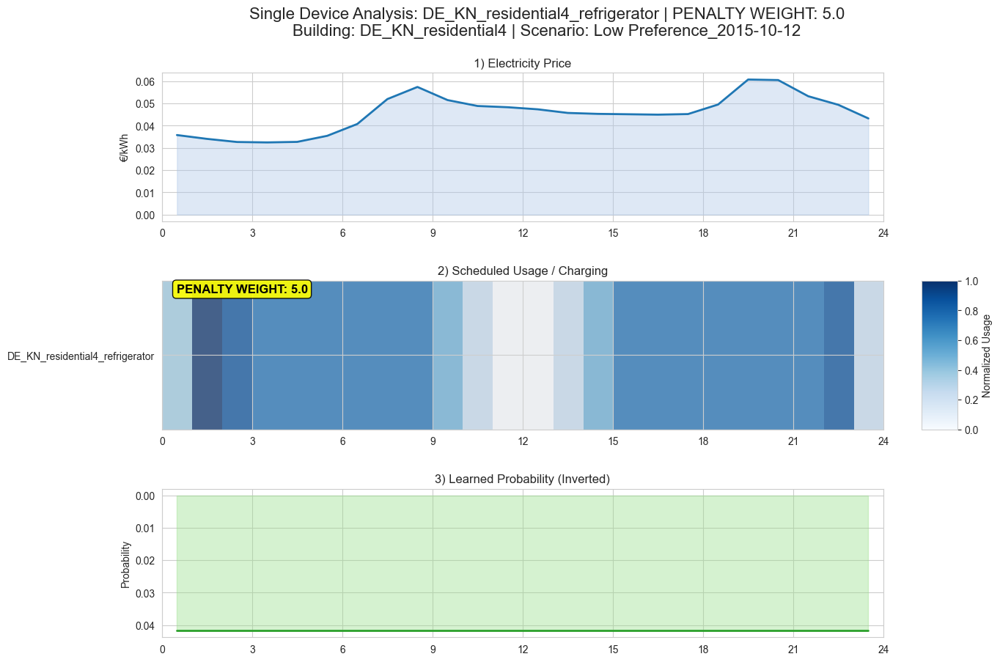

  📈 Plotting Medium Preference (Weight: 15.0) for DE_KN_residential4_refrigerator


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


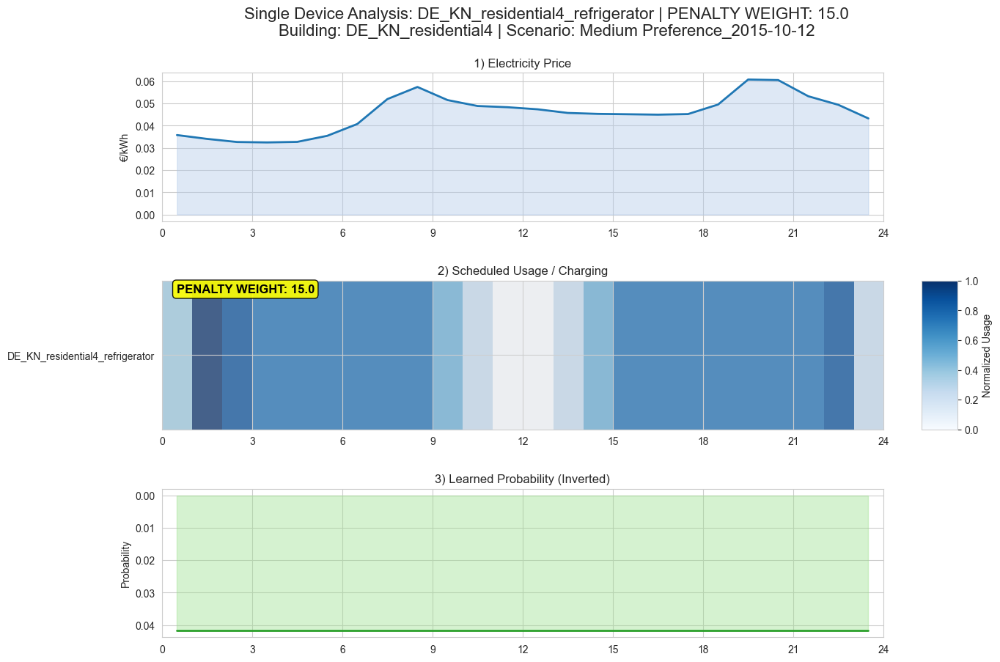

  📈 Plotting High Preference (Weight: 25.0) for DE_KN_residential4_refrigerator


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


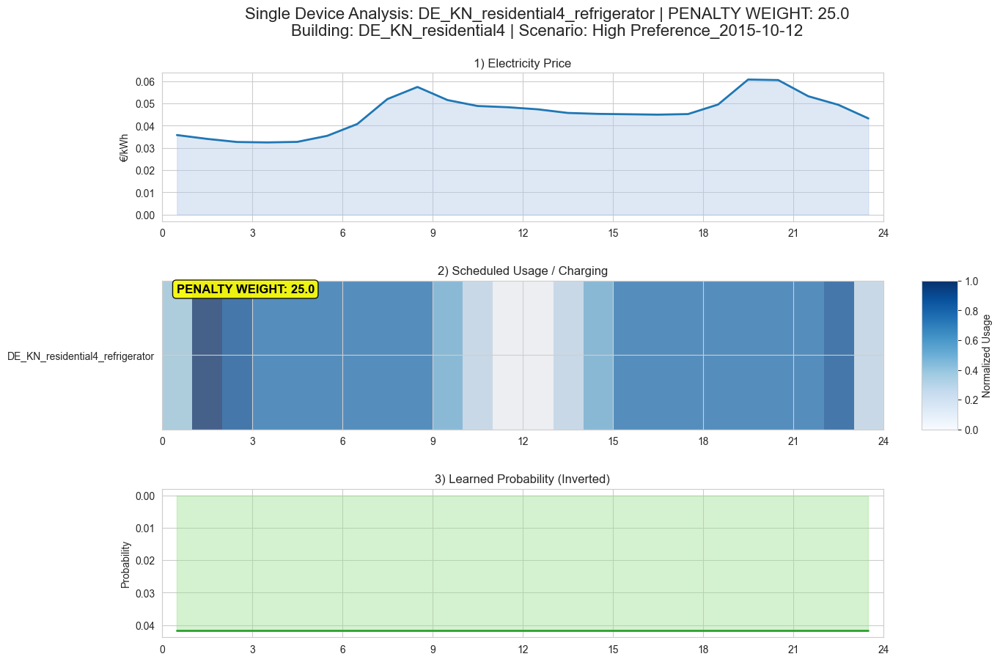


📊 Creating plots for DE_KN_residential4_washing_machine on day 2015-10-12...
  📈 Plotting No Preference (Weight: 0.0) for DE_KN_residential4_washing_machine


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\4266343707.py:482: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


KeyboardInterrupt: 

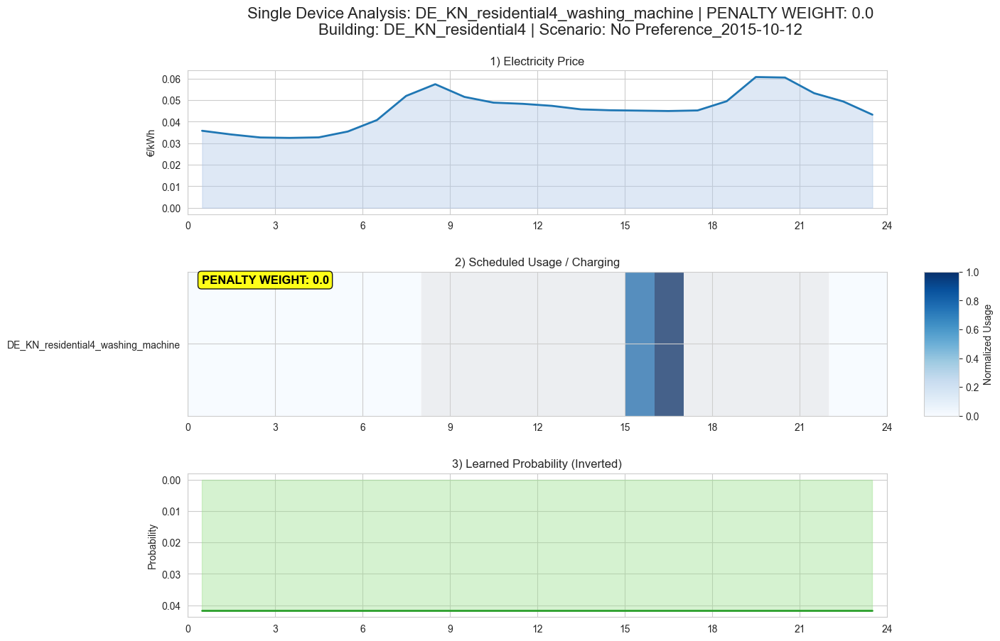

In [13]:
# import sys
# import os
# sys.path.append(os.path.abspath(os.path.join('..', 'scripts')))
# import common
# --- Section: Phase 1 — Probability Learning -------------------------------
print("🧠 Pipeline B: Learning + Phases Optimization...")
print("\n--- Phase 1: Probability Learning ---")

# (1) Initialize and train probability model
# Initialize with building ID for DuckDB priors
prob_agent = ProbabilityModelAgent(building_id=building_id, use_duckdb_priors=True)
prob_agent.LR_MAX = 0.10
prob_agent.LR_TAU = 20.0
training_days_str = [str(d) for d in selected_days]
print(f"✓ Training on days: {training_days_str}")

try:
    updated_specs, device_probs = prob_agent.train(
        building_id=building_id,
        days_list=training_days_str,
        device_specs=device_specs,
        weather_df=weather_sample,
        forecast_df=weather_sample
    )
    print("✓ Probability learning succeeded")
    learning_results = {
        name: {
            'probabilities': pdata['hour_probability'],
            'observation_count': pdata['observation_count'],
            'estimated_preferred_hour': pdata['estimated_preferred_hour'],
            'probability_updates': pdata['probability_updates']
        }
        for name, pdata in device_probs.items()
    }
    for name, lr in learning_results.items():
        print(f"  • {name}: {lr['observation_count']} obs")
except Exception as e:
    print(f"⚠ Learning failed: {e} — using uniform fallback")
    learning_results = {}
    cols = con.execute(f"DESCRIBE {view_name}").df()['column_name']
    dev_cols = [c for c in cols if building_id in c and 'grid' not in c.lower() and 'pv' not in c.lower()]
    for dc in dev_cols[:2]:
        nm = dc.replace(f"{building_id}_", "")
        learning_results[nm] = {
            'probabilities': {h: 1/24 for h in range(24)},
            'observation_count': len(selected_days),
            'estimated_preferred_hour': 12,
            'probability_updates': []
        }
        print(f"  • Fallback uniform fora {nm}")

print("✅ Phase 1 complete\n")
# ─────────────────────────────────────────────────────────────────────────────
# Immediately after Phase 1 completes:
print("🔍 Learned devices and their keys:")
for k in learning_results.keys():
    print("   •", repr(k))


# ─────────────────────────────────────────────────────────────────────────────
# Section: Phase 2 — Phases-Centralized Optimization (ALL devices, learned priors, robust price)
# ─────────────────────────────────────────────────────────────────────────────

print("\n--- Phase 2: Phases Optimization — Full Device Set, Learned Priors, Robust Price ---")
pipeline_b_results = {}

for day in selected_days:      # **all** days, not just first
    print(f"\nProcessing day {day}…")

    # (1) Load day data and ensure a 'day' column for cost‐eval
    query = f"""
      SELECT * FROM {view_name}
      WHERE DATE(utc_timestamp) = '{day}'
      ORDER BY utc_timestamp
    """
    df_day = con.execute(query).df()
    if df_day.empty:
        print(f"⚠ No data for {day}, skipping")
        continue

    # reset index, add 'day' and extract 'hour' once for price + diagnostics
    df_day = df_day.reset_index(drop=True).copy()
    df_day['day'] = day
    df_day['hour'] = df_day['utc_timestamp'].dt.hour

    # (2) Extract full‐day price curve (€/kWh) once
    # I want a reliable 24‐vector of prices for today
    if 'price_per_kwh' in df_day.columns:
        price_series = (
            df_day.groupby('hour')['price_per_kwh']
            .mean()
            .reindex(range(24), fill_value=df_day['price_per_kwh'].mean())
        )
    else:
        price_series = pd.Series([0.25]*24, index=range(24))
    print("  ✓ Extracted price series for plotting & optimization")

    # (3) Build GlobalConnectionLayer and device agents
    global_layer   = GlobalConnectionLayer(max_building_load=50.0, total_hours=24)
    devices        = []
    ev_agent_local = None

    # (3.a) Identify ALL device columns (no test slicing)
    dev_cols = [
        c for c in df_day.columns
        if building_id in c
        and 'grid' not in c.lower()
        and 'pv'   not in c.lower()
    ]

    for col in dev_cols:
        short = col.replace(f"{building_id}_", "")
        spec  = device_specs.get(short, {
            'category': 'Partially Flexible',
            'power_rating': 2.0,
            'flexibility_model': 'continuous'
        })

        # — EVAgent for the EV column
        if short.lower() in ('ev', 'electric_vehicle'):
            # I initialize the EVAgent exactly per its constructor :contentReference[oaicite:0]{index=0}
            ev = EVAgent(
                data=df_day,
                device_name=col,
                category=spec['category'],
                power_rating=spec['power_rating'],
                global_layer=global_layer,
                pv_agent=pv_agent,
                spec=spec
            )
            # I inject the learned PMF or fallback if truly missing
            ev.hour_probability = learning_results.get(col, {}) \
                                        .get('probabilities', {h:1/24 for h in range(24)})
            # I record original consumption for cost‐evaluation
            ev.original_consumption = df_day[col].values[:24].tolist()
            devices.append(ev)
            ev_agent_local = ev
            print(f"  ✓ EVAgent created for '{short}'")

        # — FlexibleDevice for all other loads
        else:
            fd = FlexibleDevice(
                data=df_day,
                device_name=col,
                category=spec['category'],
                power_rating=spec['power_rating'],
                global_layer=global_layer,
                battery_agent=battery_agent,
                pv_agent=pv_agent,
                spec=spec
            )
            fd.hour_probability = learning_results.get(col, {}) \
                                     .get('probabilities', {h:1/24 for h in range(24)})
            fd.original_consumption = df_day[col].values[:24].tolist()
            devices.append(fd)
            print(f"  ✓ FlexibleDevice created for '{short}'")

    # (4) Initialize GlobalOptimizer once
    optimizer = GlobalOptimizer(
        devices=devices,
        global_layer=global_layer,
        pv_agent=pv_agent,
        weather_agent=weather_agent,
        battery_agent=battery_agent,
        ev_agent=ev_agent_local,
        grid_agent=grid_agent,
        max_iterations=1,
        online_iterations=1
    )
    print("  ✓ GlobalOptimizer initialized with all devices")

    # (5) Run phases-centralized optimization
    try:
        ok = optimizer.optimize_phases_centralized(
            devices,
            global_layer,
            pv_agent,
            battery_agent,
            ev_agent_local,
            grid_agent,
            weather_agent
        )
        print(f"  ✓ optimize_phases_centralized() → {ok}")
    except Exception as e:
        print(f"  ⚠ optimize_phases_centralized failed: {e}")
        ok = optimizer.optimize_centralized()
        print(f"  ✓ fallback optimize_centralized() → {ok}")

    # (6) Extract battery schedule and SOC history
    charge   = getattr(battery_agent, 'hourly_charge',    [0]*24)
    discharge= getattr(battery_agent, 'hourly_discharge', [0]*24)
    batt_sched = [charge[h] - discharge[h] for h in range(24)]
    soc_hist   = getattr(battery_agent, 'hourly_soc', [battery_agent.initial_soc]*24)[:24]
    print("  ✓ Extracted battery schedule & SOC history")

    # (7) Gather each device’s phases schedule
    device_schedules = {}
    for d in devices:
        short = d.device_name.replace(f"{building_id}_", "")
        sched = getattr(d, 'phases_optimized_schedule', None)
        if isinstance(sched, (list, np.ndarray)) and len(sched) == 24:
            device_schedules[short] = list(sched)

    # (8) Store results for downstream plotting
    pipeline_b_results[day] = {
        'learning_results': learning_results,
        'phases_result': {
            'success': ok,
            'battery_schedule': batt_sched,
            'device_schedules': device_schedules,
            'price_series': price_series
        },
        'battery_schedule': batt_sched,
        'soc_history': soc_hist,
        'devices': devices,
        'optimizer': optimizer
    }
    print(f"  ✓ Phase 2 completed for {day}")

print(f"\n✅ Pipeline B Phase 2 finished for {len(pipeline_b_results)} day(s)")


📊 Pipeline B Visualization: Learning probabilities + Battery optimization...

--- Pipeline B Plots for 2015-10-11 ---


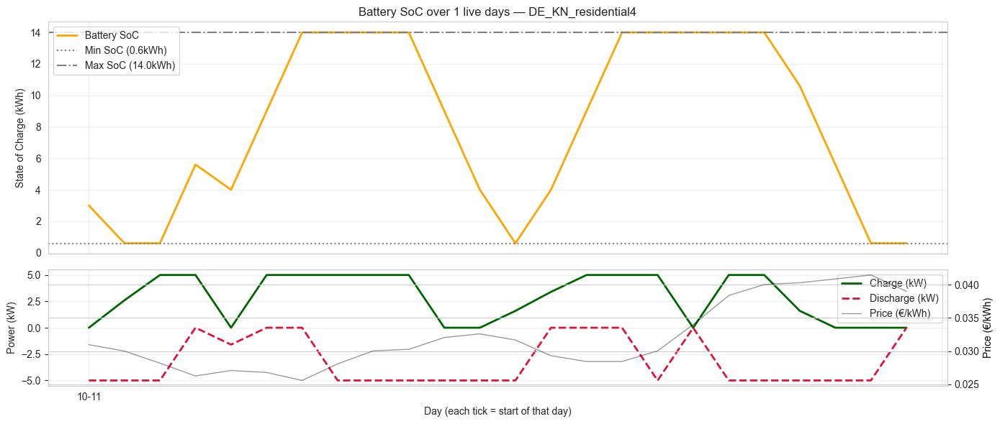

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-12 ---


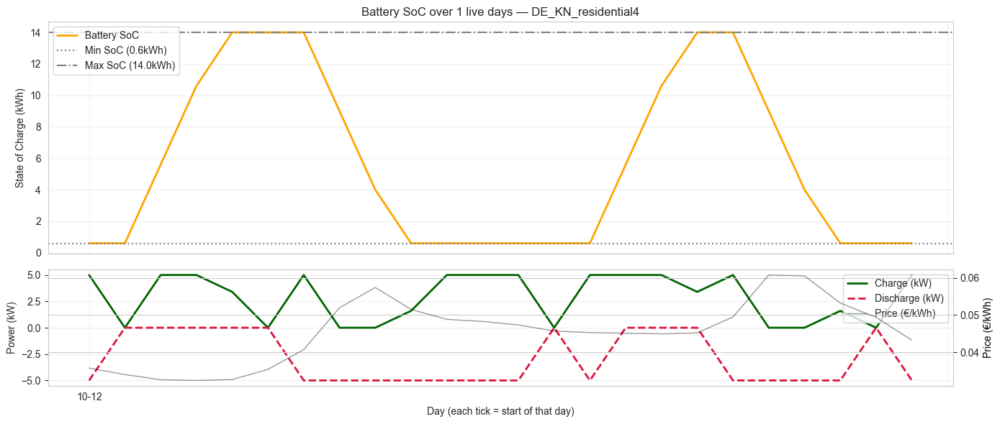

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-13 ---


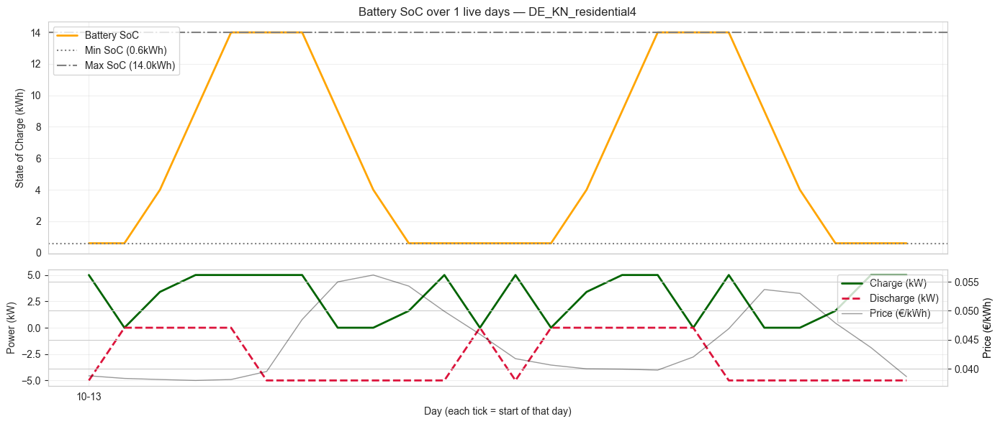

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-14 ---


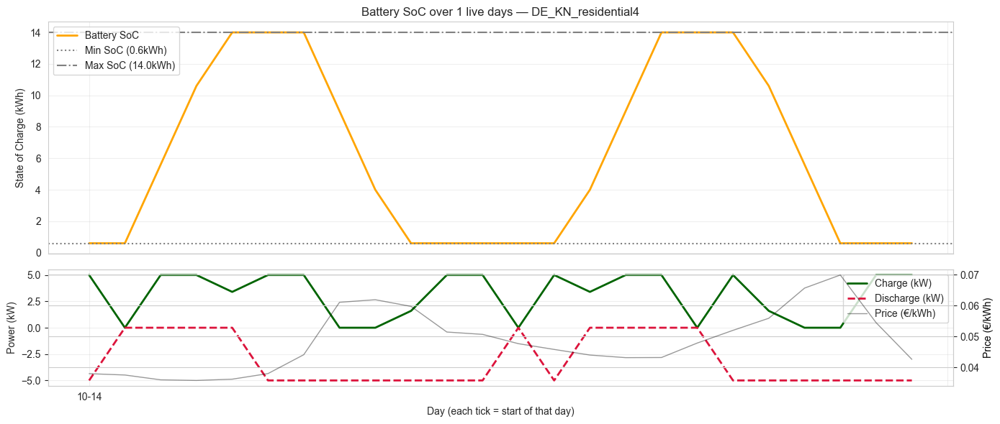

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-15 ---


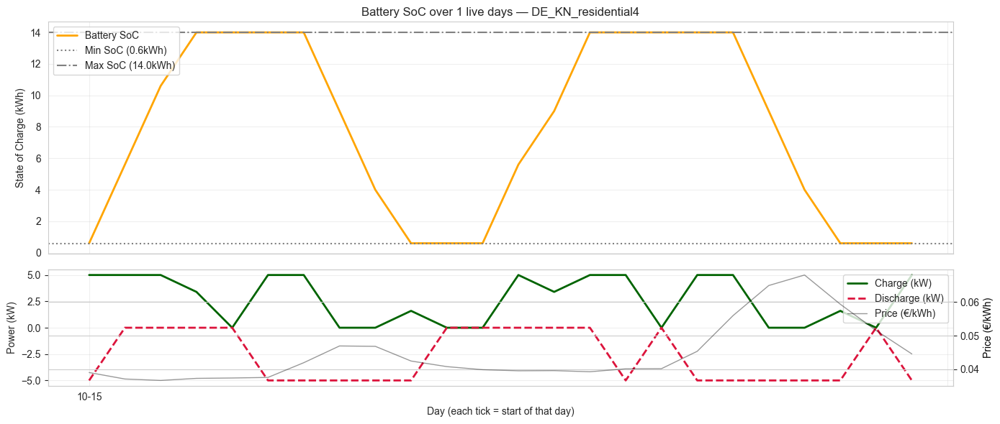

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-16 ---


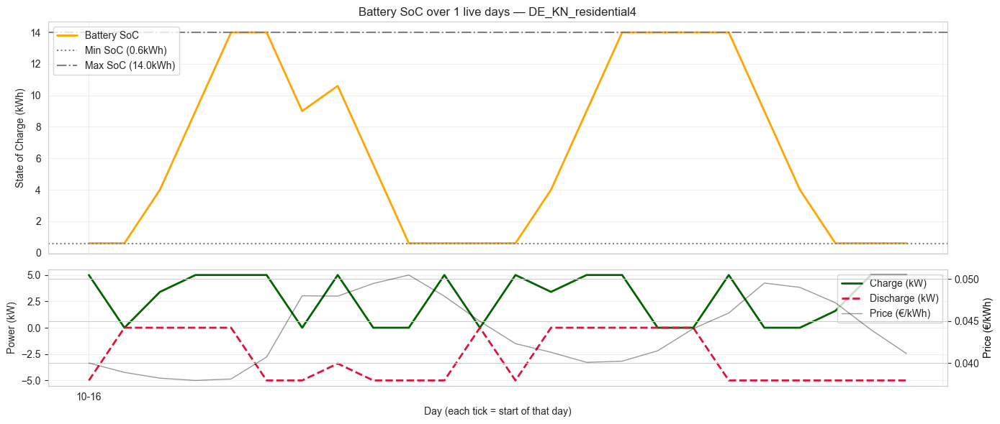

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-17 ---


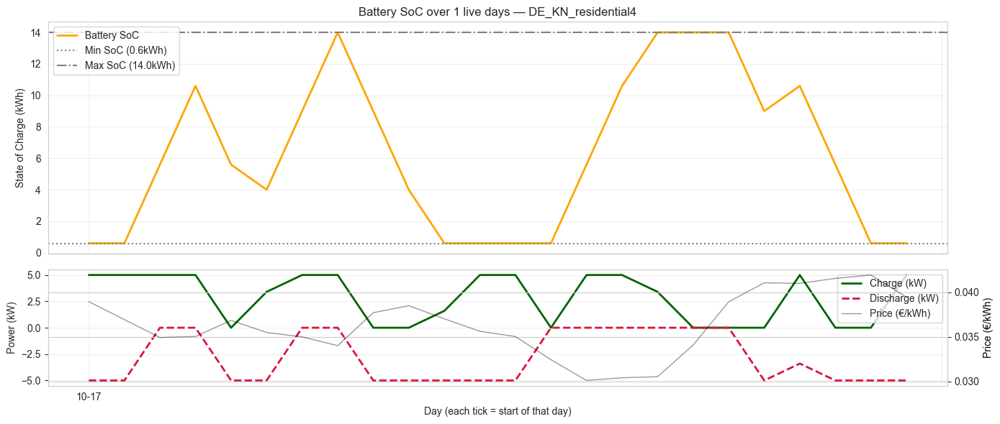

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-18 ---


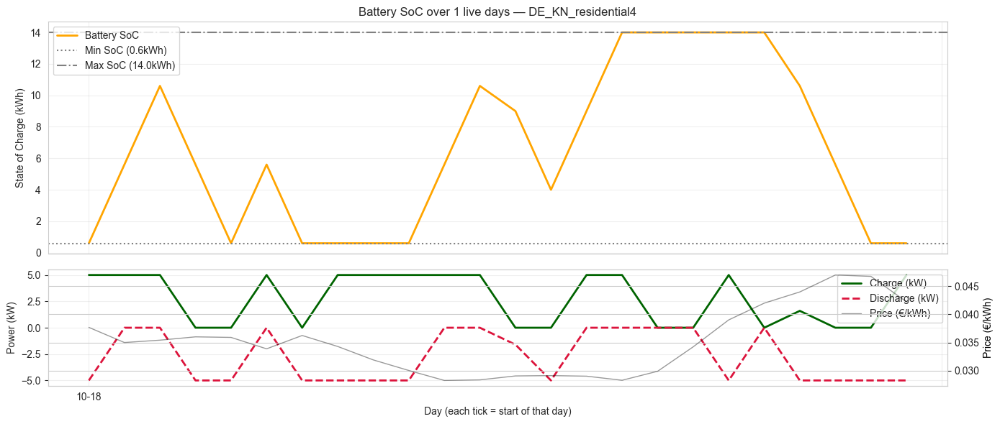

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-19 ---


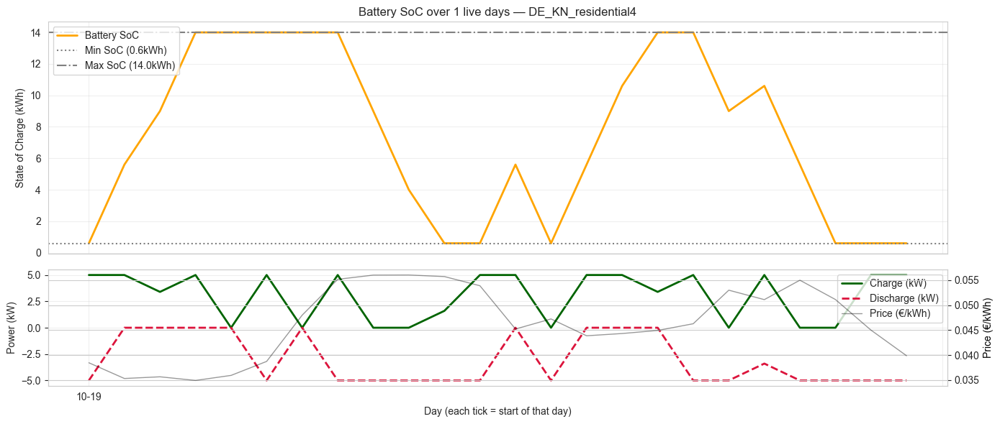

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-20 ---


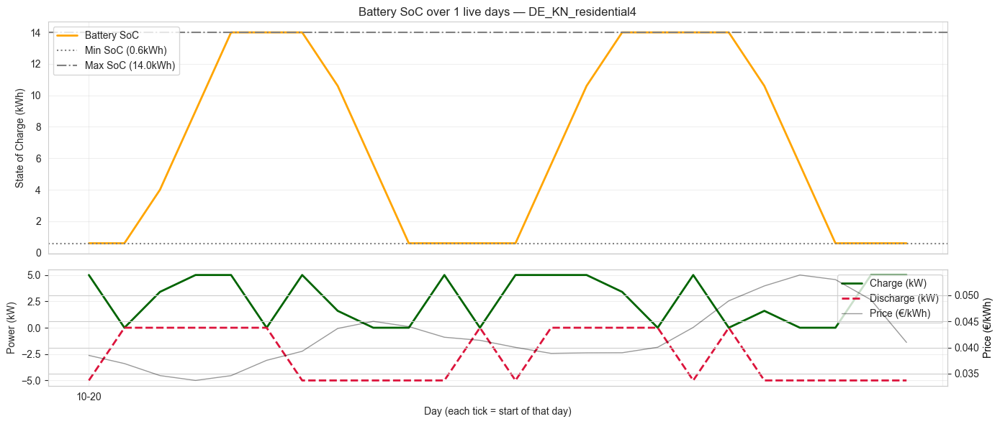

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-21 ---


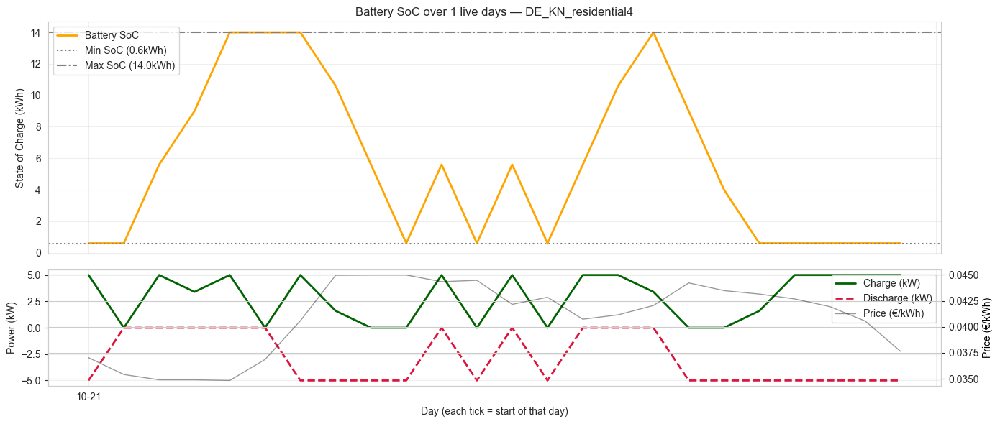

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-22 ---


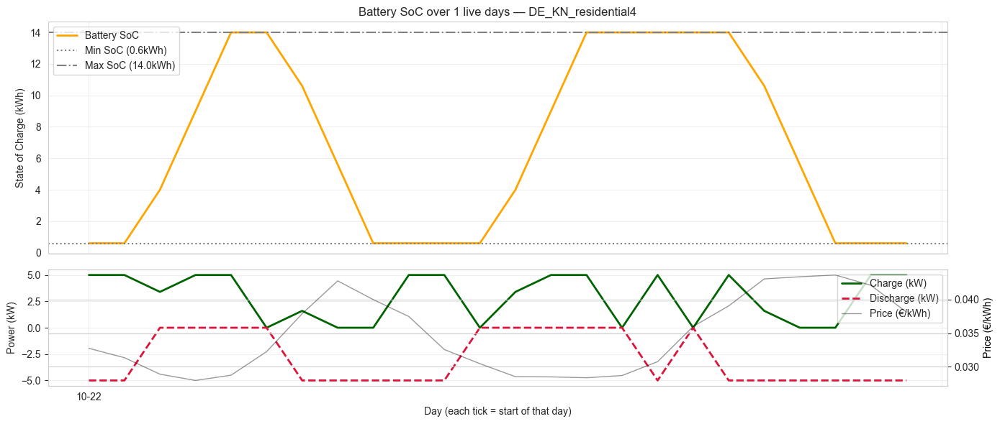

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-23 ---


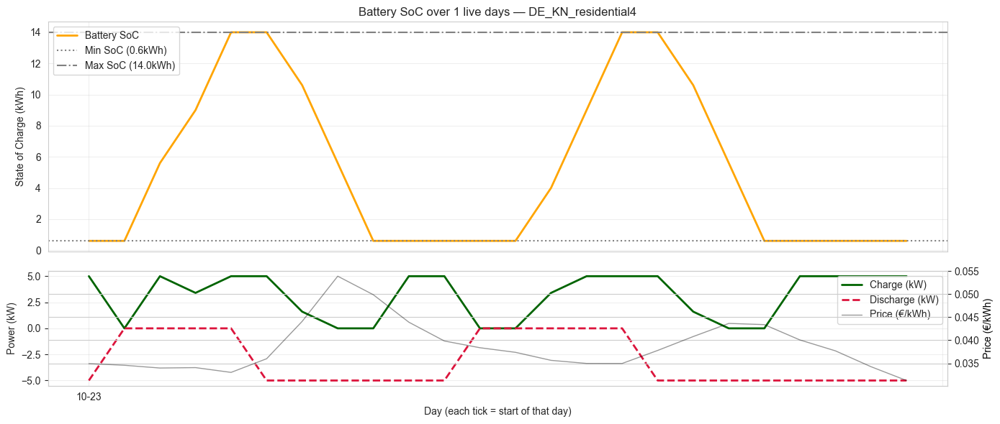

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-24 ---


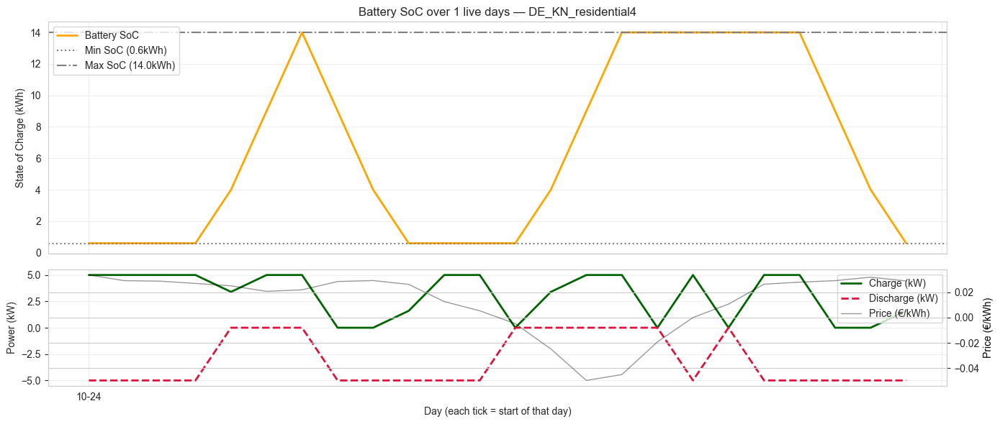

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-26 ---


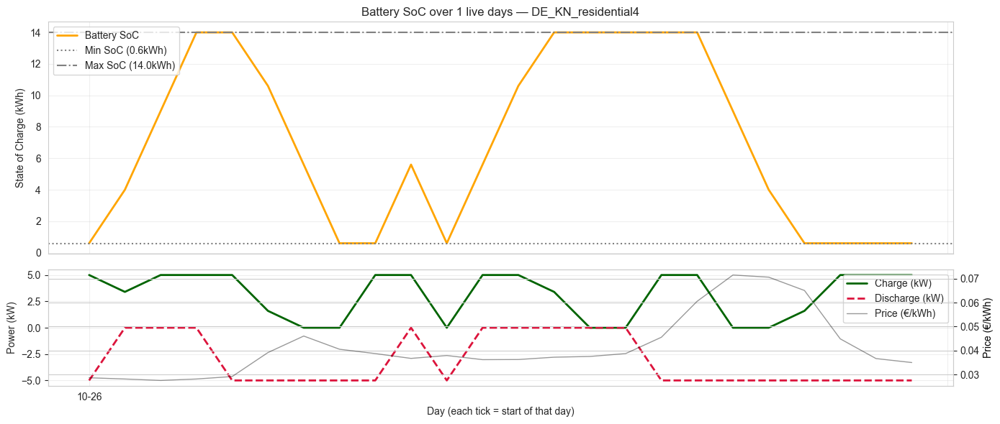

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-27 ---


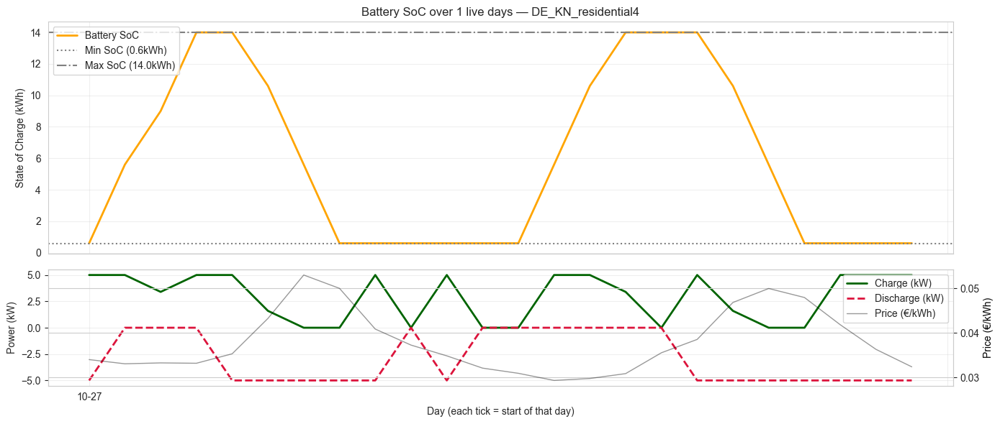

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-28 ---


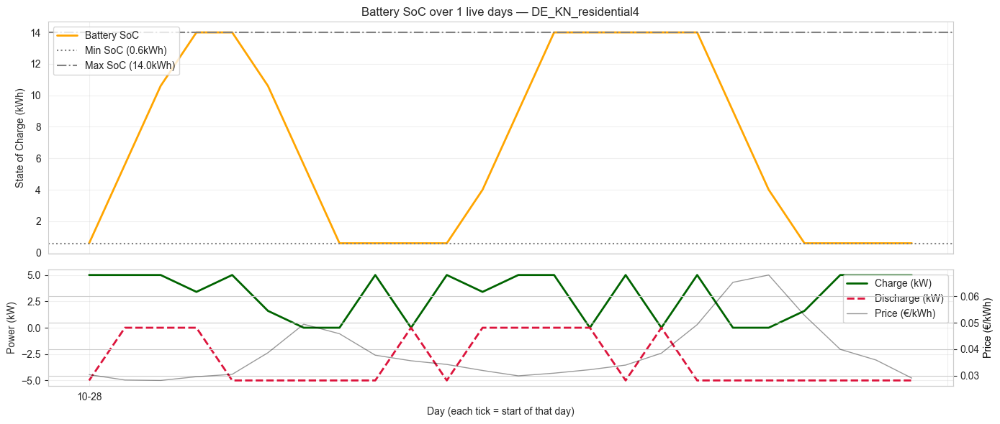

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-29 ---


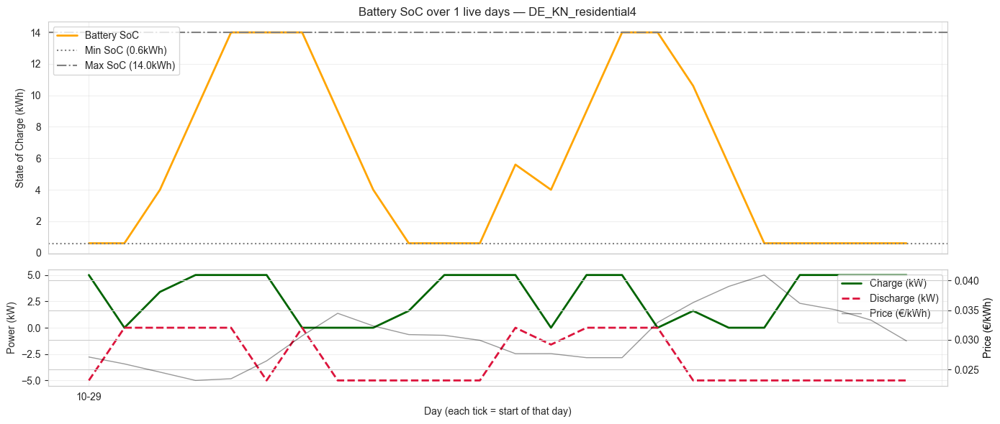

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-30 ---


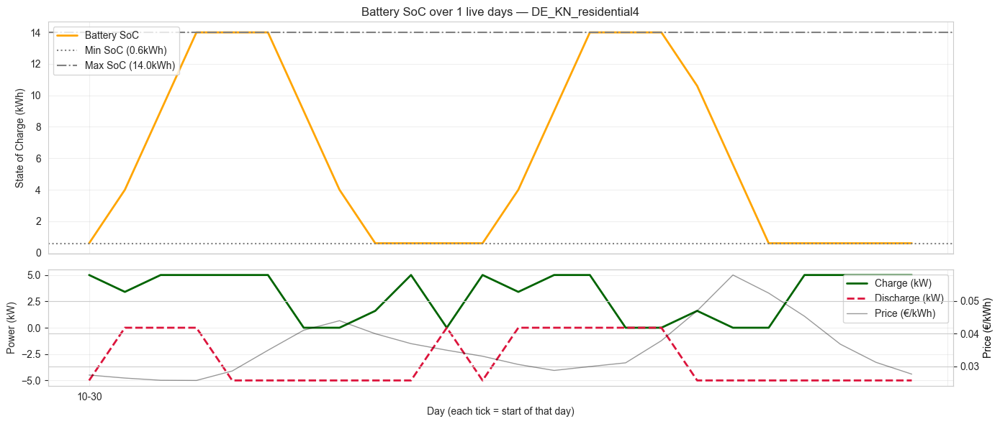

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-10-31 ---


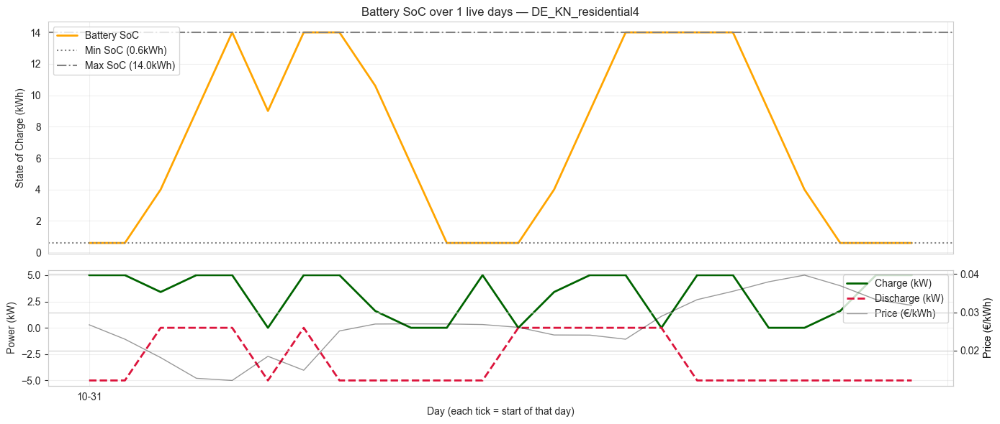

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-11-01 ---


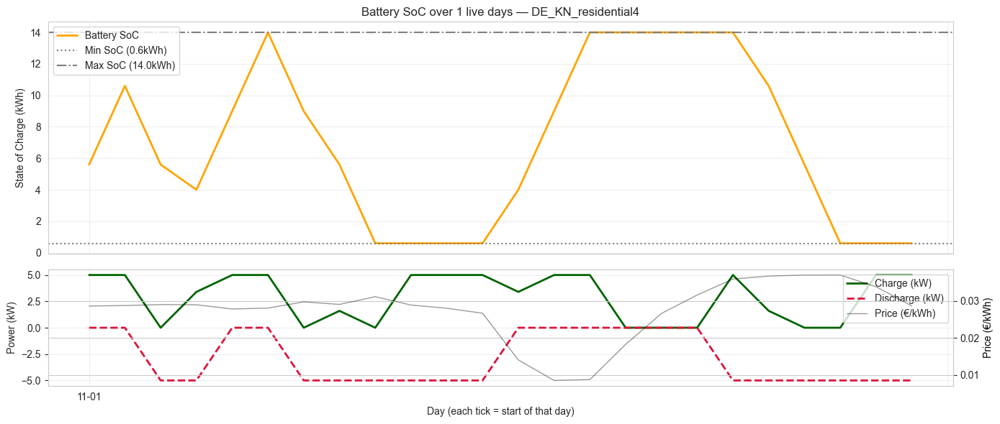

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-11-02 ---


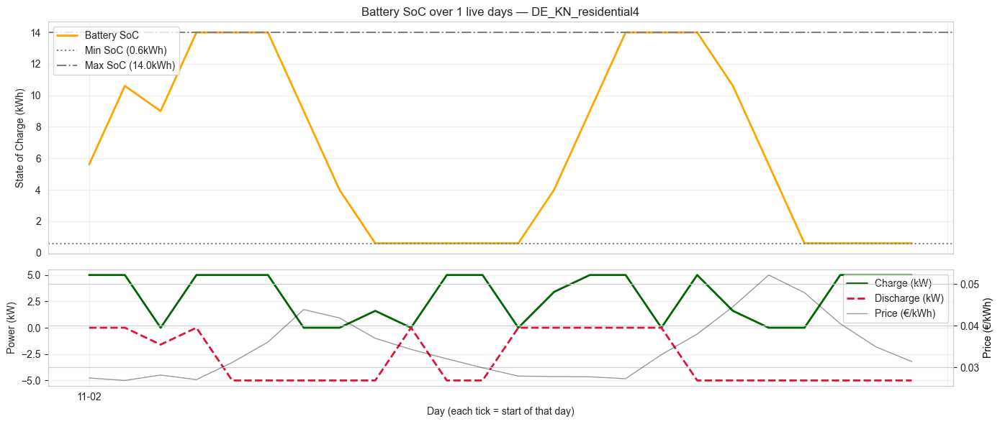

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-11-03 ---


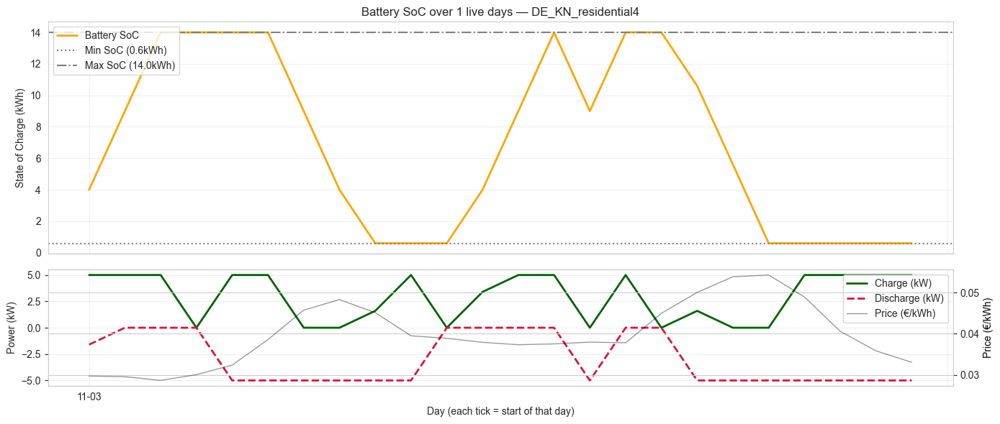

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-11-04 ---


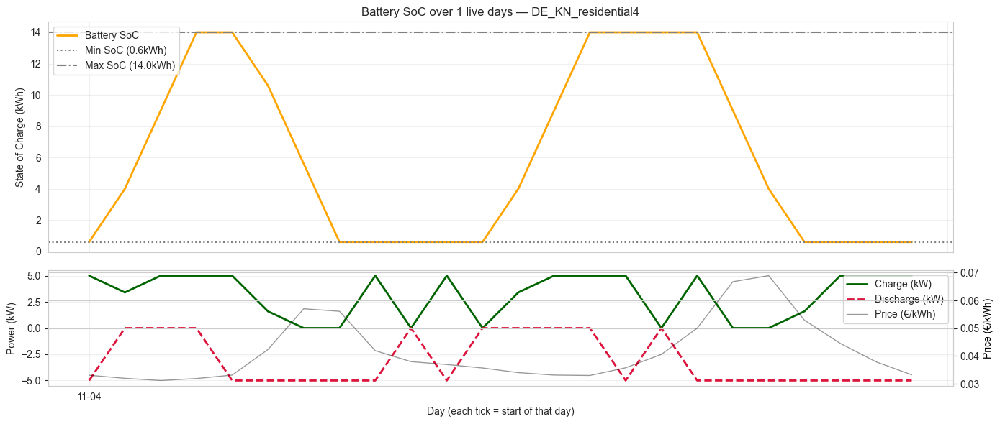

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-11-05 ---


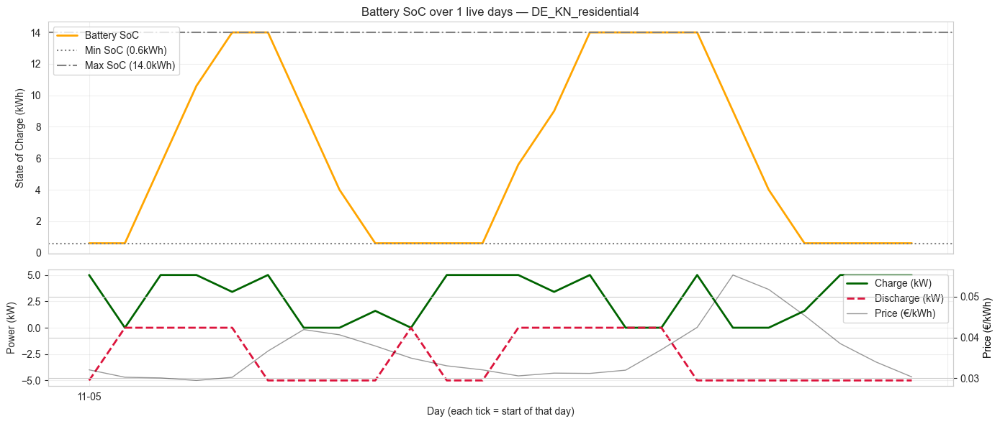

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-11-06 ---


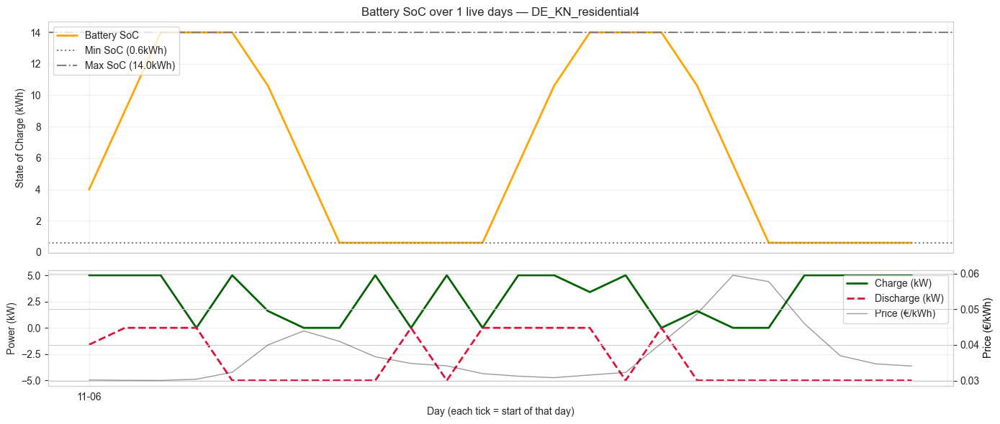

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-11-07 ---


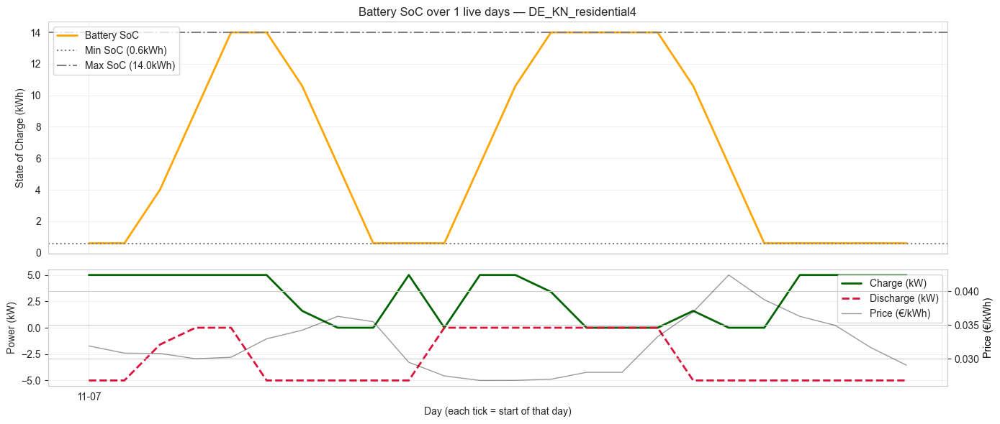

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-11-08 ---


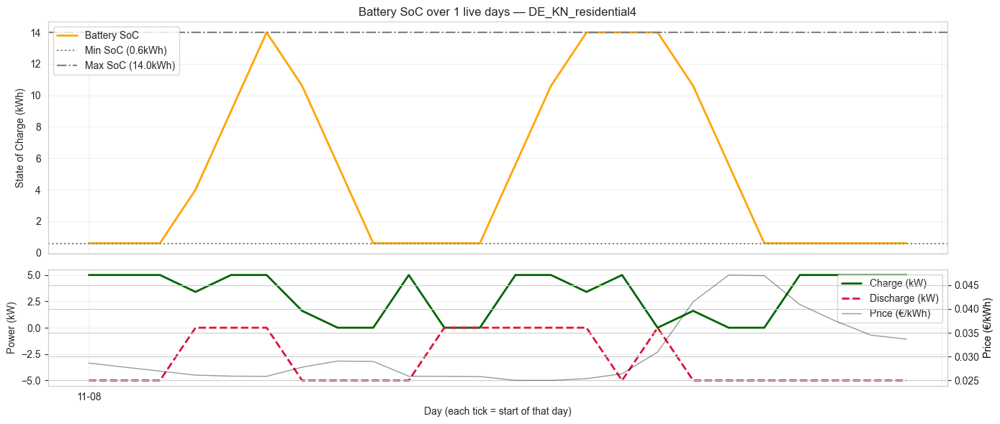

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-11-09 ---


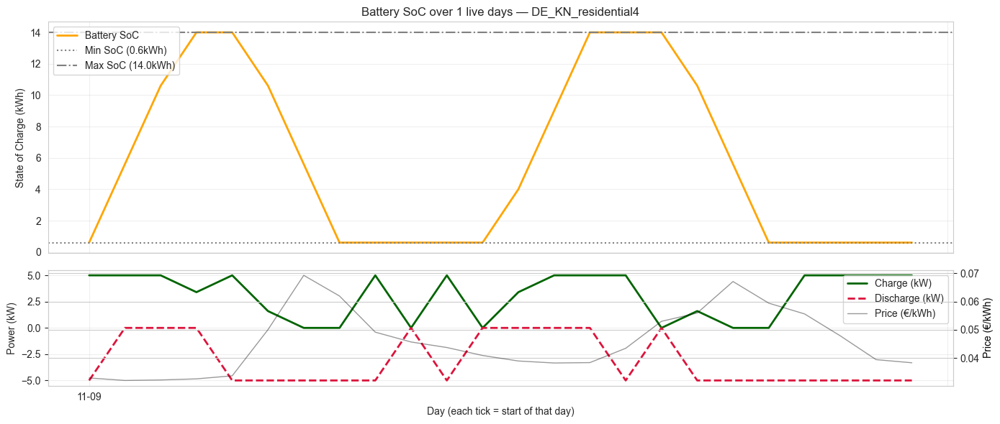

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'

--- Pipeline B Plots for 2015-11-10 ---


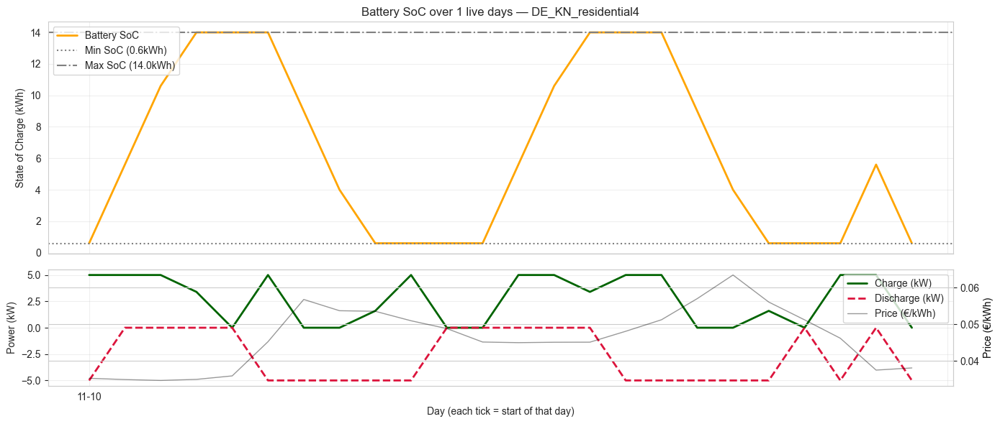

    ✓ plot_multi_day_battery_line for battery over days
    ⚠ plot_unified_battery_usage failed: 'dishwasher'
✅ Pipeline B visualization completed


In [12]:
# Pipeline B Visualization: Learning + Battery + Heatmaps
print("📊 Pipeline B Visualization: Learning probabilities + Battery optimization...")

for day, results in pipeline_b_results.items():
    print(f"\n--- Pipeline B Plots for {day} ---")
    
    devices = results['devices']
    # 1. Multi-day battery line (here just one day, but we still pass a list of tuples)
    try:
        # build the expected list-of-(day,devices) format
        scheduling_results = [(day, devices)]
        plot_multi_day_battery_line(scheduling_results, building_id)
        print(f"    ✓ plot_multi_day_battery_line for battery over days")
    except Exception as e:
        print(f"    ⚠ plot_multi_day_battery_line failed: {e}")

    # 2. Unified battery + probability view
    try:
        # unchanged: uses battery_schedule + soc_history + probabilities
        devices_with_batt = {}
        for dev in devices:
            short = dev.device_name.replace(f"{building_id}_", "")
            devices_with_batt[short] = {
                'battery_schedule': results['battery_schedule'],
                'soc_history':      results['soc_history'],
                'probabilities':    results['learning_results'][short]['probabilities']
            }
        plot_unified_battery_usage(devices_with_batt, building_id)
        print(f"    ✓ plot_unified_battery_usage for unified analysis")
    except Exception as e:
        print(f"    ⚠ plot_unified_battery_usage failed: {e}")

print("✅ Pipeline B visualization completed")



=== Full scenario heatmaps for 2015-10-11 ===


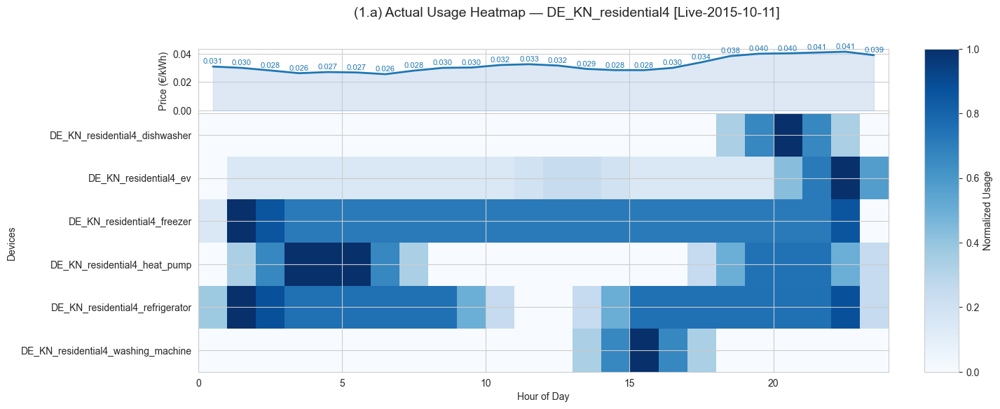

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


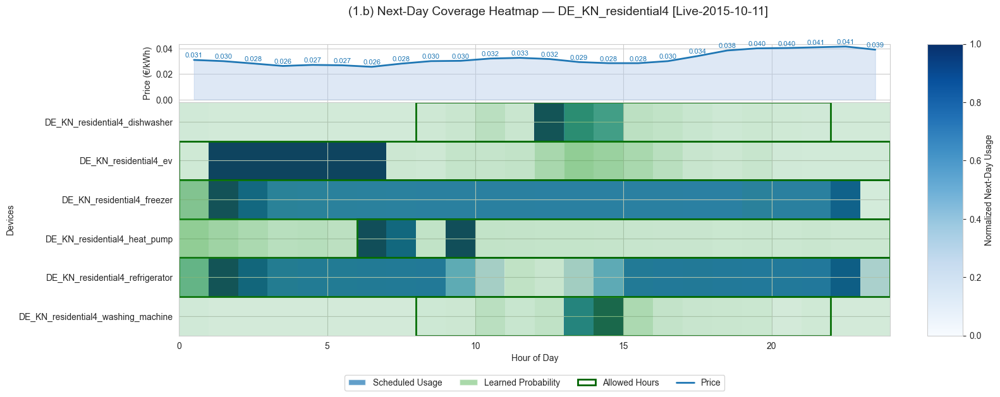

--- Single‐device plot for dishwasher ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


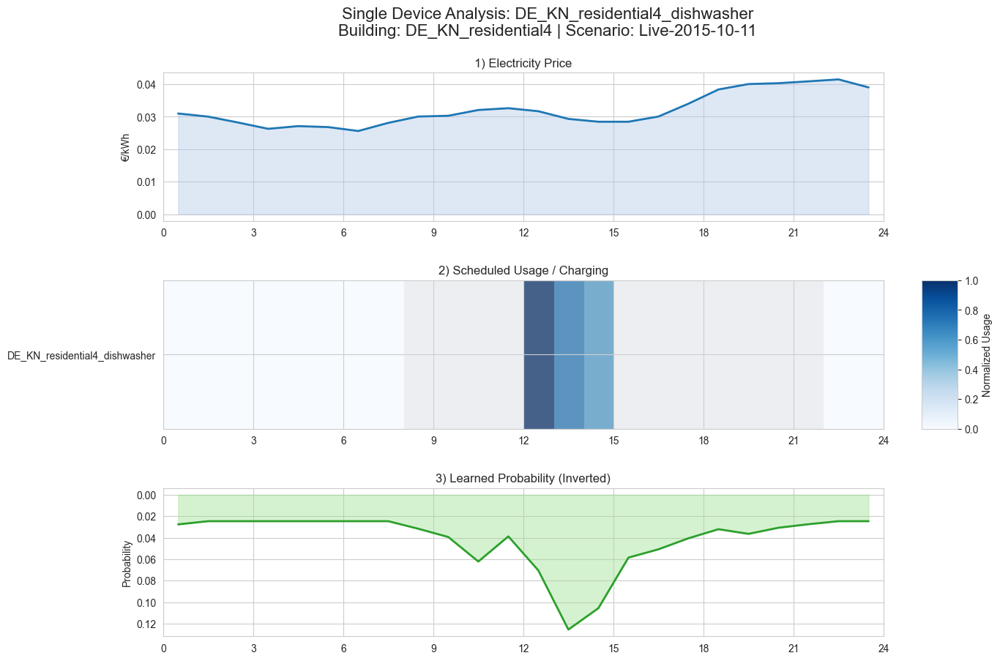

--- Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


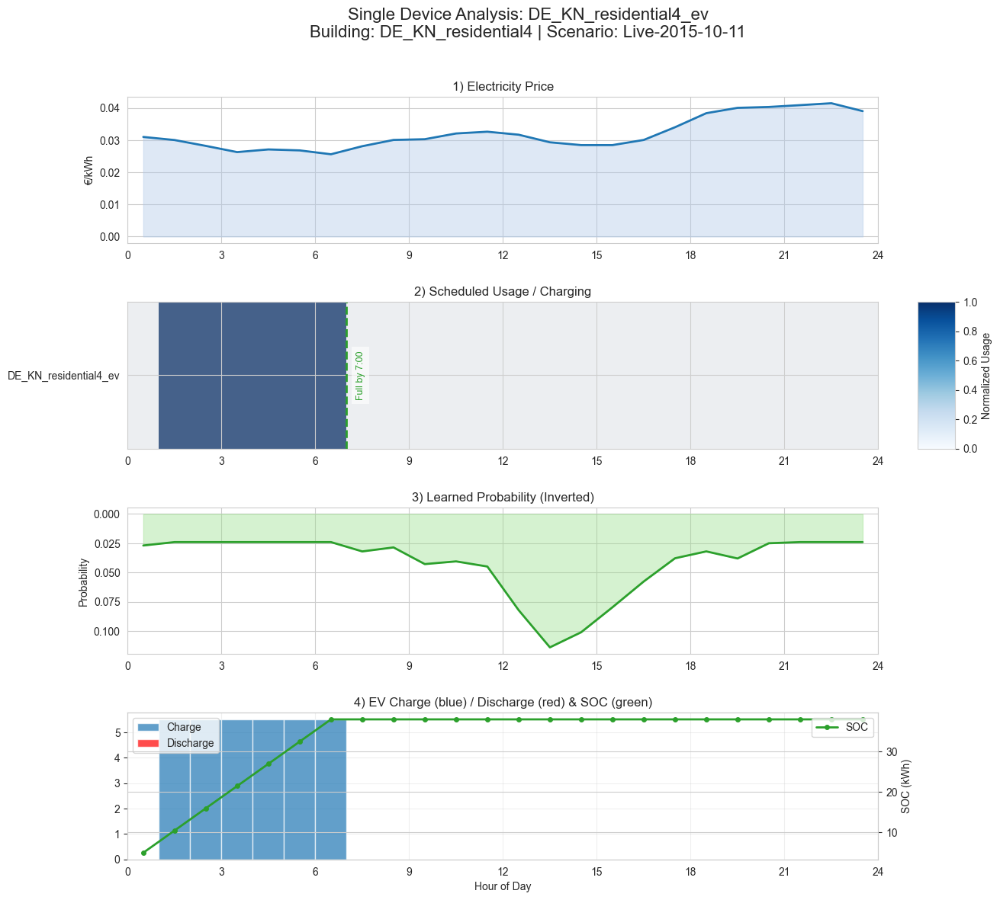

--- Single‐device plot for freezer ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


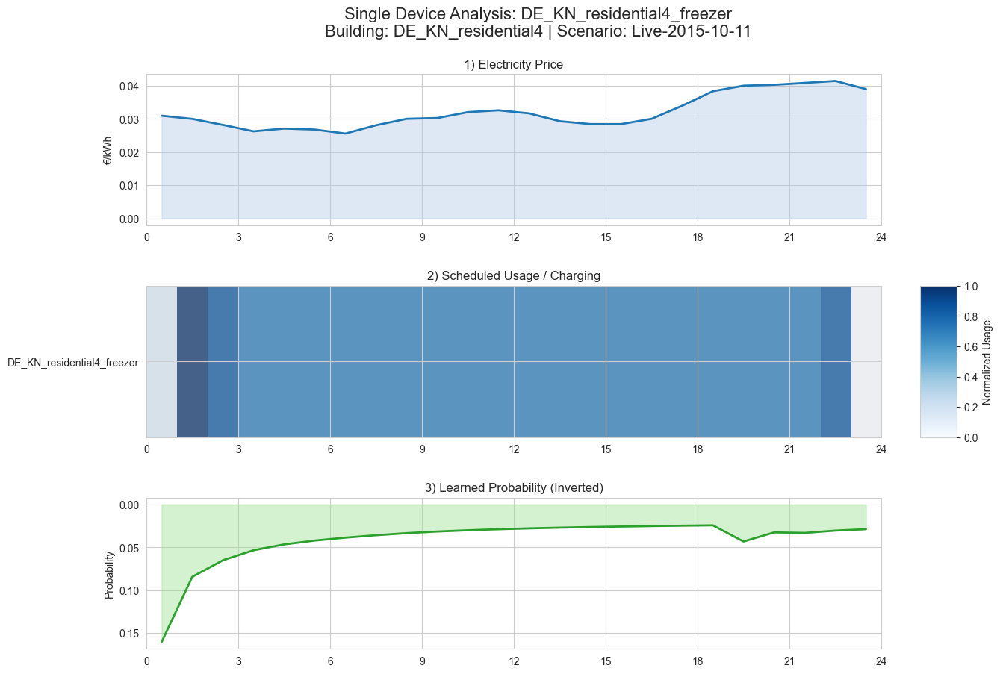

--- Single‐device plot for heat_pump ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


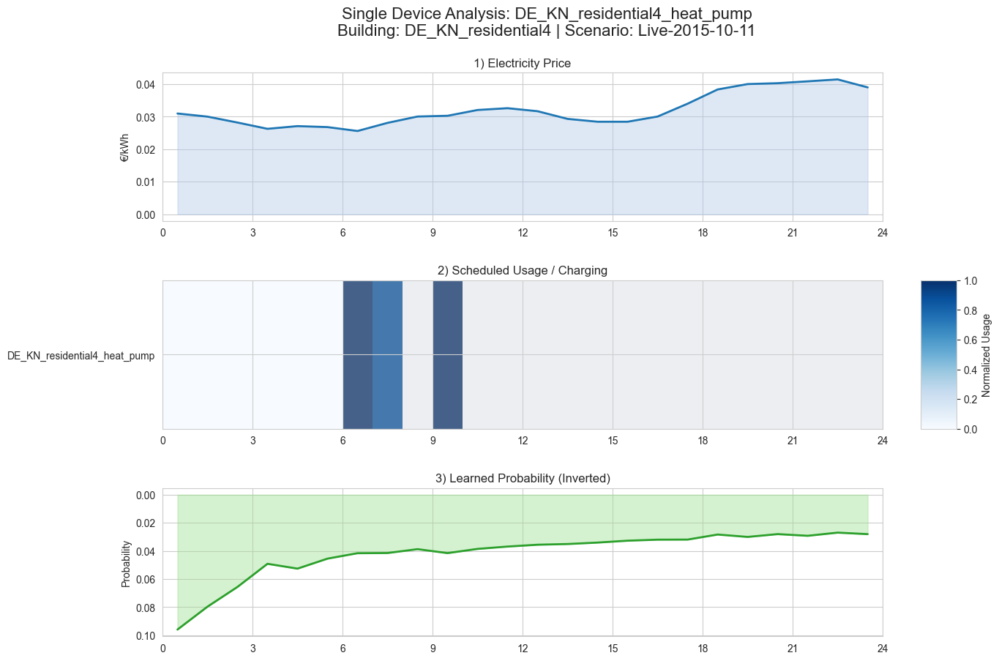

--- Single‐device plot for refrigerator ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


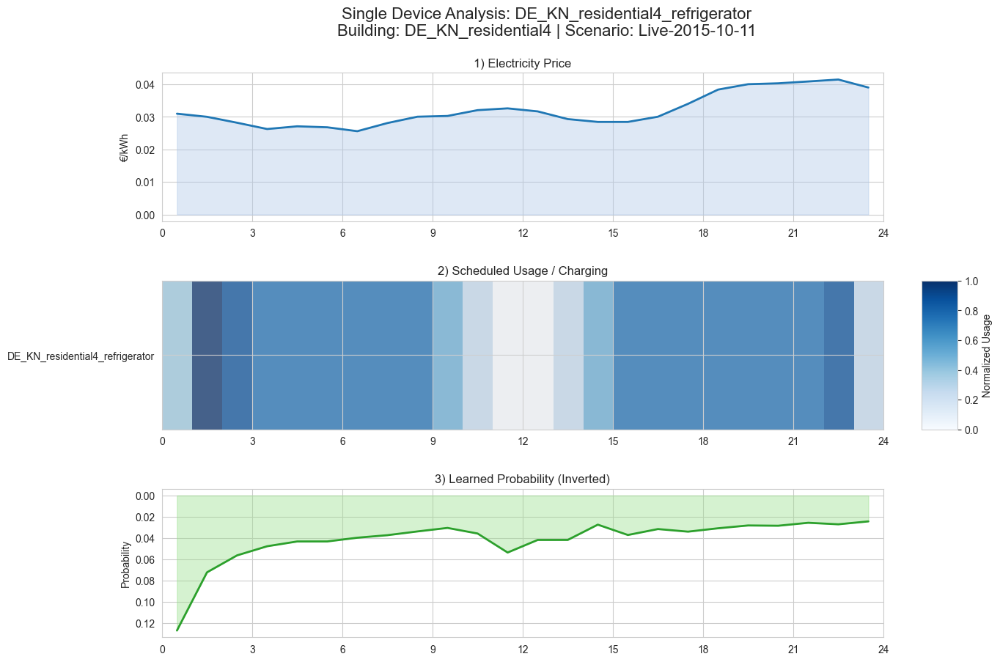

--- Single‐device plot for washing_machine ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


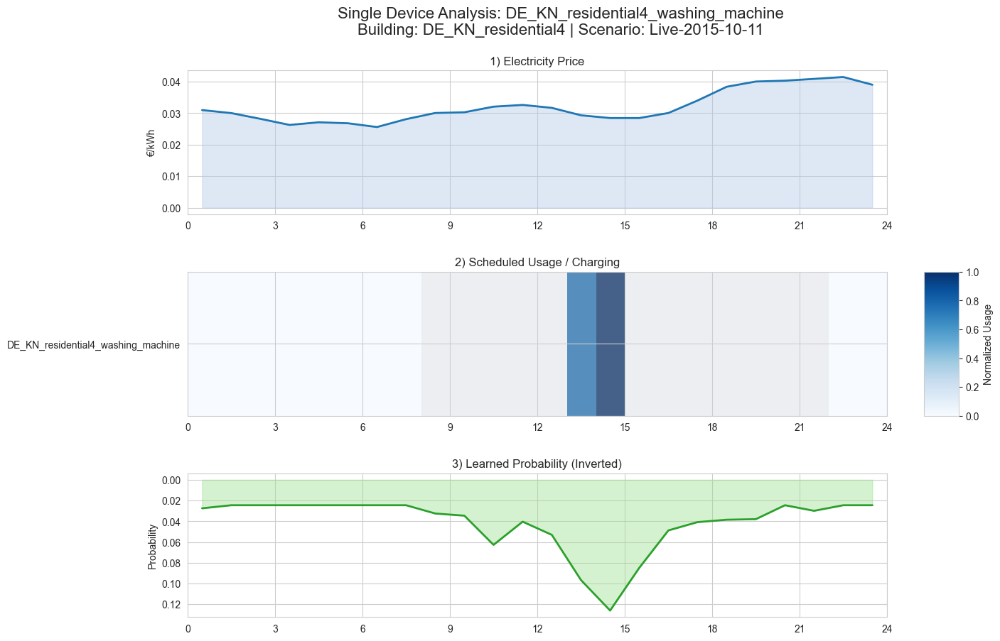

✅ Completed single‐device plots for all 6 devices on 2015-10-11

=== Full scenario heatmaps for 2015-10-12 ===


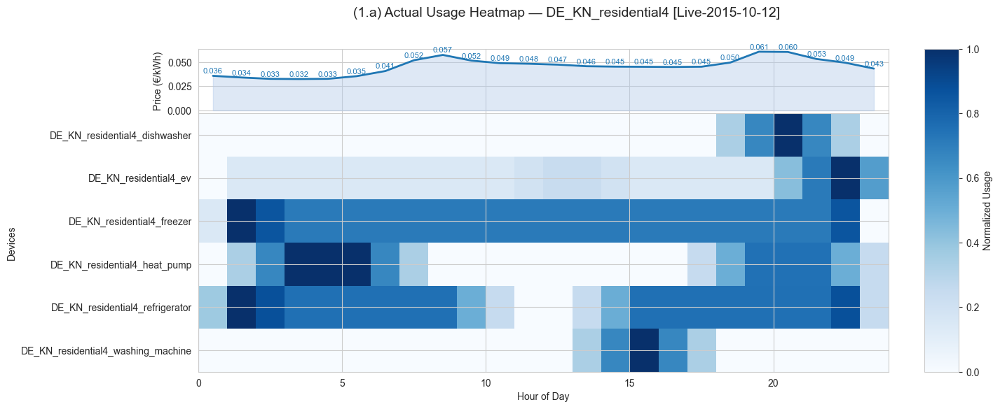

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


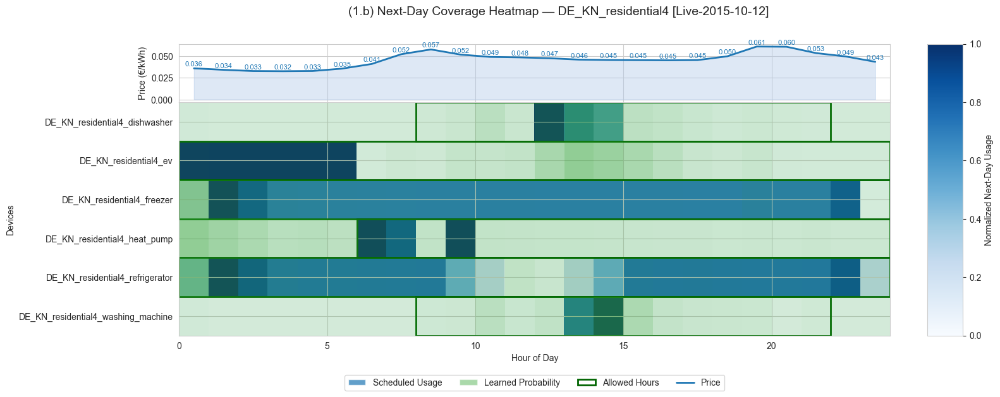

--- Single‐device plot for dishwasher ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


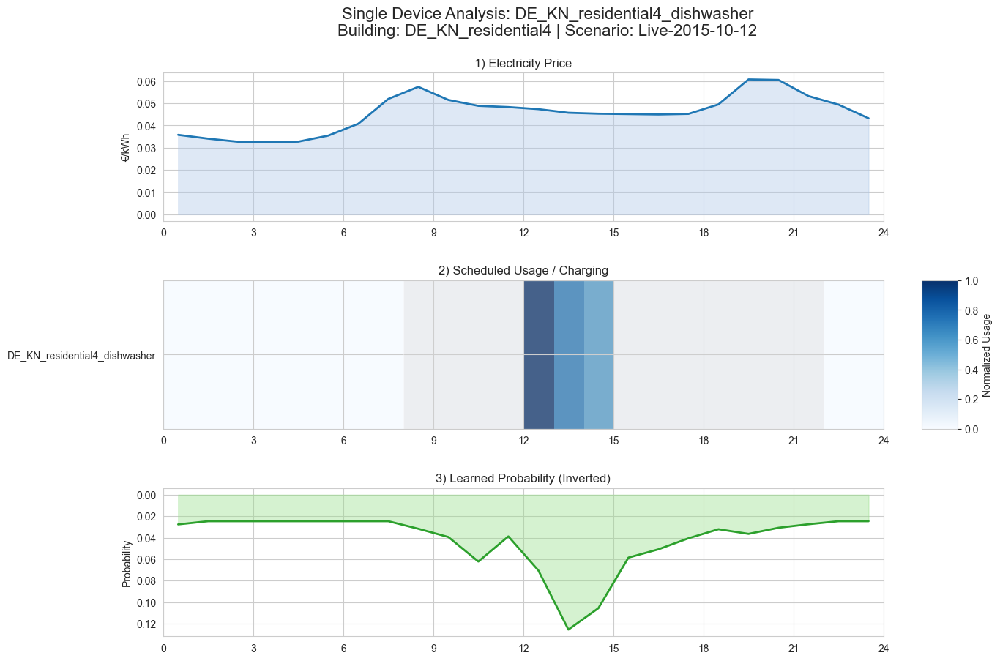

--- Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


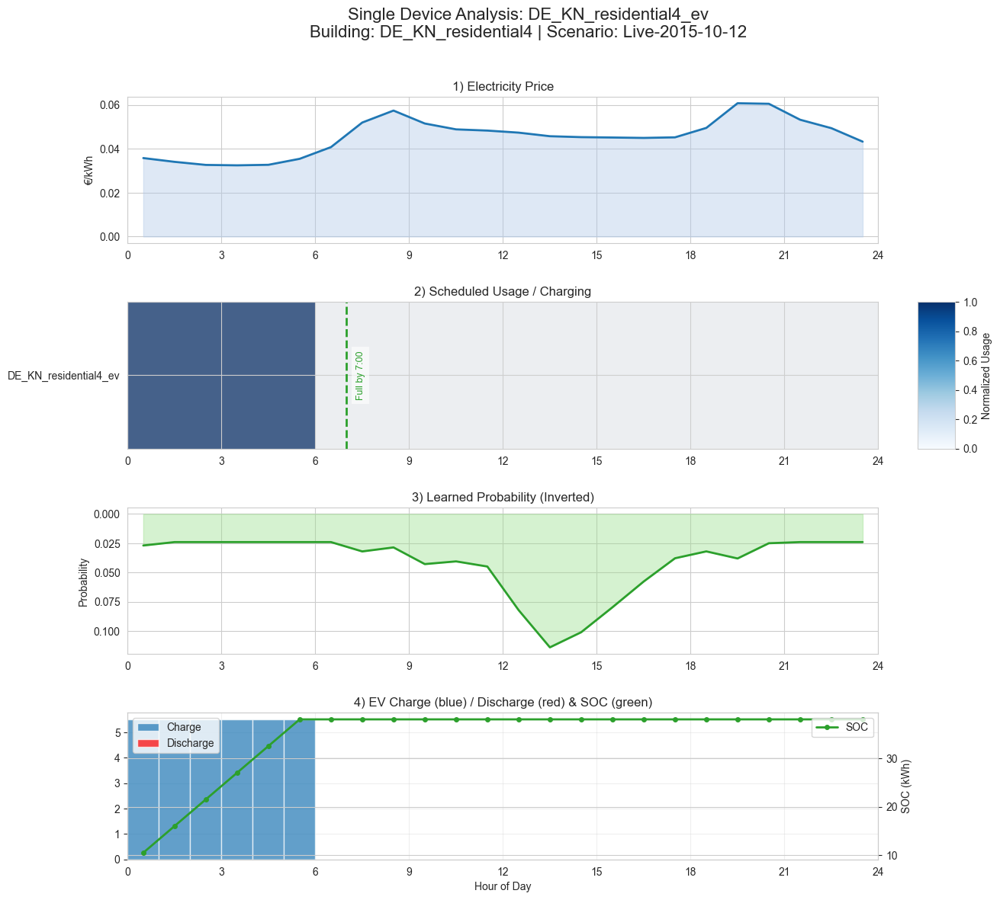

--- Single‐device plot for freezer ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


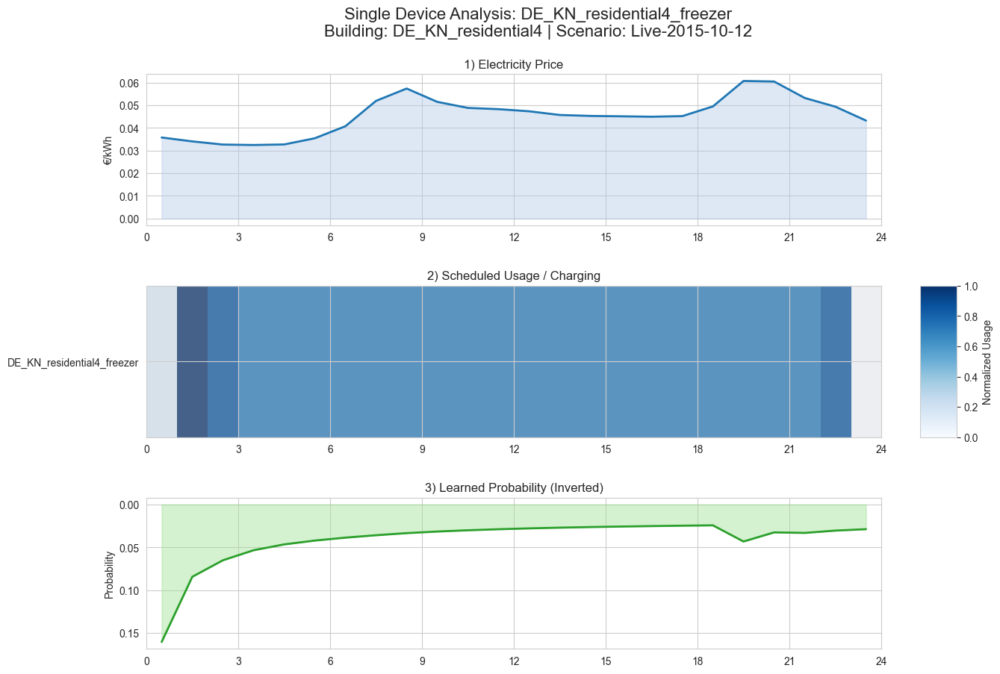

--- Single‐device plot for heat_pump ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


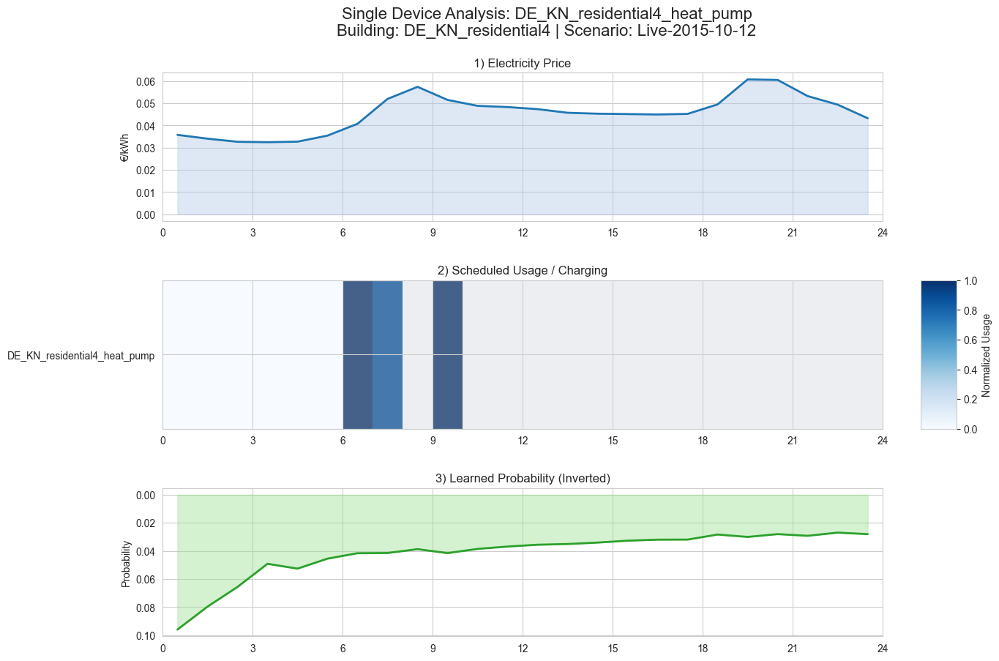

--- Single‐device plot for refrigerator ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


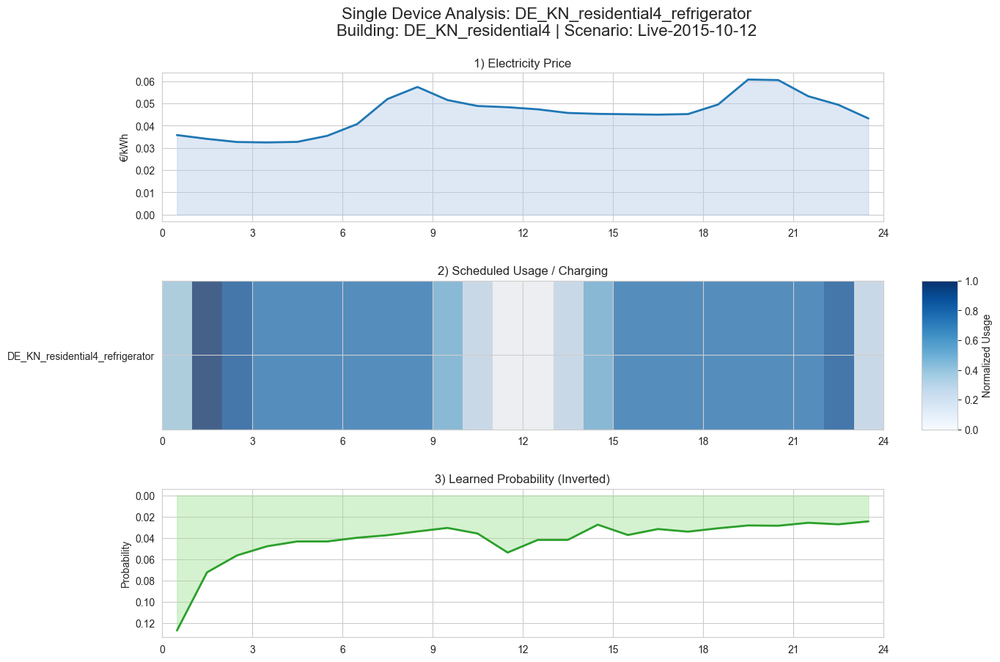

--- Single‐device plot for washing_machine ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


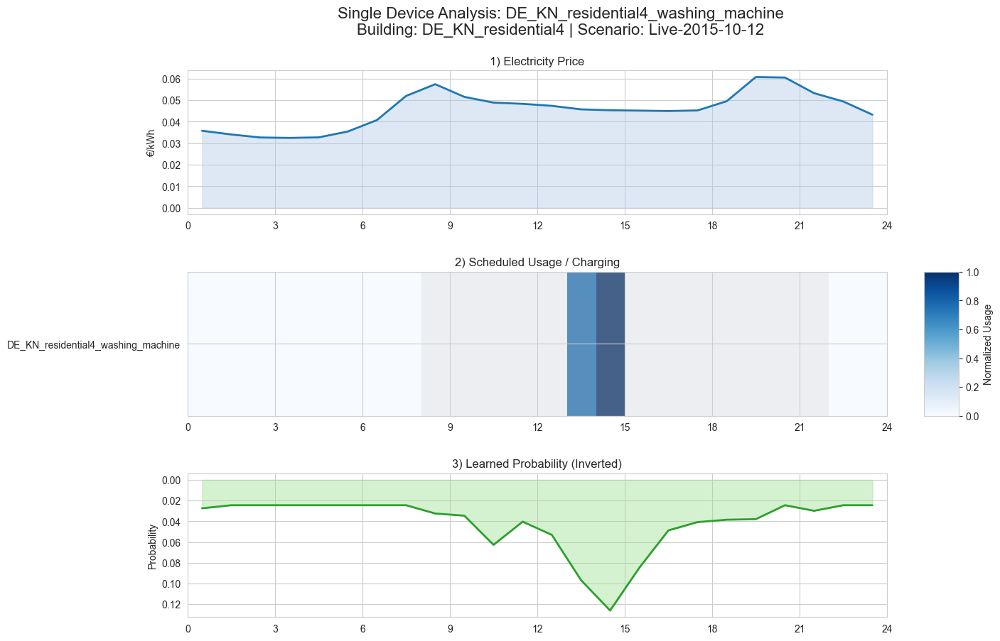

✅ Completed single‐device plots for all 6 devices on 2015-10-12

=== Full scenario heatmaps for 2015-10-13 ===


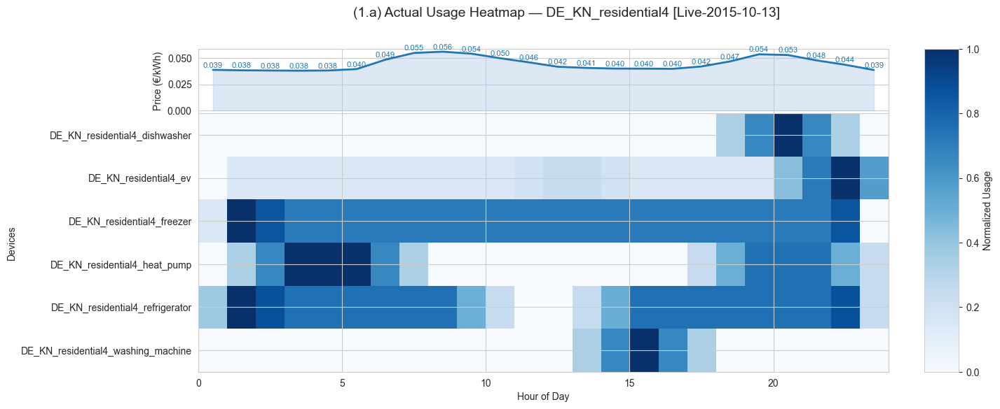

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


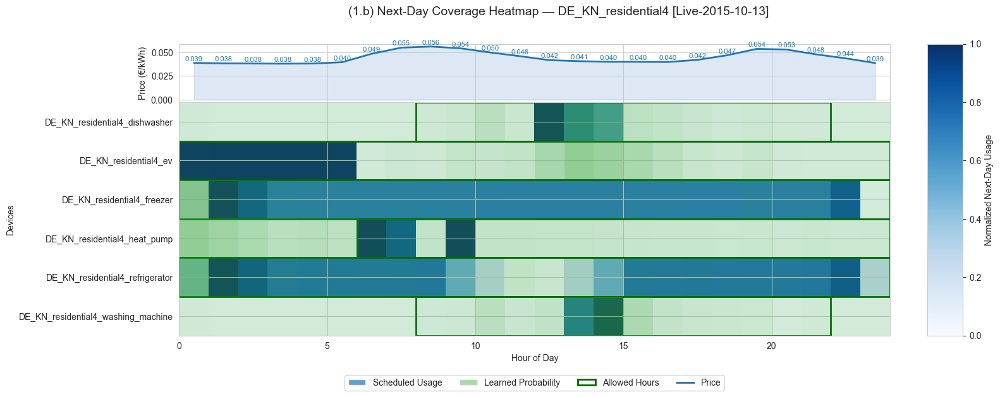

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


--- Single‐device plot for dishwasher ---


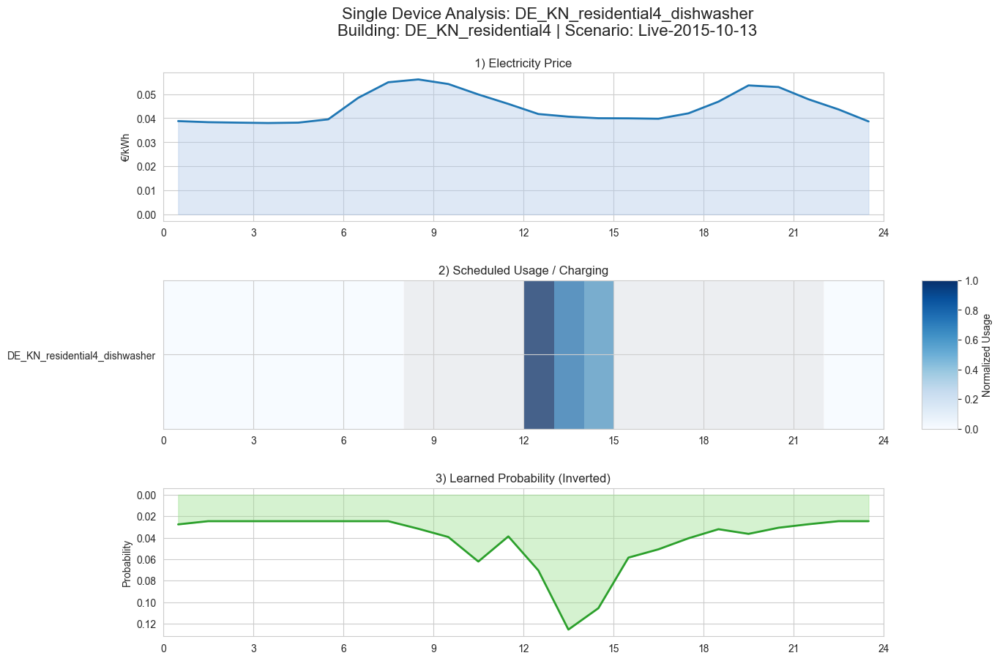

--- Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


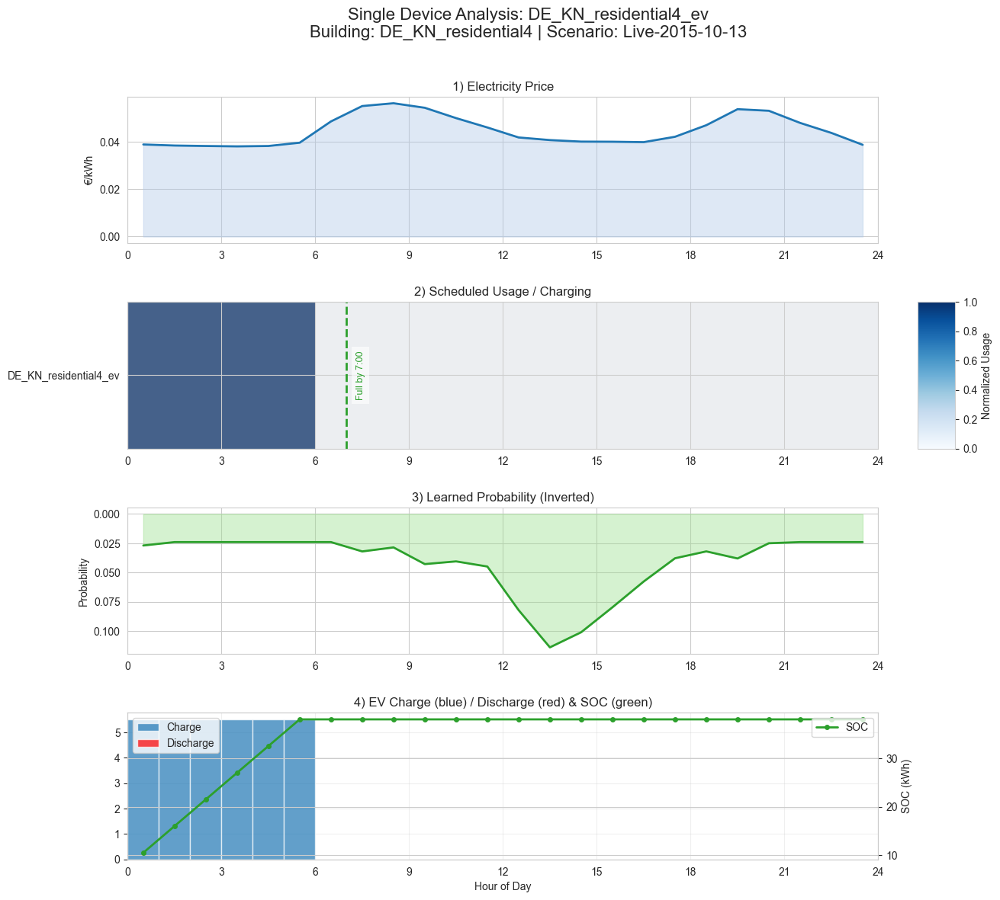

--- Single‐device plot for freezer ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


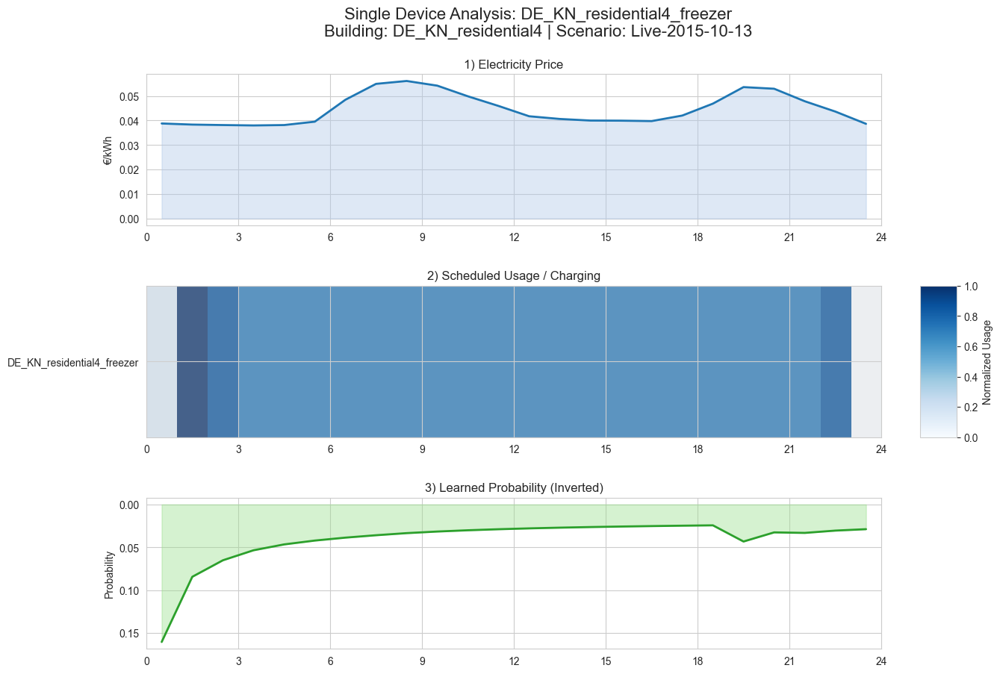

--- Single‐device plot for heat_pump ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


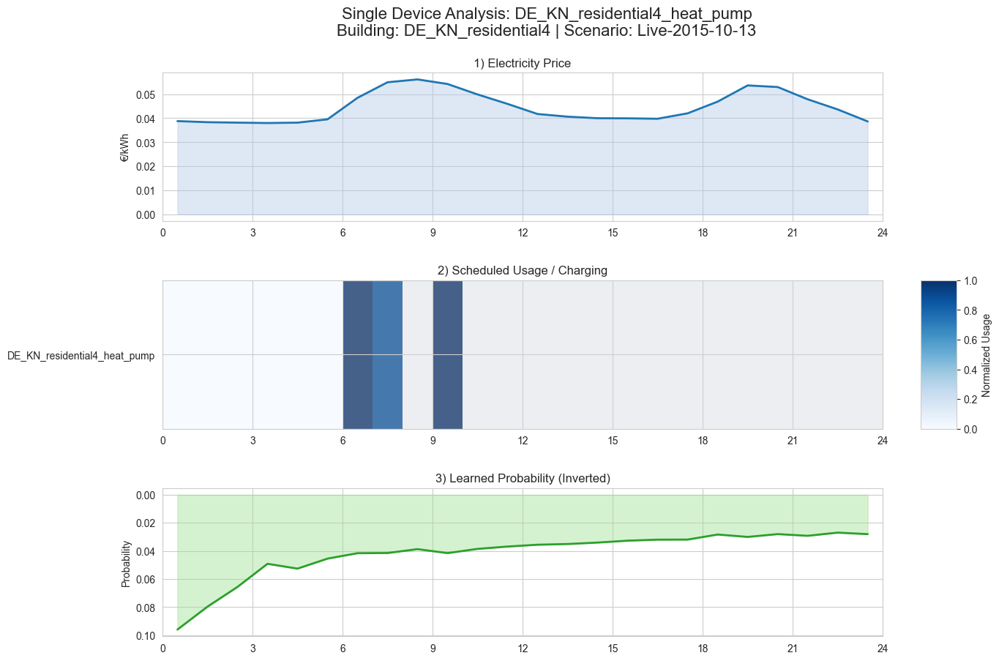

--- Single‐device plot for refrigerator ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


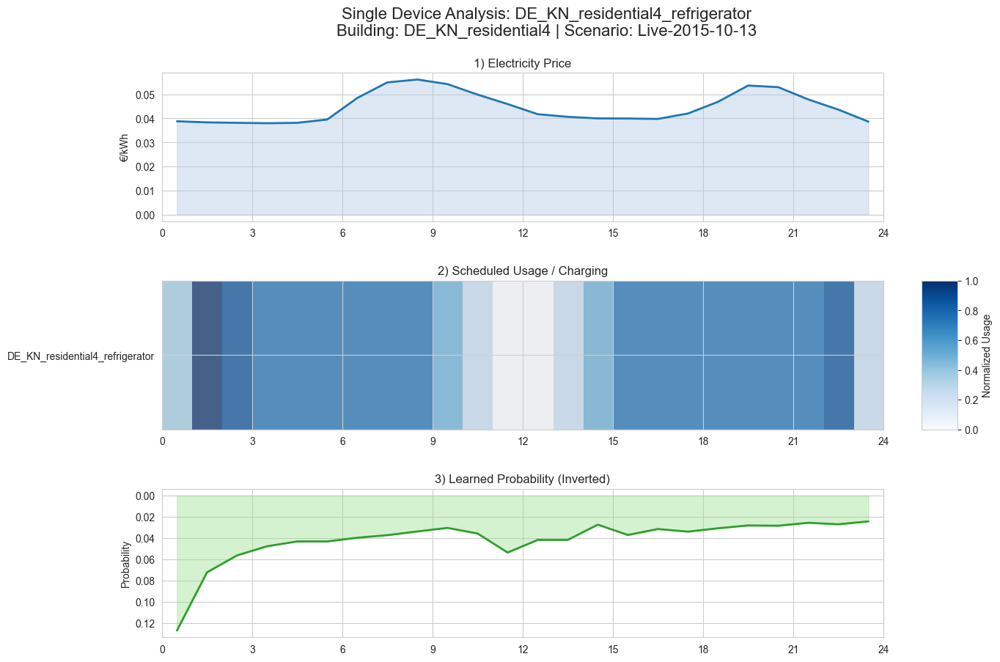

--- Single‐device plot for washing_machine ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


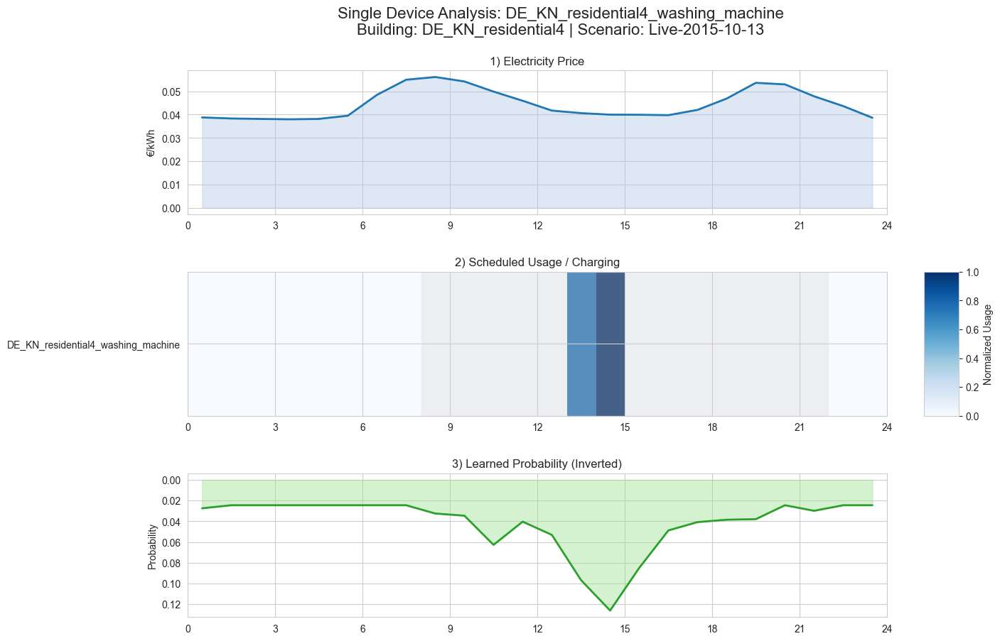

✅ Completed single‐device plots for all 6 devices on 2015-10-13

=== Full scenario heatmaps for 2015-10-14 ===


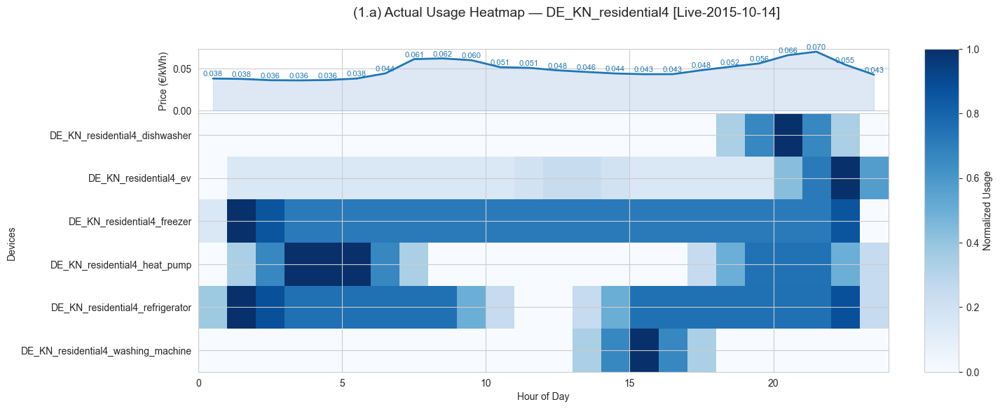

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


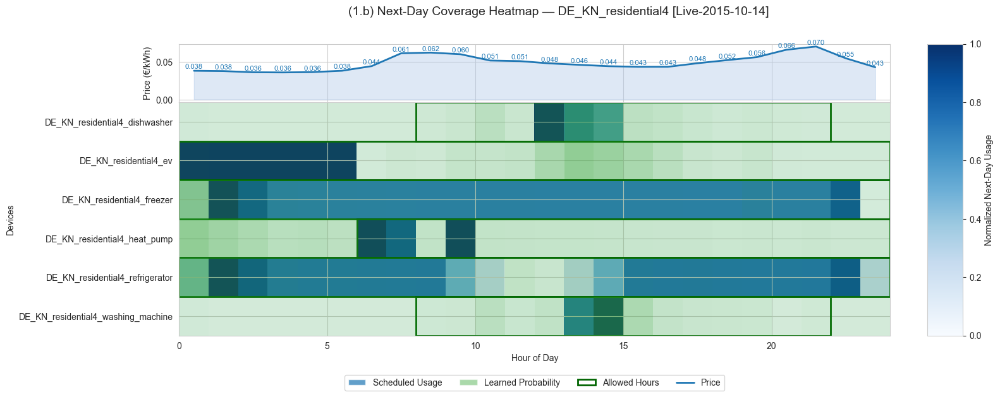

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


--- Single‐device plot for dishwasher ---


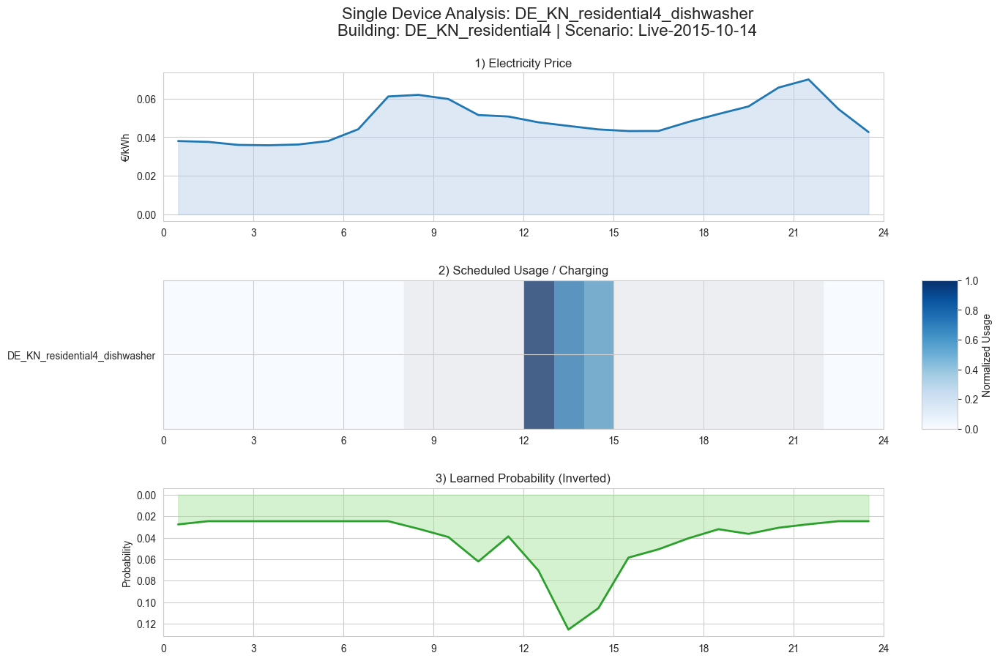

--- Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


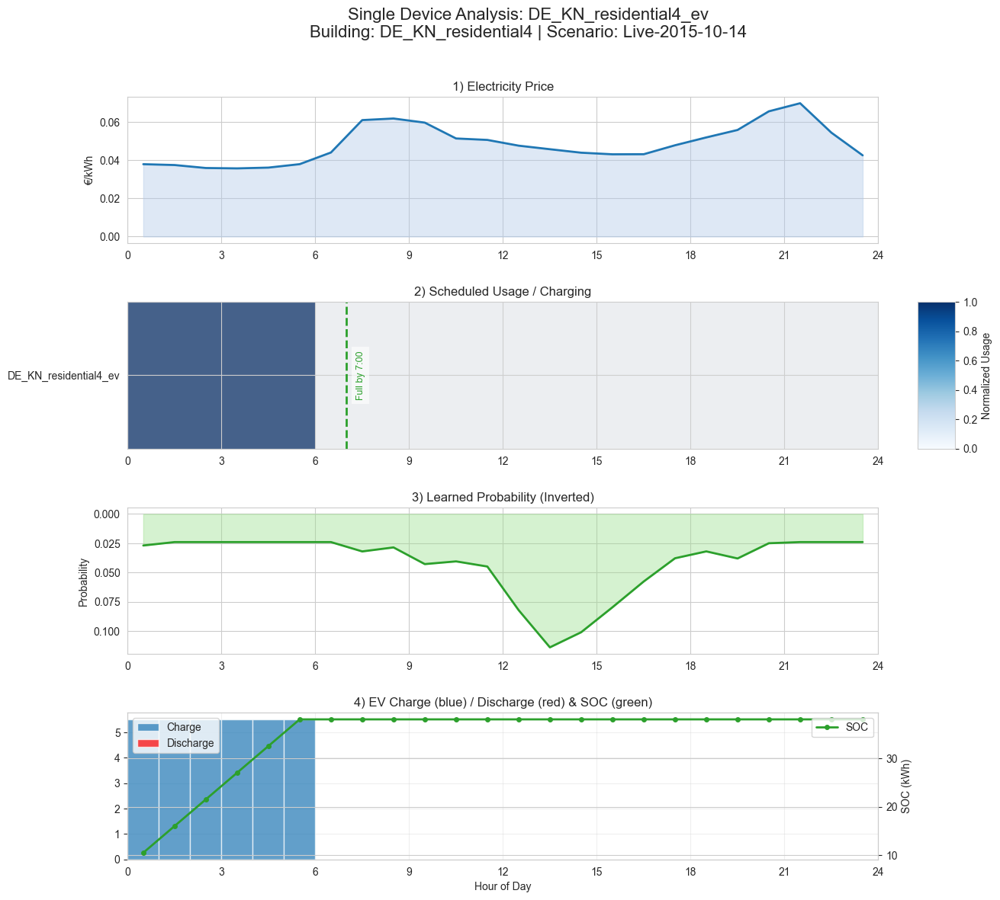

--- Single‐device plot for freezer ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


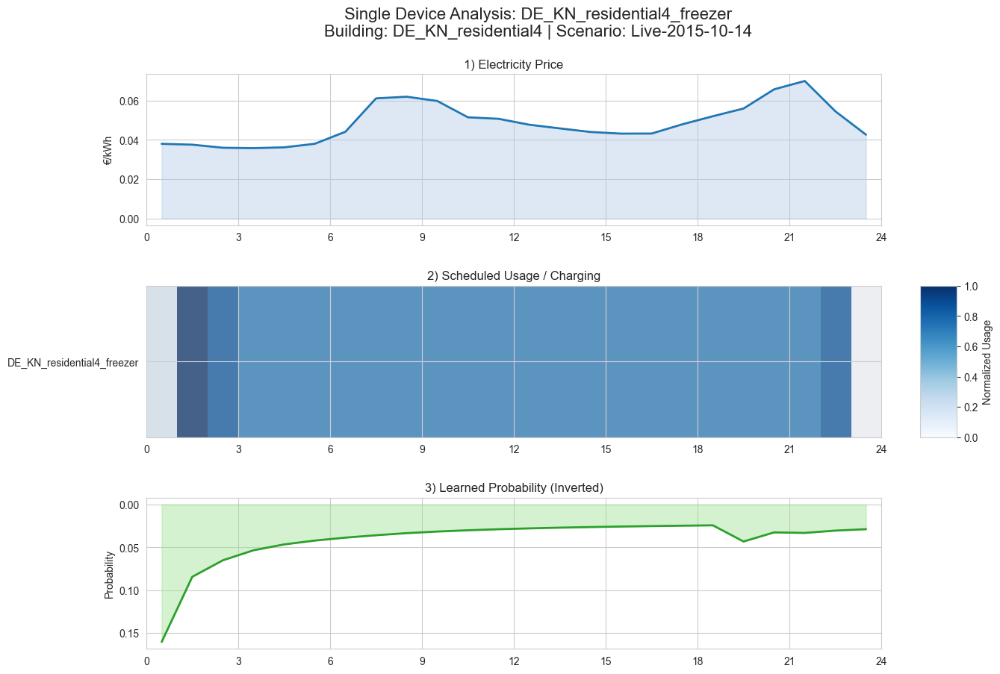

--- Single‐device plot for heat_pump ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


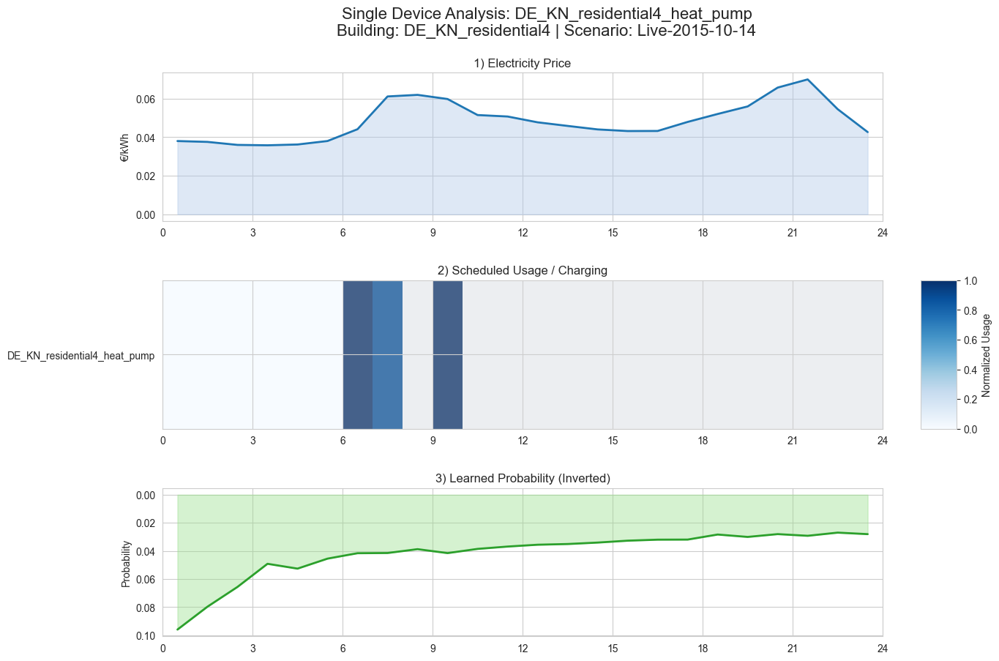

--- Single‐device plot for refrigerator ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


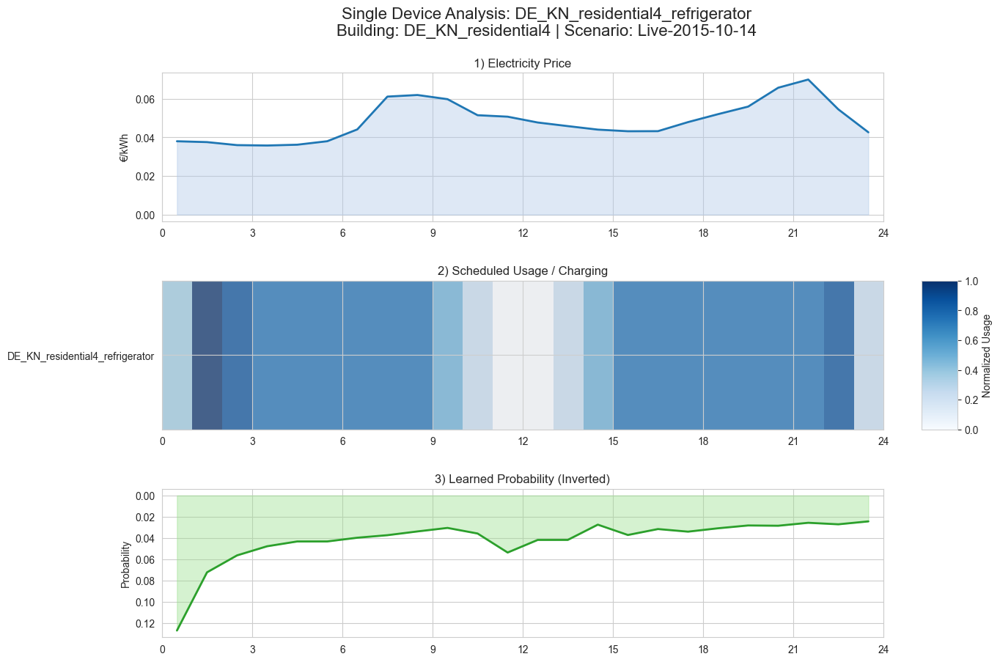

--- Single‐device plot for washing_machine ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


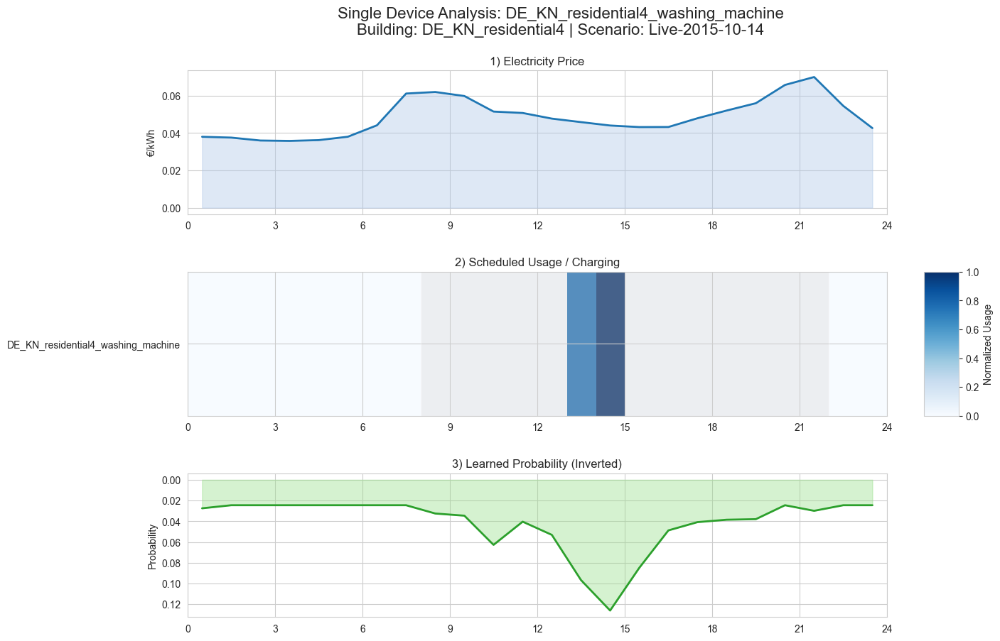

✅ Completed single‐device plots for all 6 devices on 2015-10-14

=== Full scenario heatmaps for 2015-10-15 ===


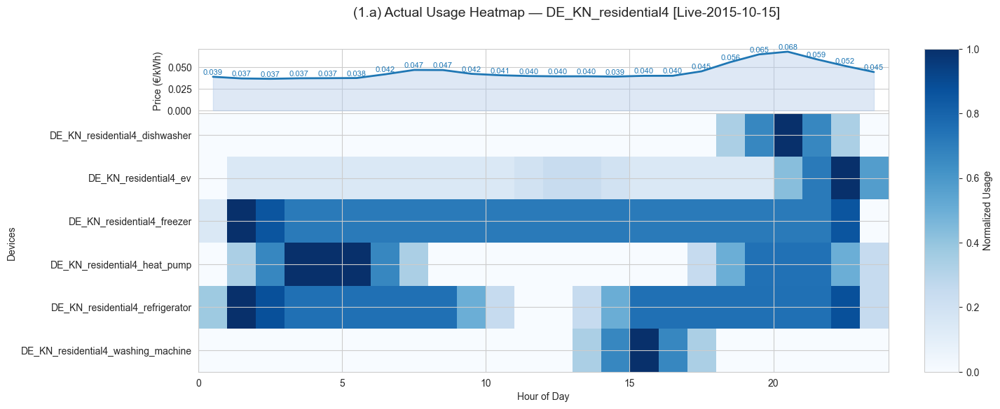

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


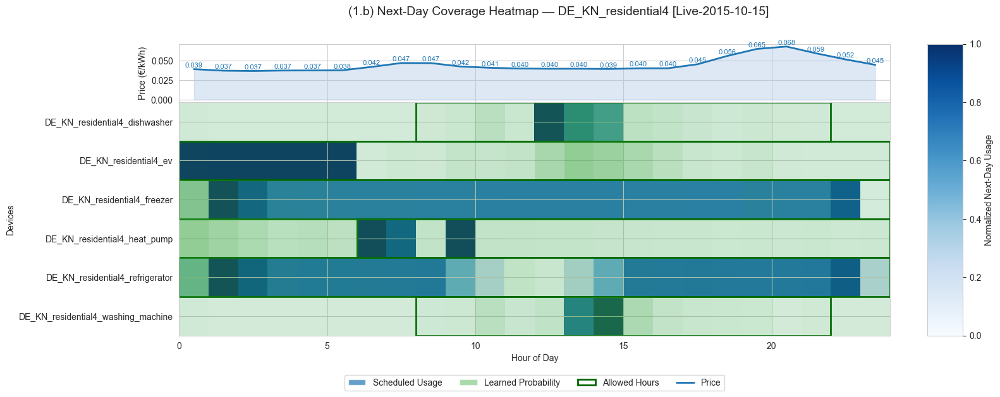

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


--- Single‐device plot for dishwasher ---


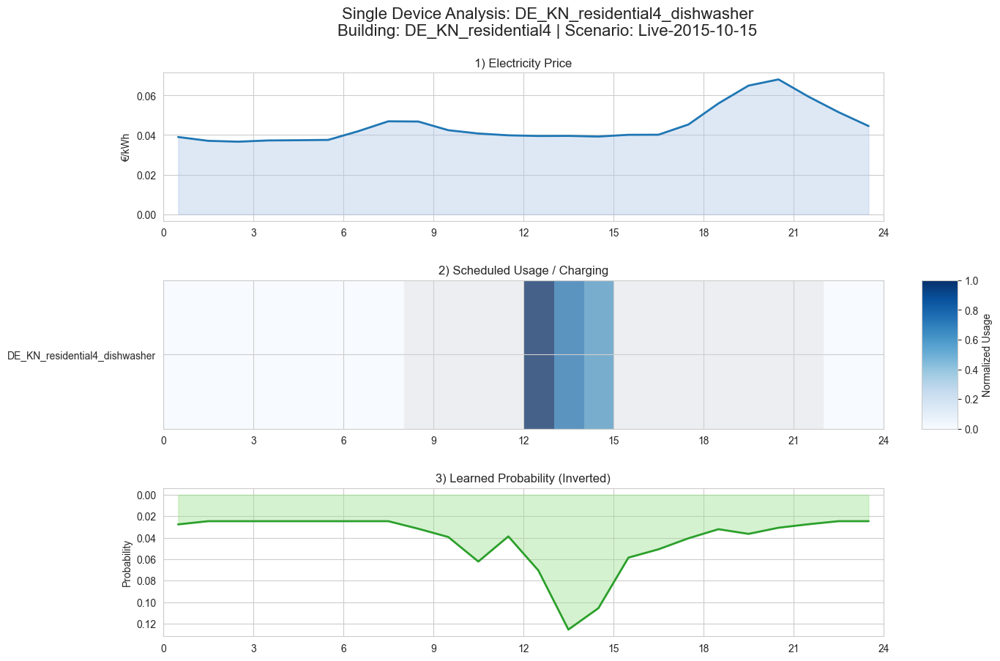

--- Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


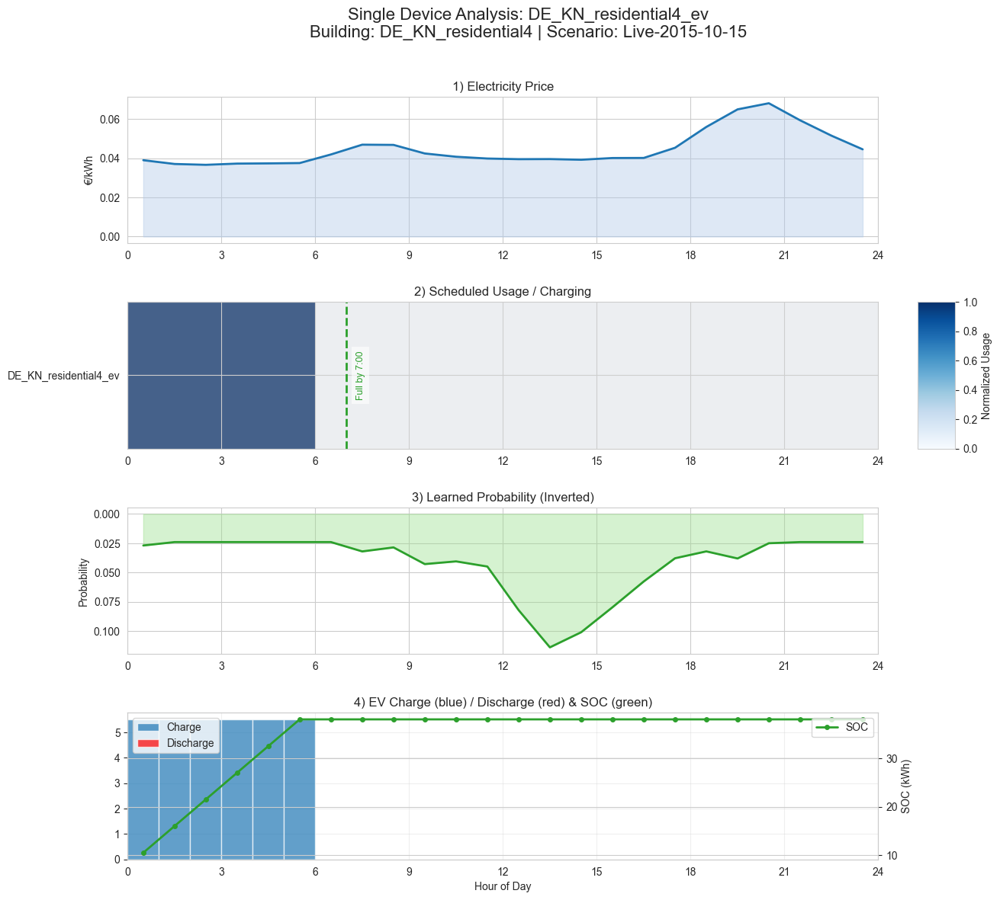

--- Single‐device plot for freezer ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


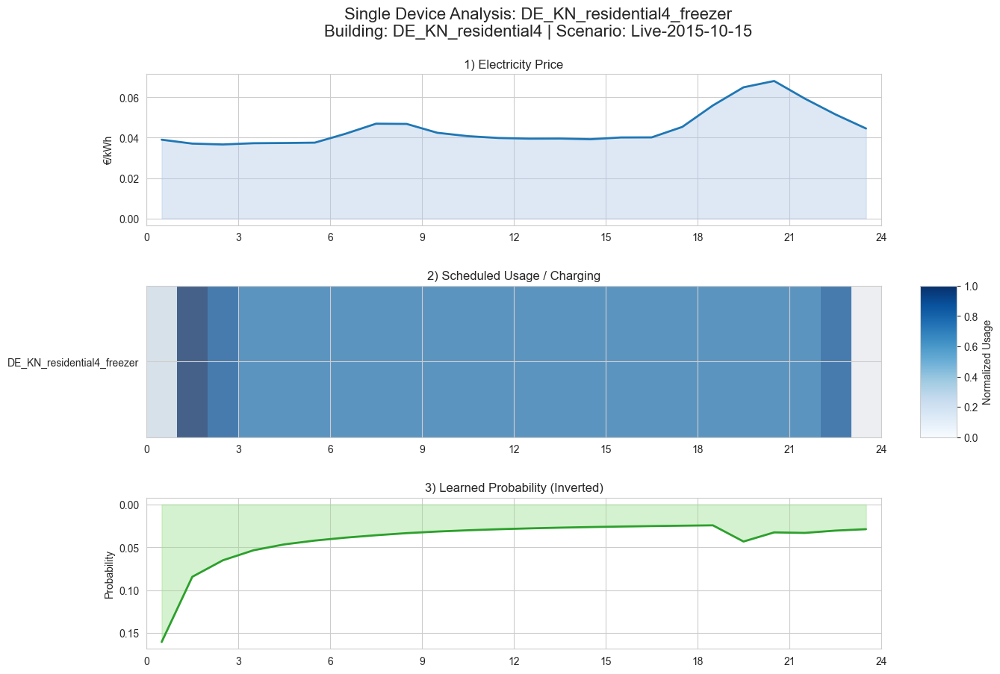

--- Single‐device plot for heat_pump ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


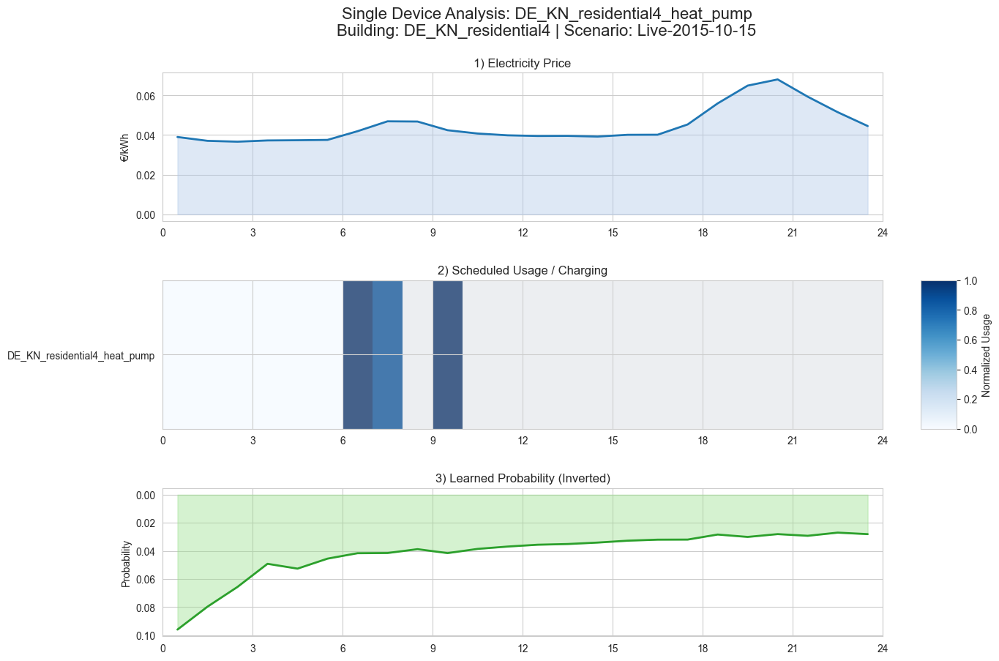

--- Single‐device plot for refrigerator ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


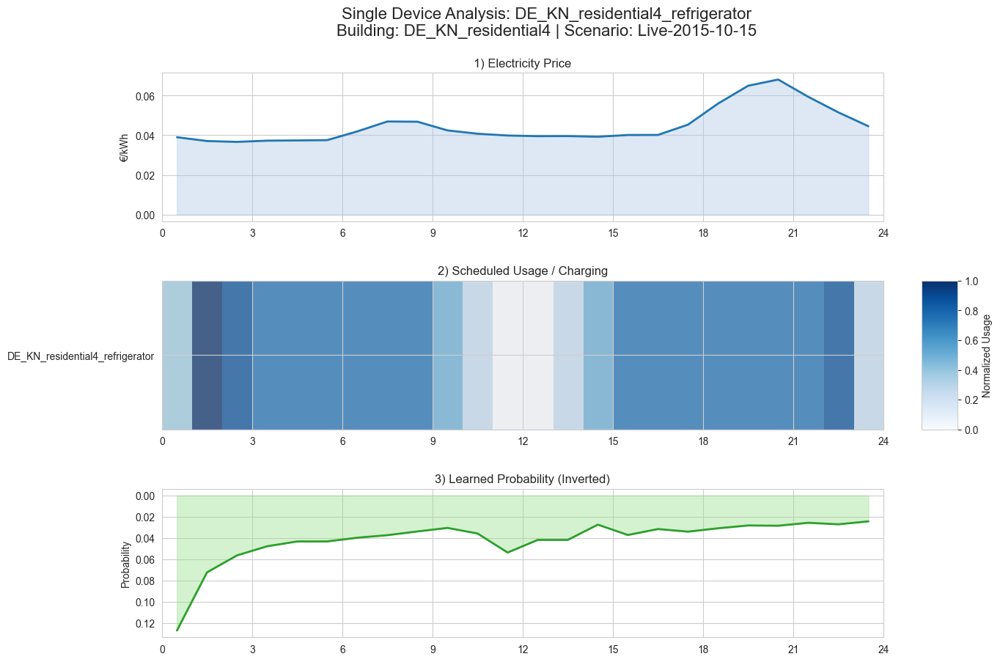

--- Single‐device plot for washing_machine ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


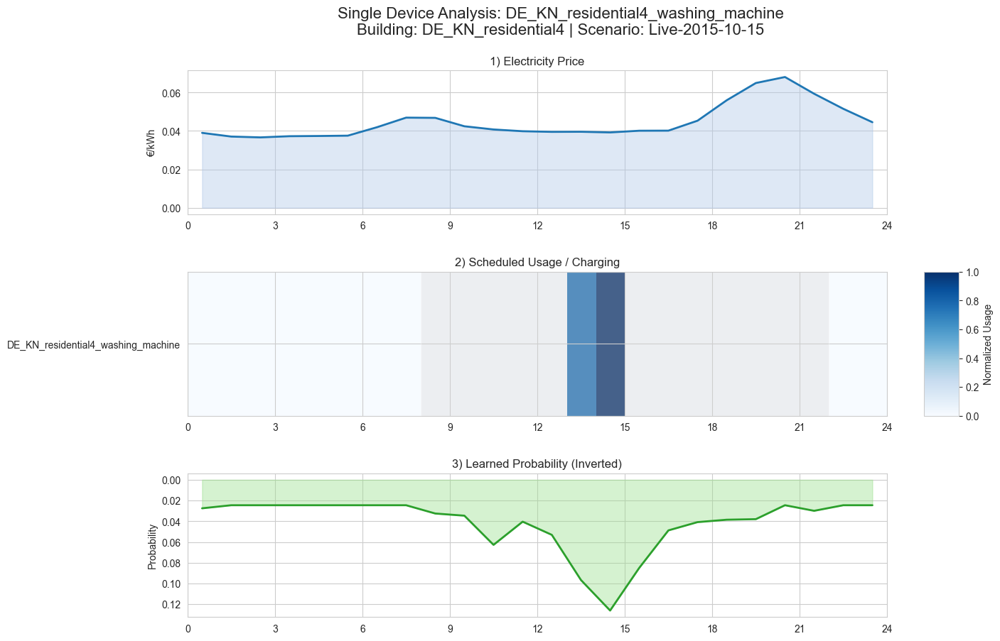

✅ Completed single‐device plots for all 6 devices on 2015-10-15

=== Full scenario heatmaps for 2015-10-16 ===


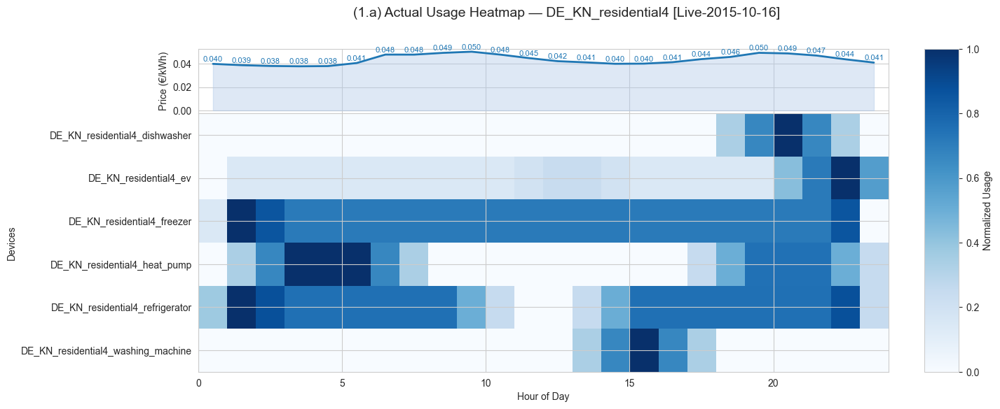

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


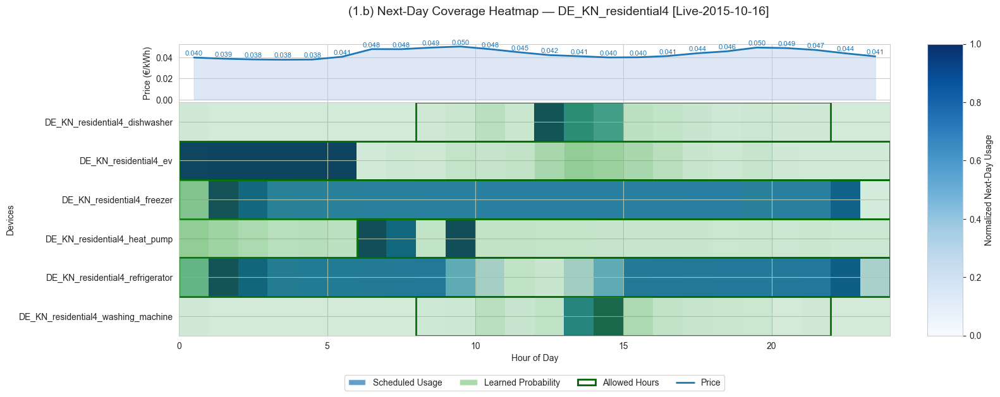

--- Single‐device plot for dishwasher ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


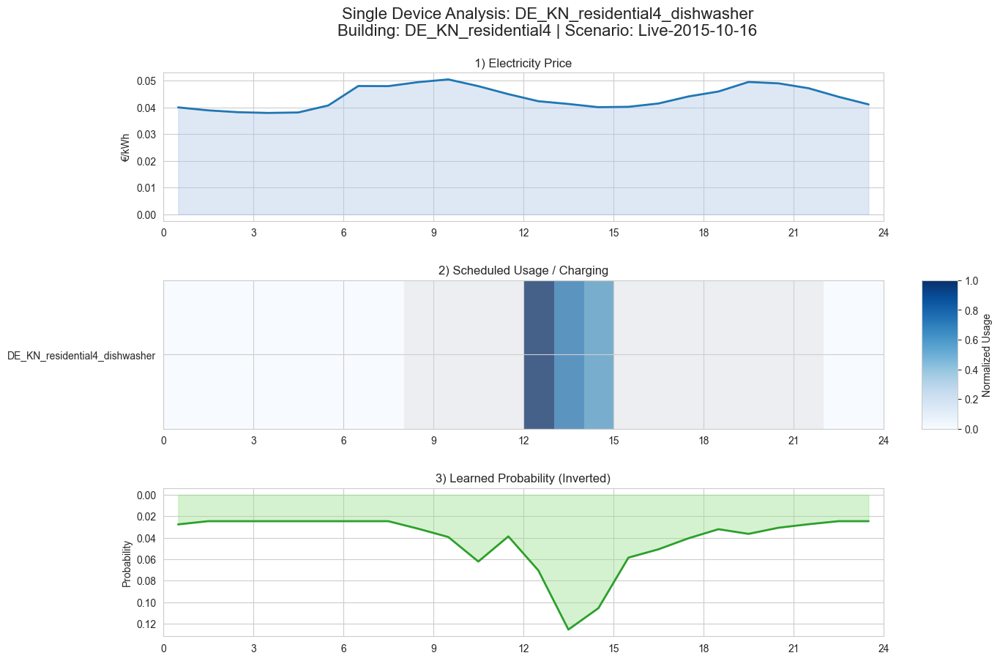

--- Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


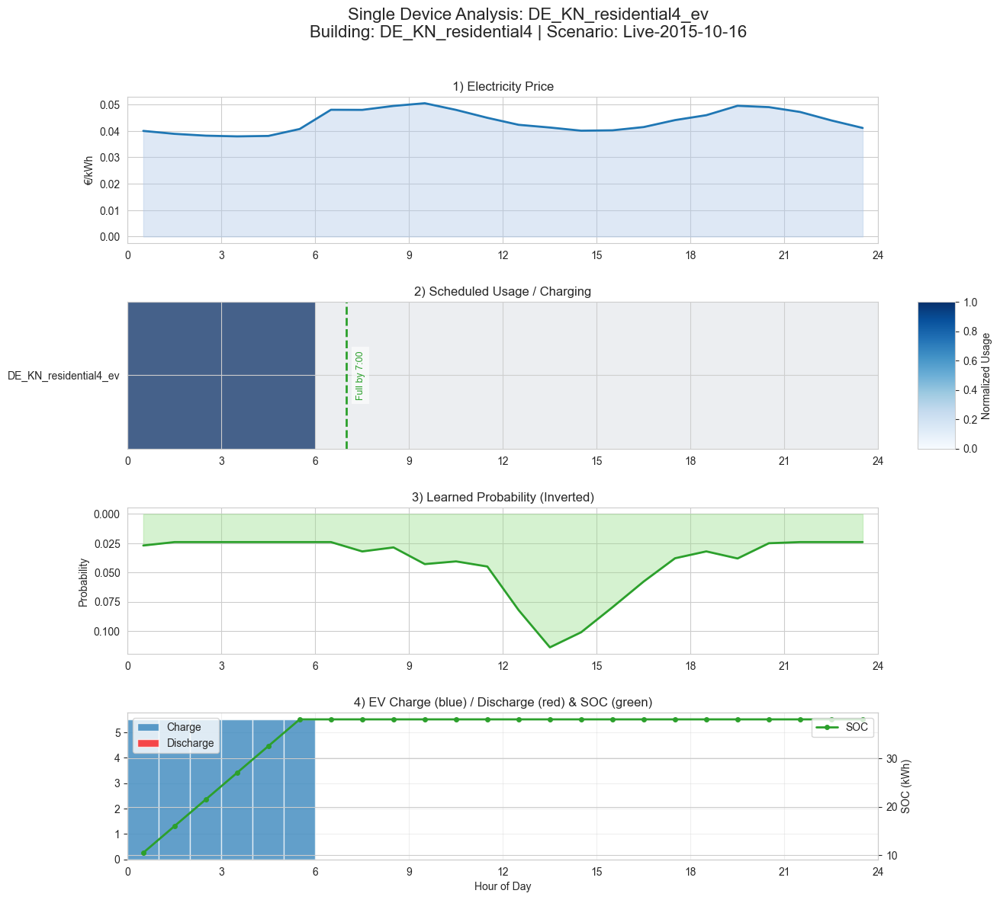

--- Single‐device plot for freezer ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


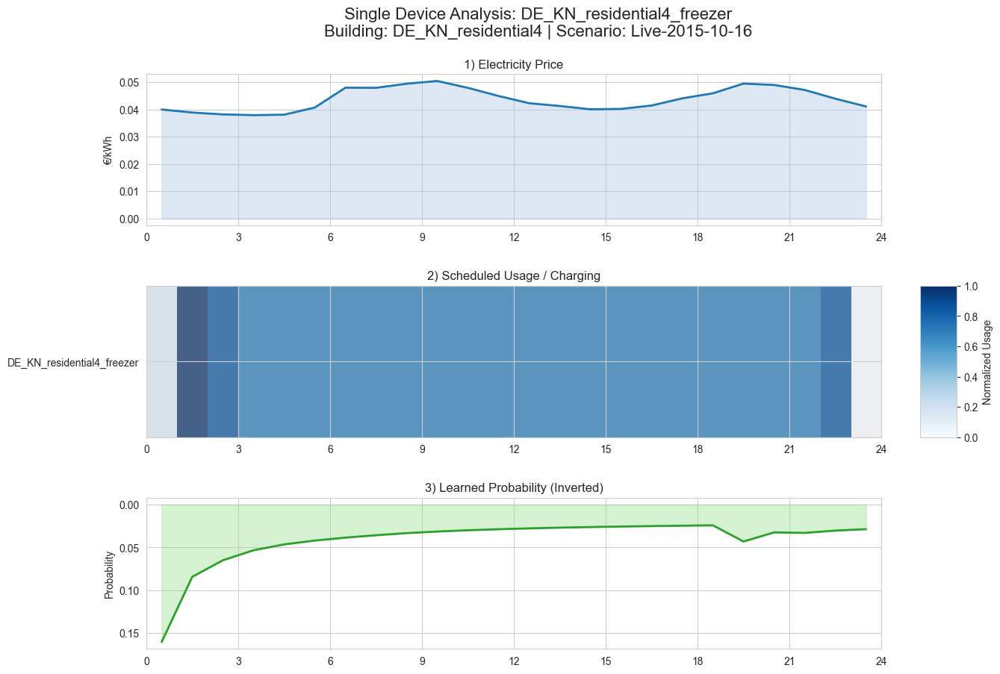

--- Single‐device plot for heat_pump ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


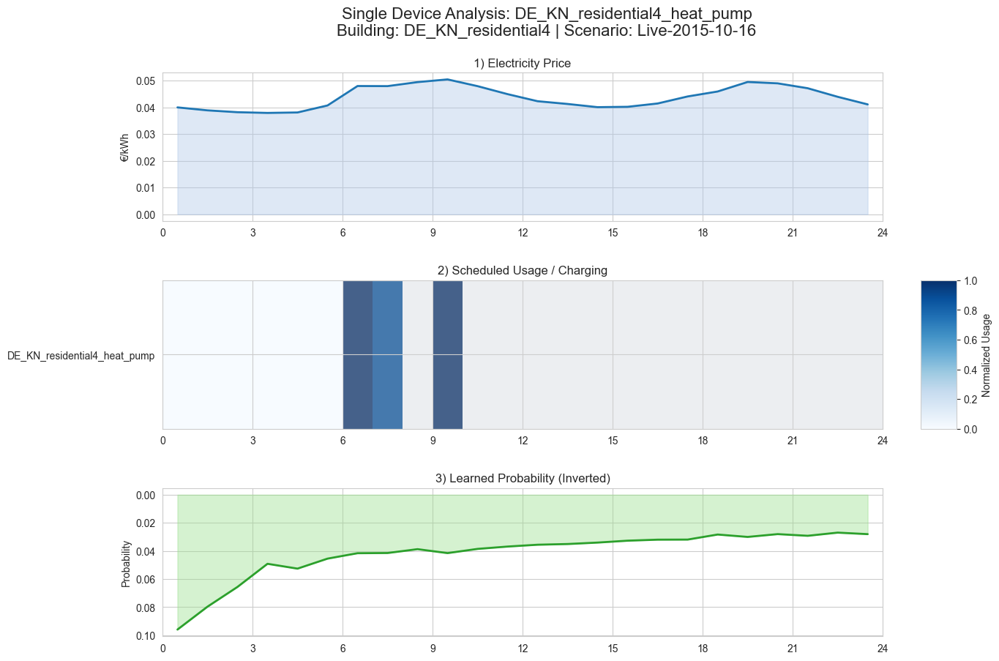

--- Single‐device plot for refrigerator ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


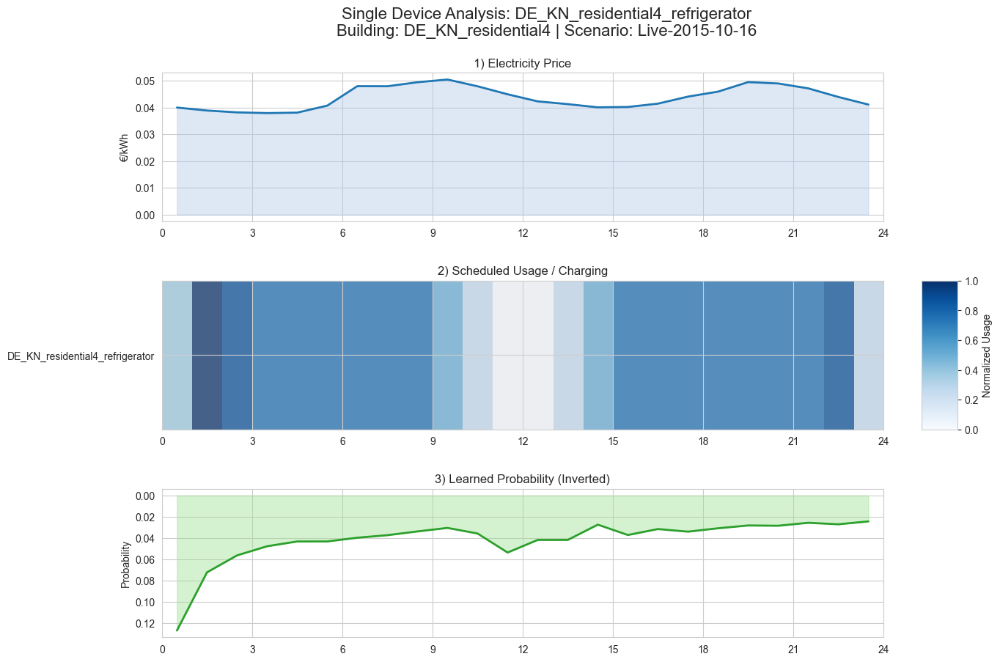

--- Single‐device plot for washing_machine ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


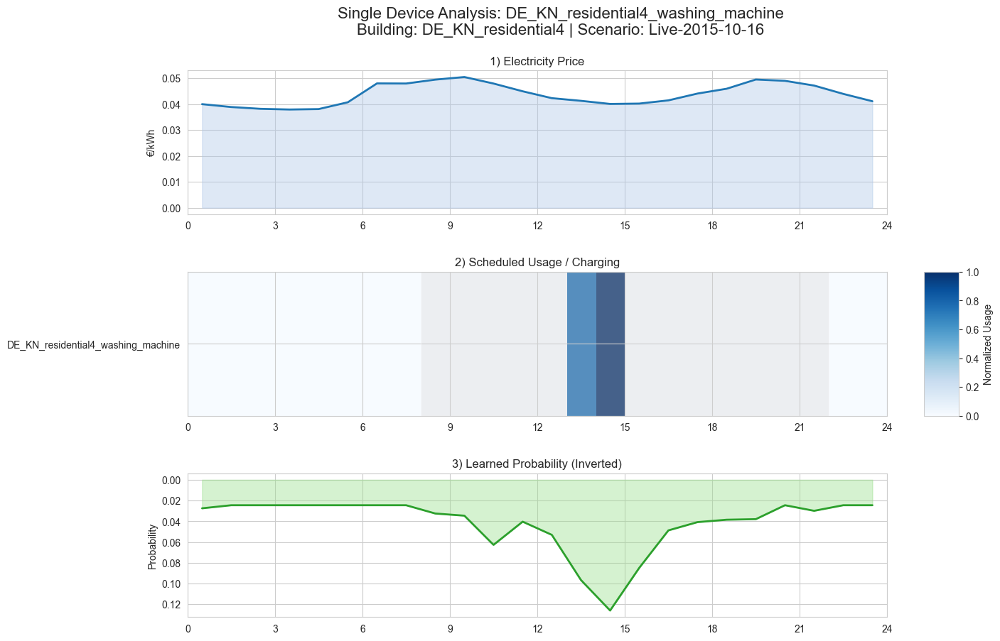

✅ Completed single‐device plots for all 6 devices on 2015-10-16

=== Full scenario heatmaps for 2015-10-17 ===


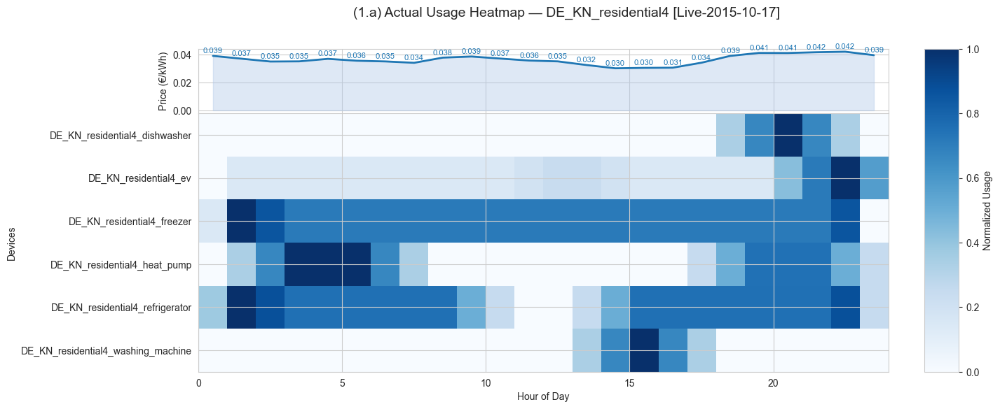

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


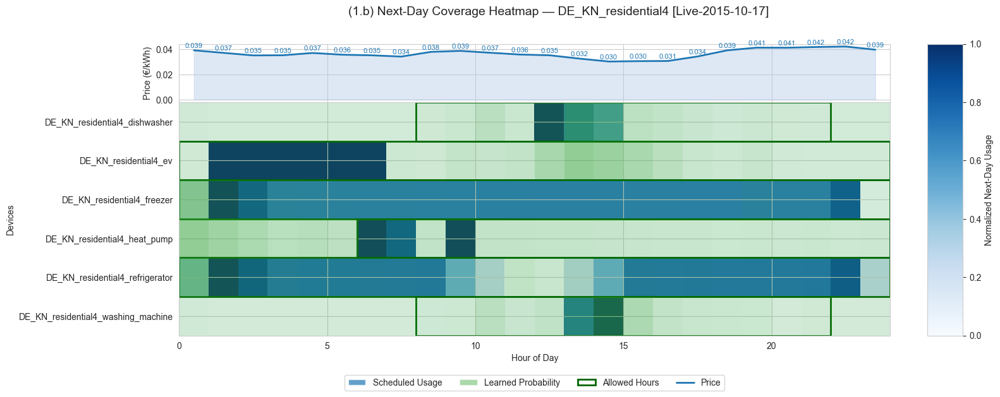

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


--- Single‐device plot for dishwasher ---


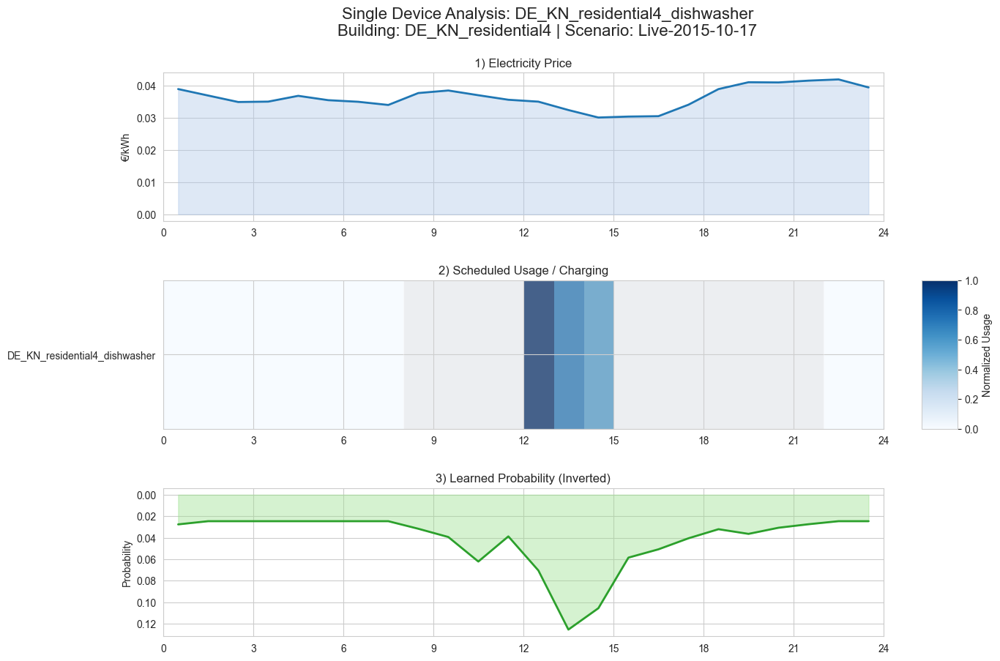

--- Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


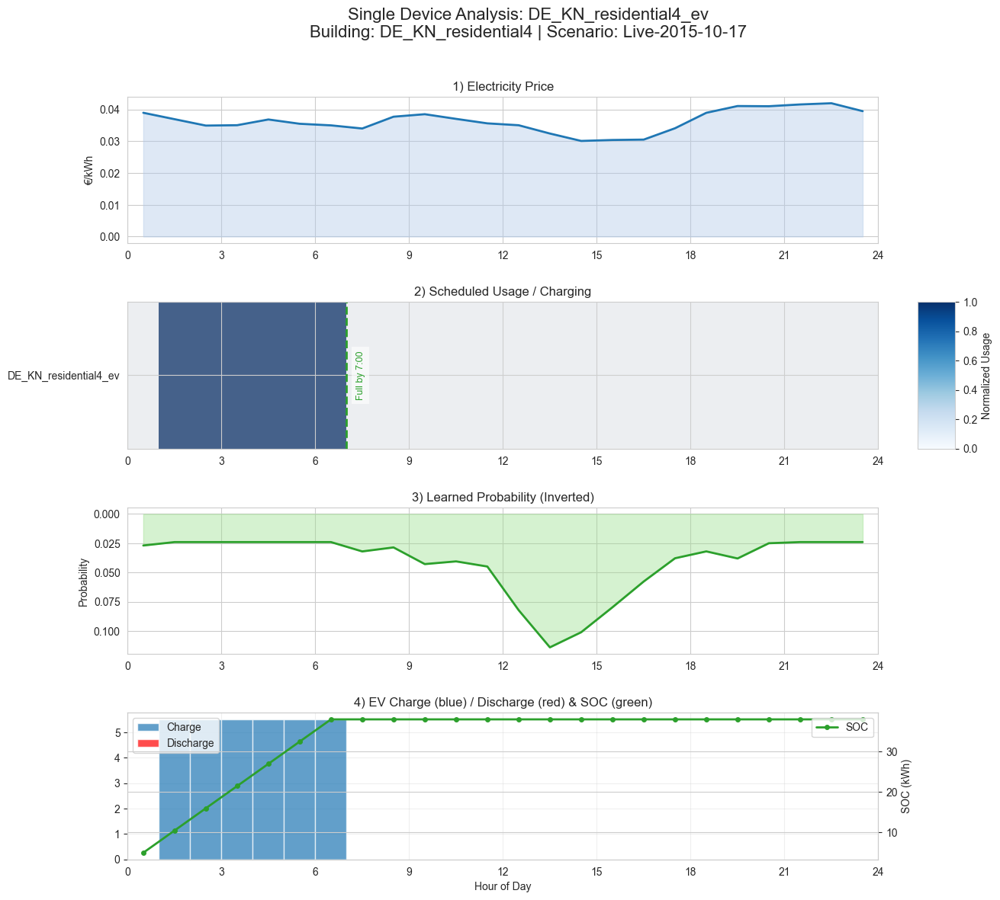

--- Single‐device plot for freezer ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


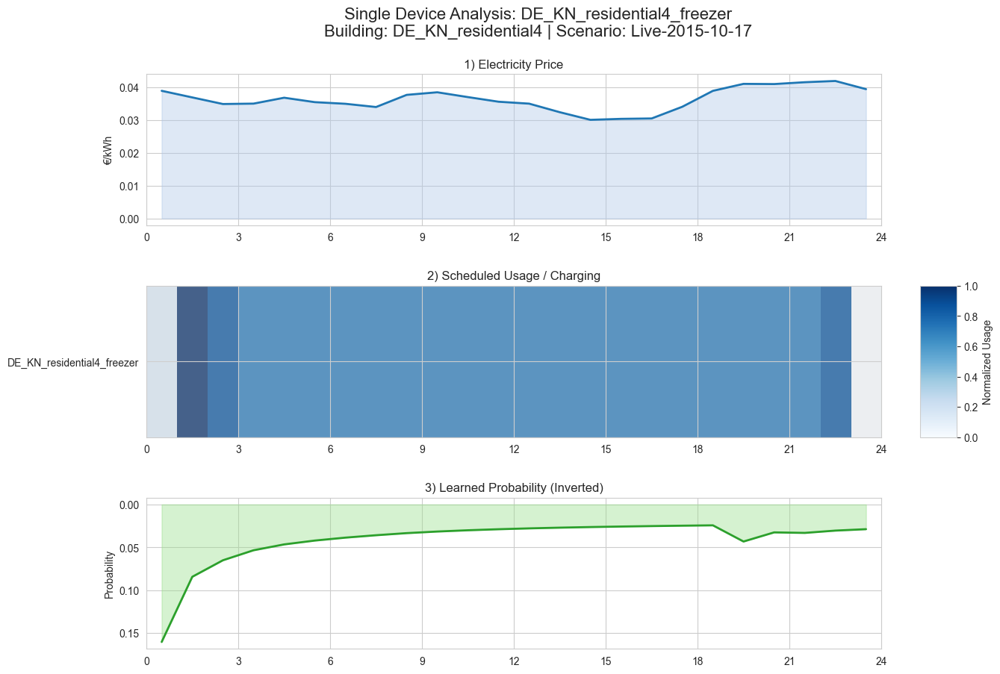

--- Single‐device plot for heat_pump ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


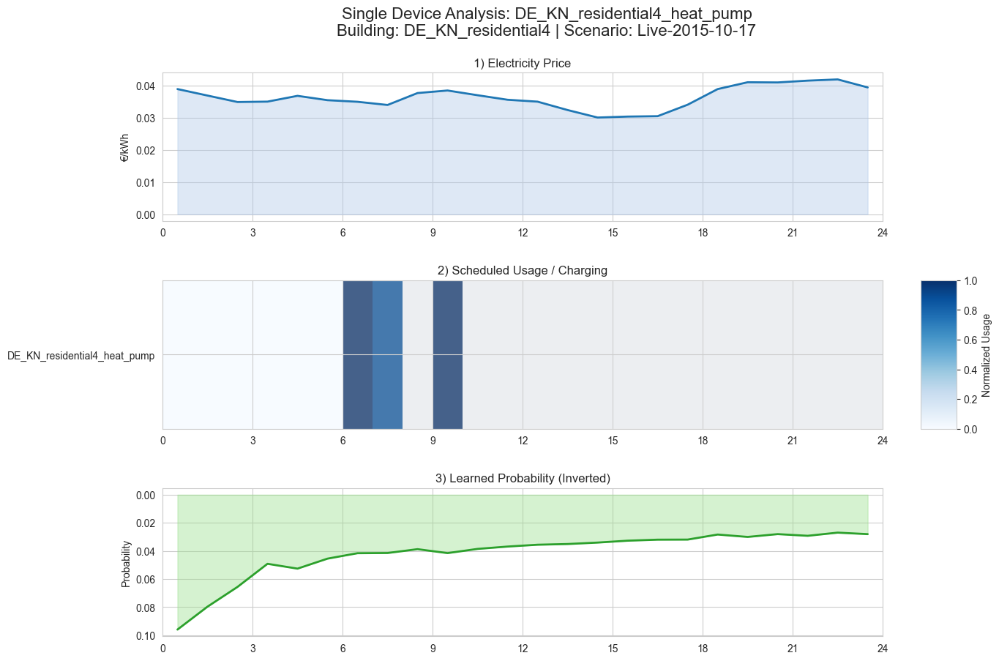

--- Single‐device plot for refrigerator ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


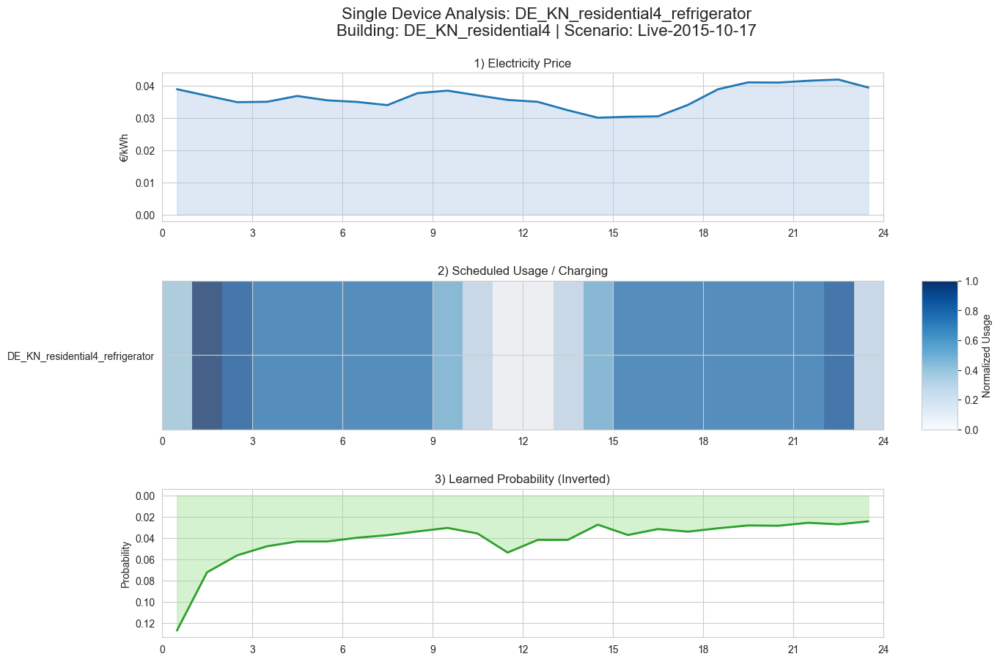

--- Single‐device plot for washing_machine ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


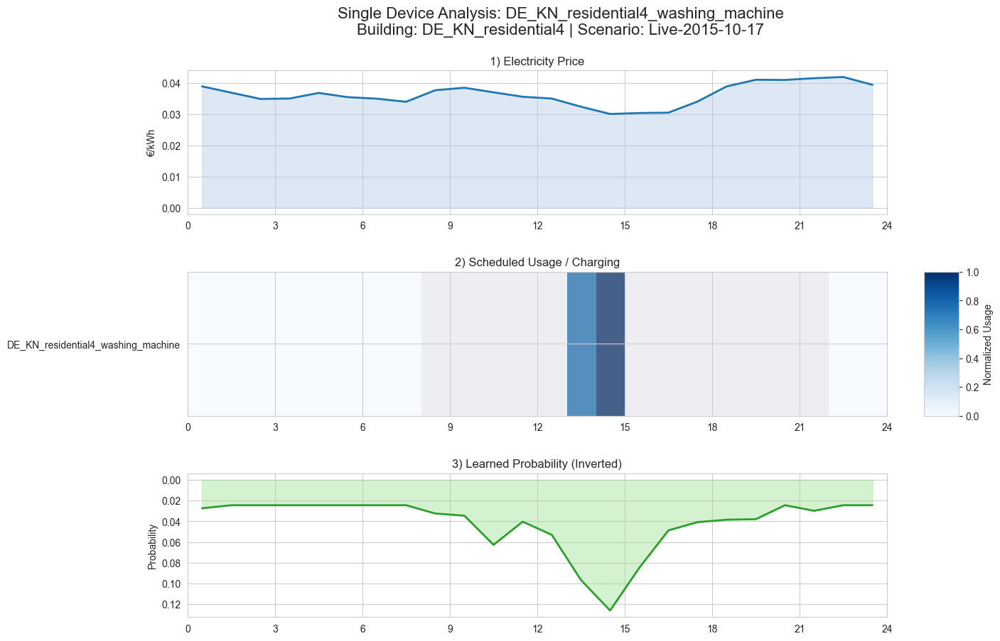

✅ Completed single‐device plots for all 6 devices on 2015-10-17

=== Full scenario heatmaps for 2015-10-18 ===


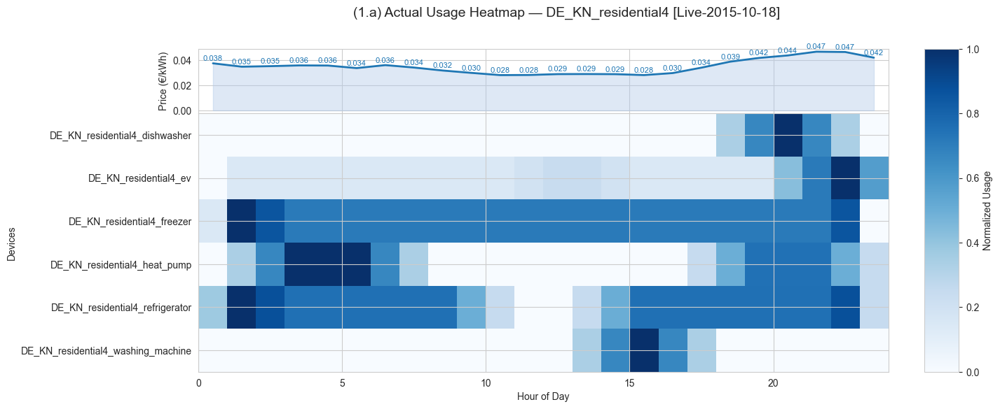

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


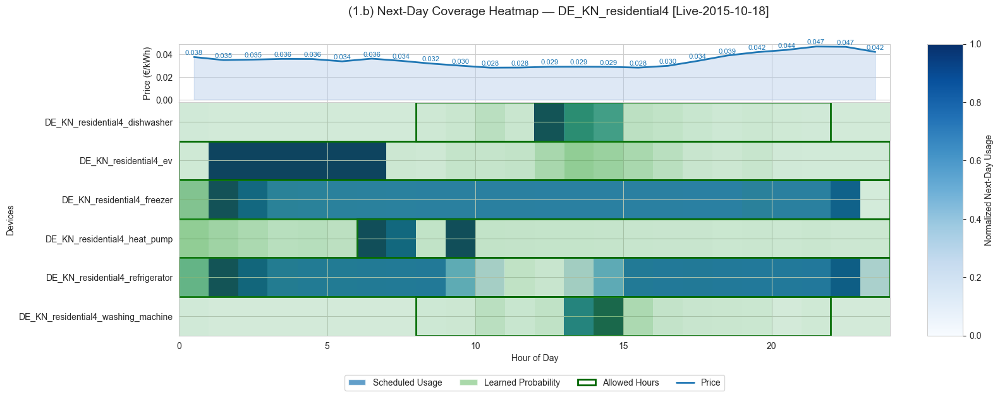

--- Single‐device plot for dishwasher ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


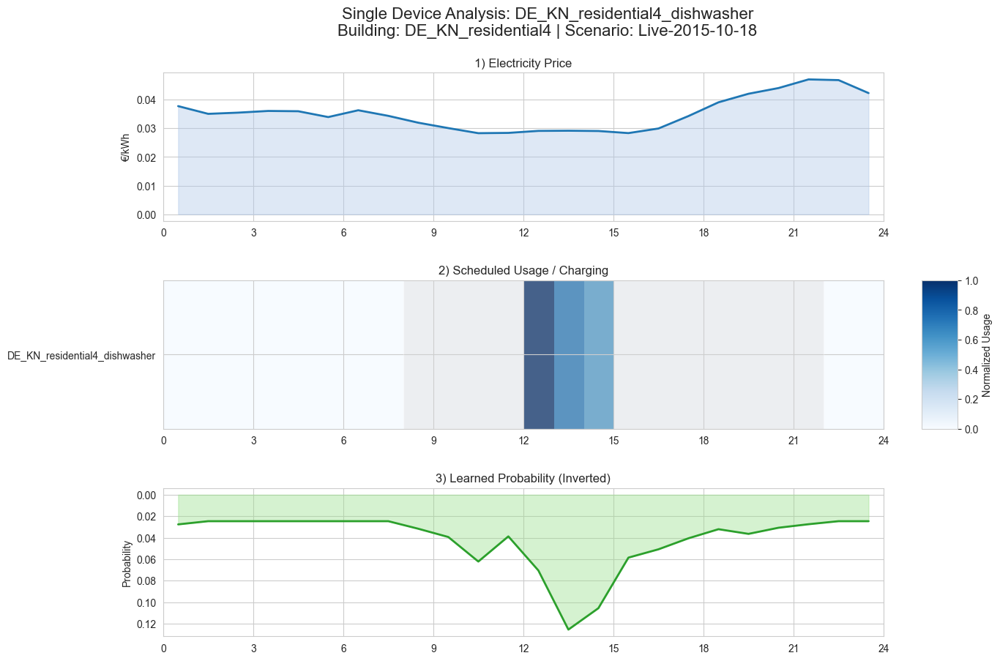

--- Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


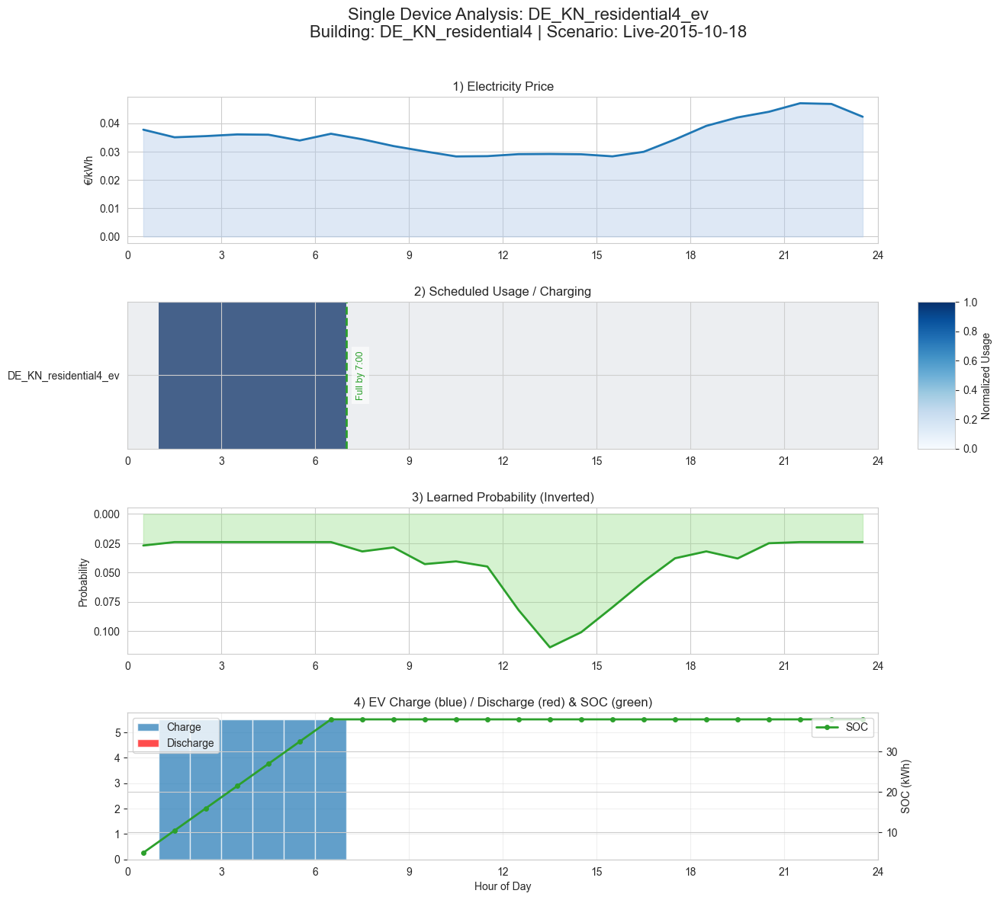

--- Single‐device plot for freezer ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


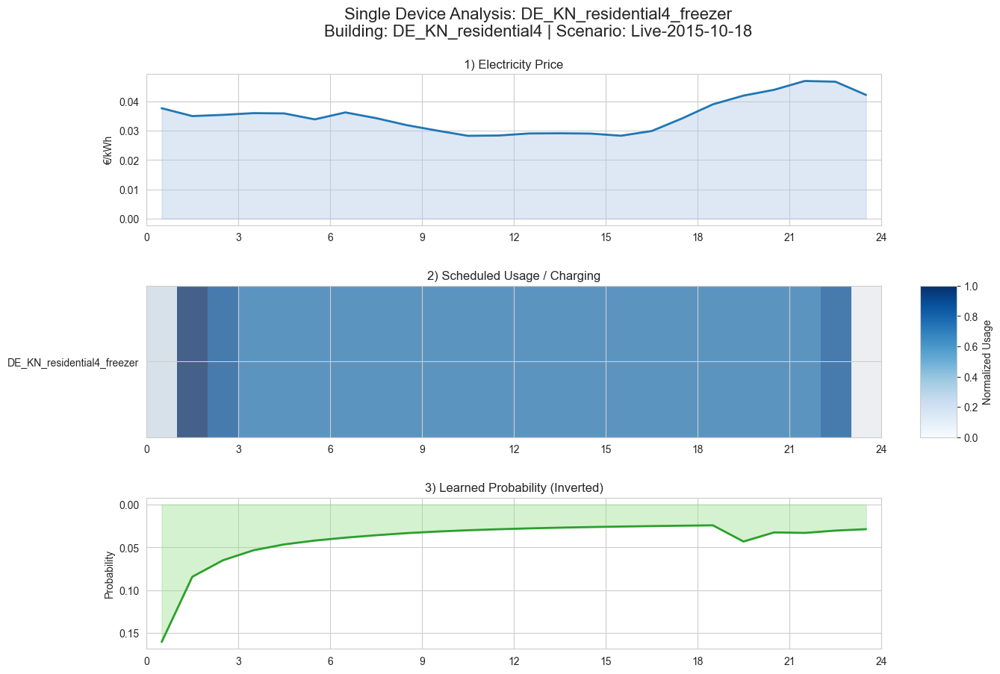

--- Single‐device plot for heat_pump ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


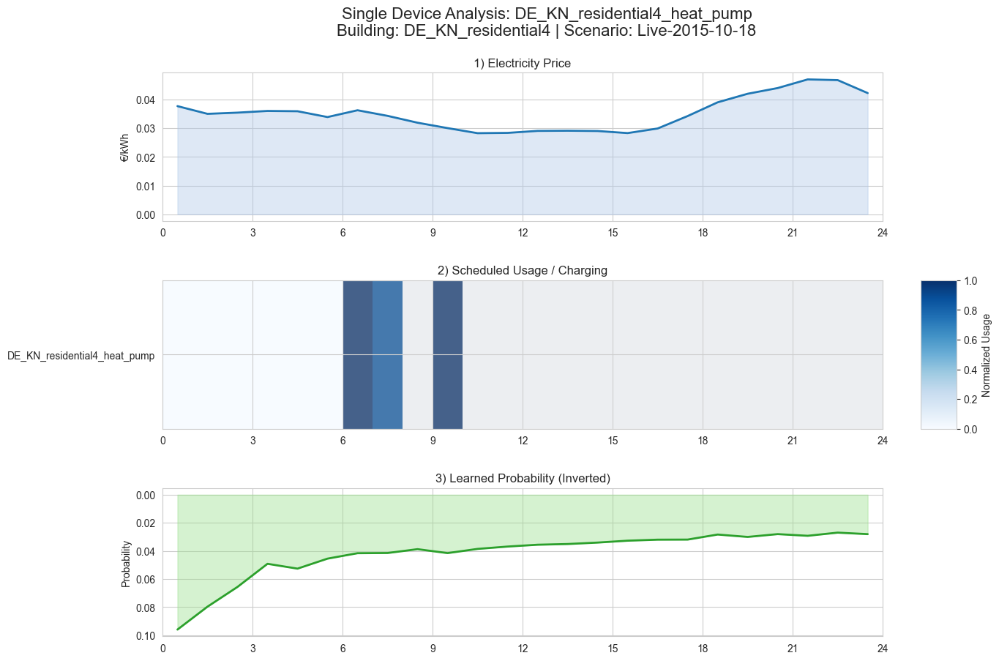

--- Single‐device plot for refrigerator ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


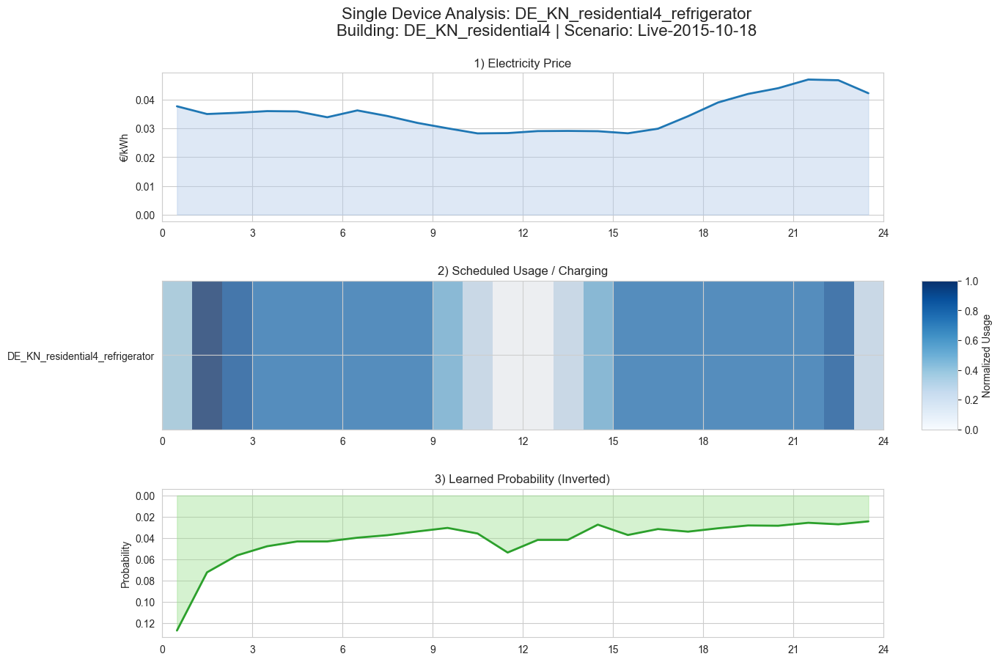

--- Single‐device plot for washing_machine ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


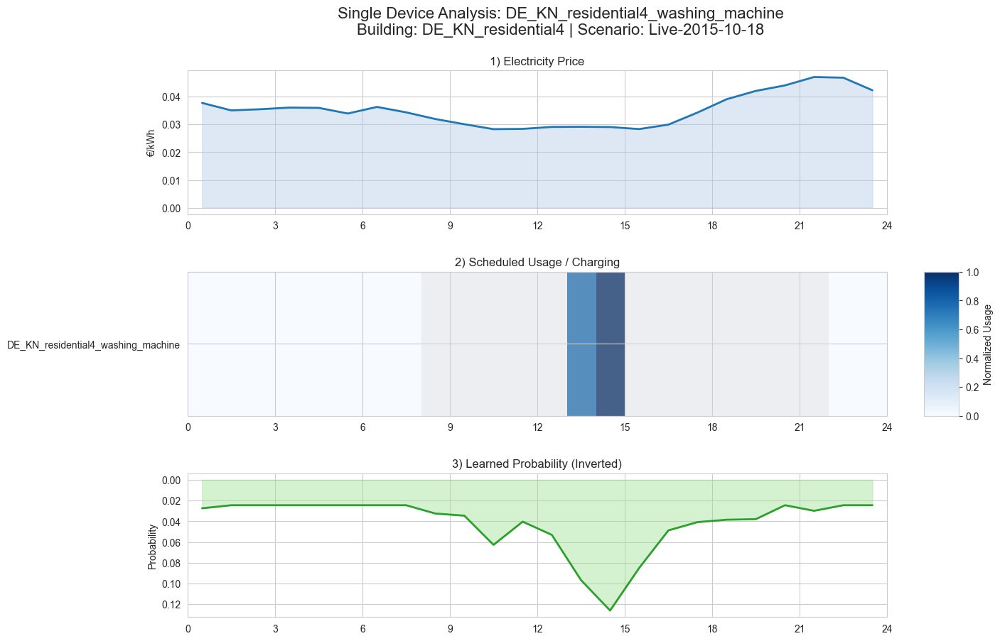

✅ Completed single‐device plots for all 6 devices on 2015-10-18

=== Full scenario heatmaps for 2015-10-19 ===


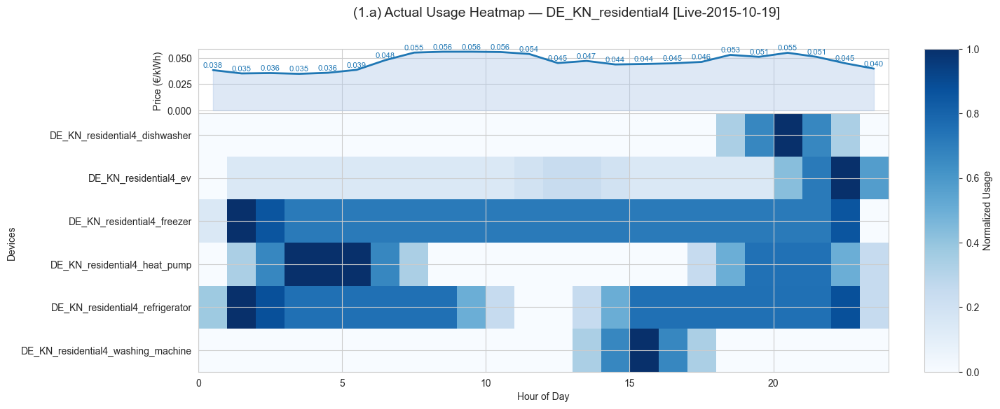

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


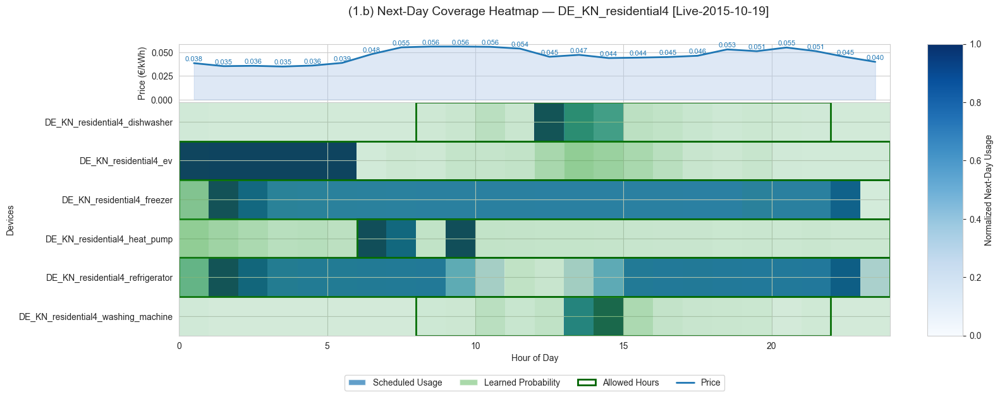

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


--- Single‐device plot for dishwasher ---


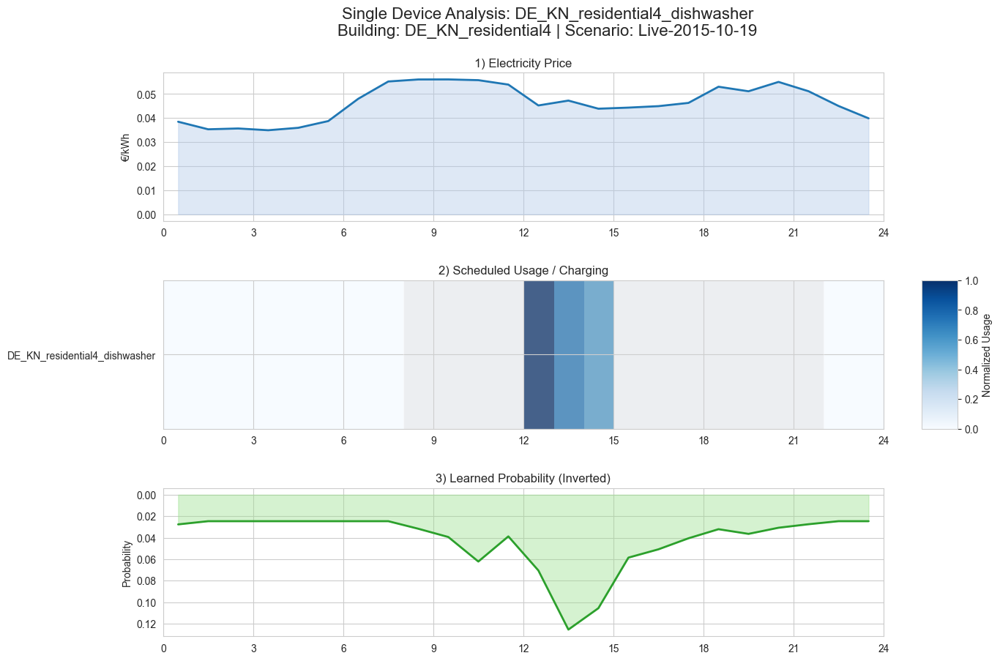

--- Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


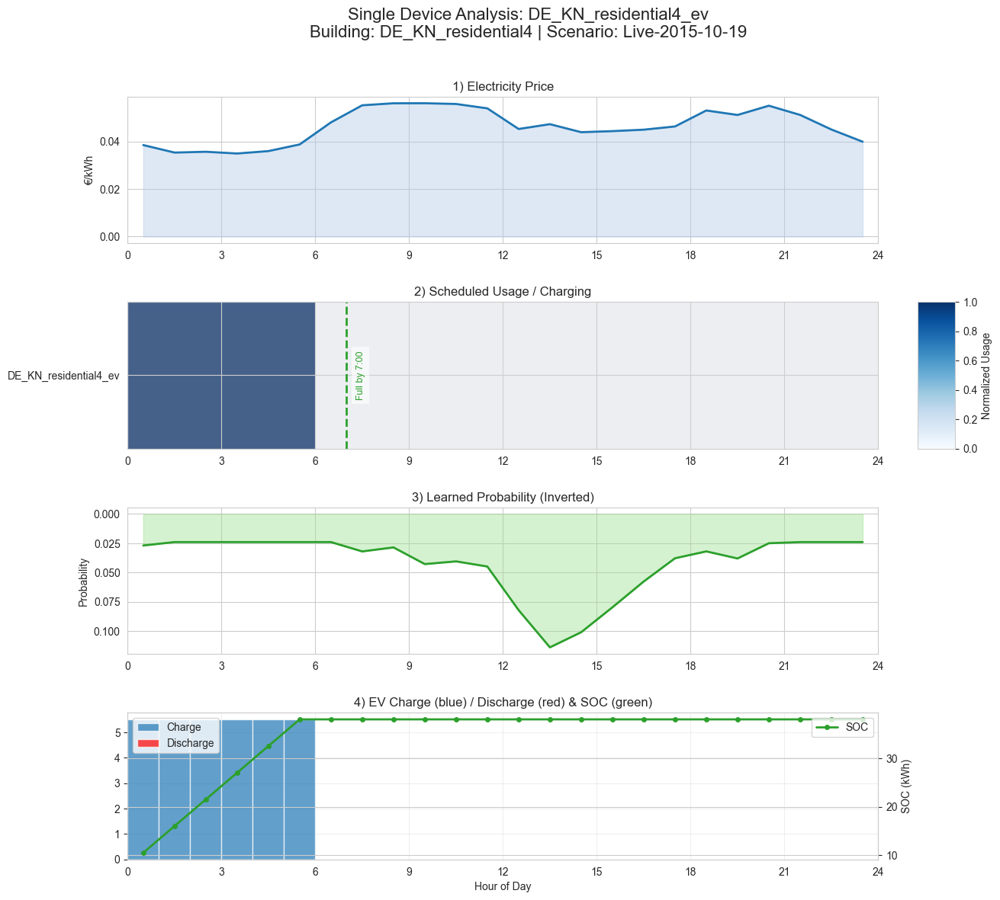

--- Single‐device plot for freezer ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


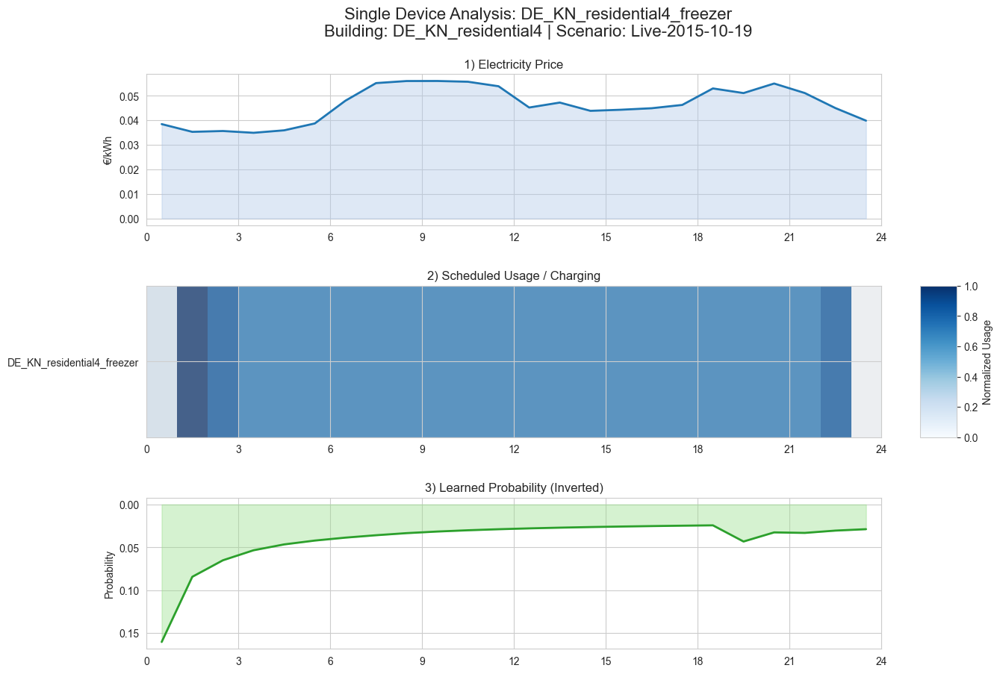

--- Single‐device plot for heat_pump ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


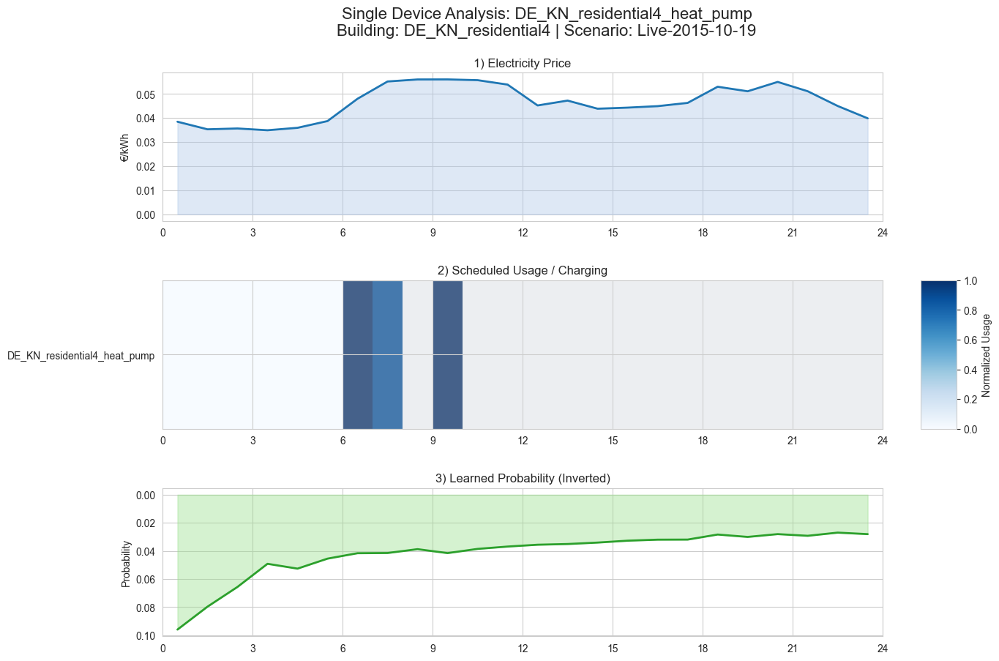

--- Single‐device plot for refrigerator ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


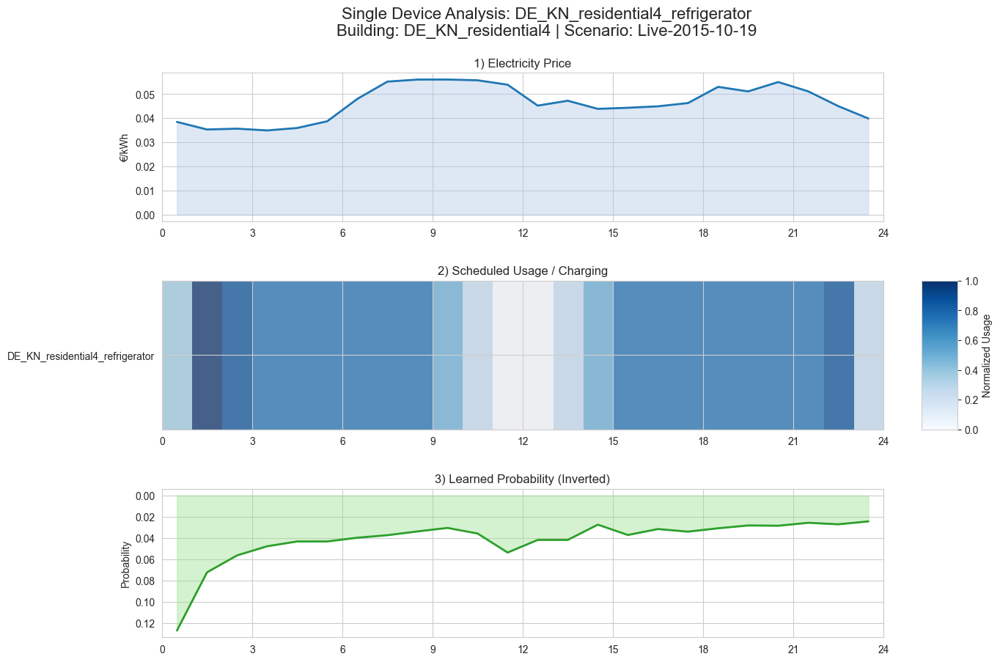

--- Single‐device plot for washing_machine ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


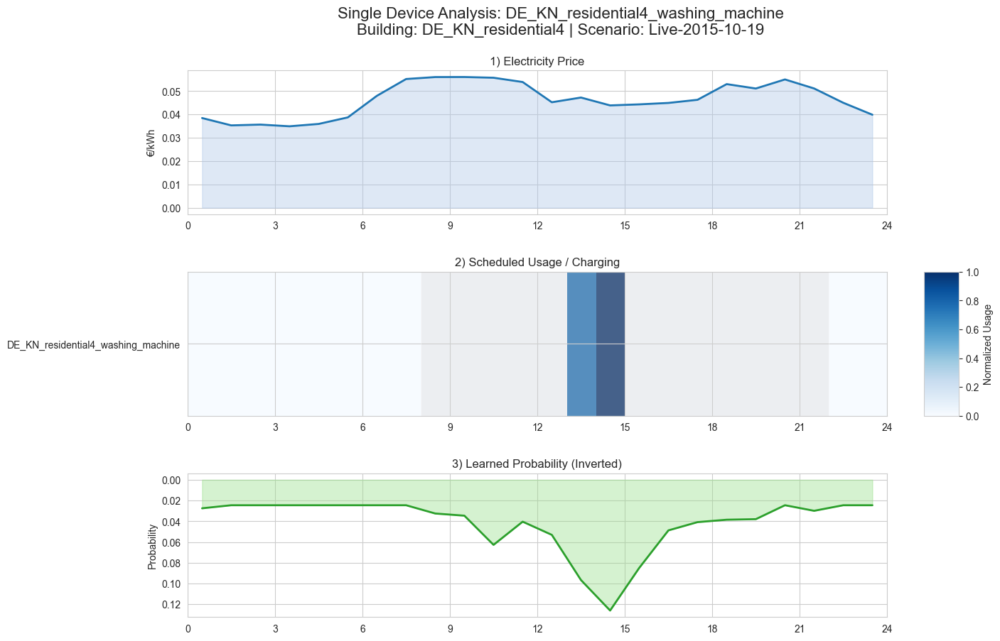

✅ Completed single‐device plots for all 6 devices on 2015-10-19

=== Full scenario heatmaps for 2015-10-20 ===


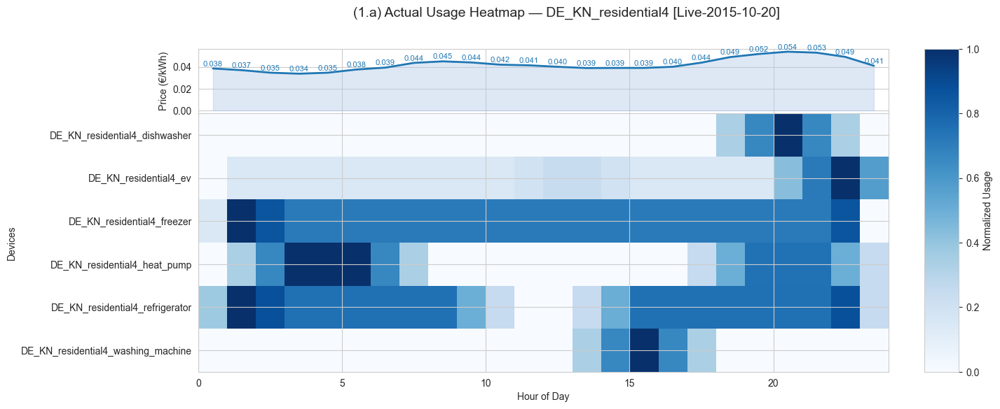

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95])


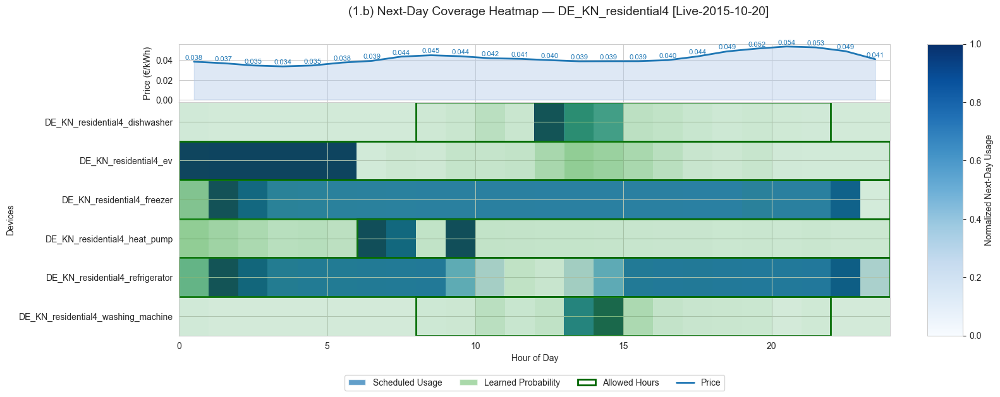

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


--- Single‐device plot for dishwasher ---


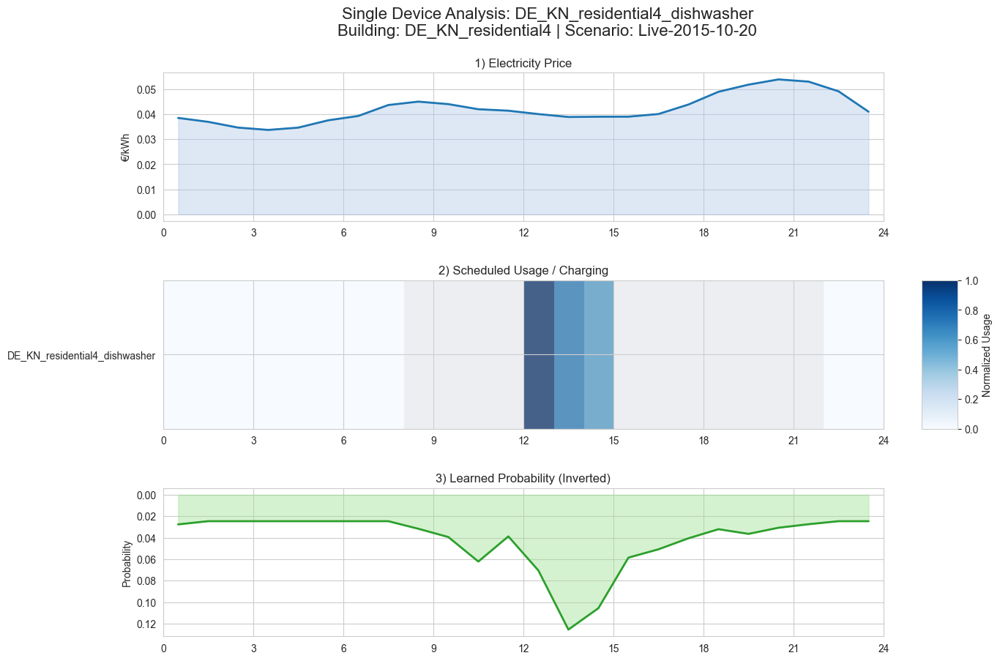

--- Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


KeyboardInterrupt: 

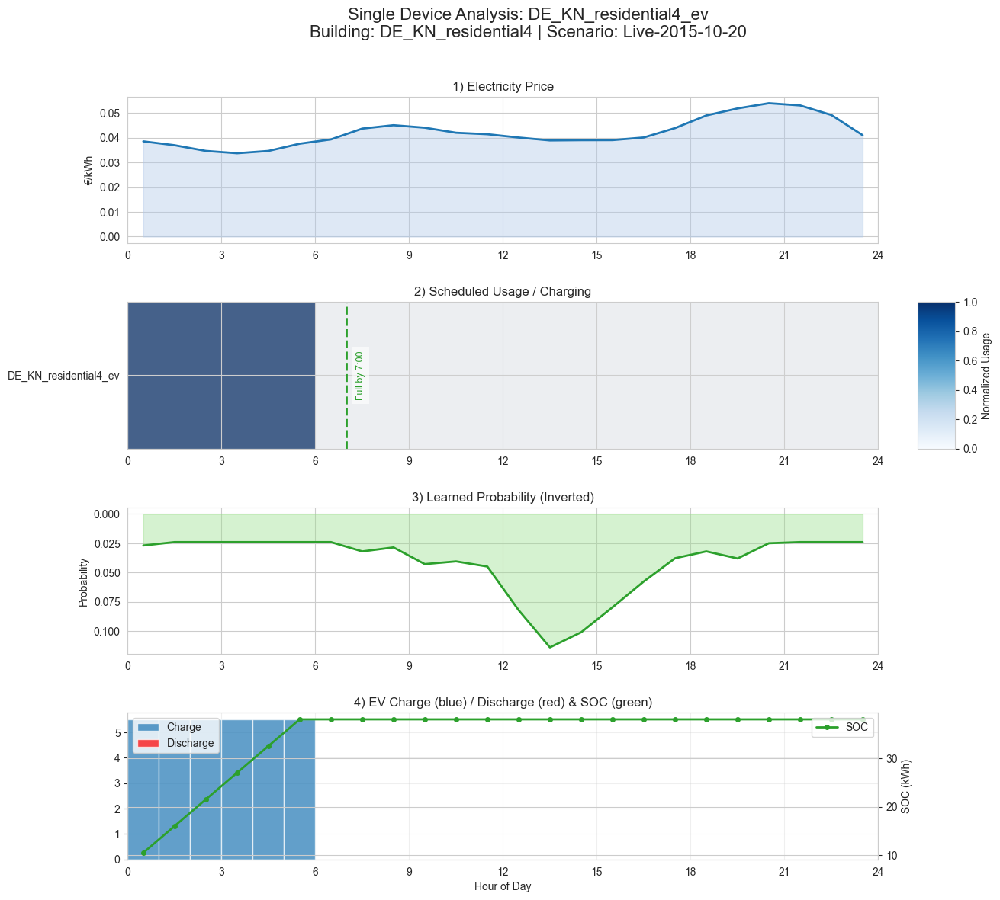

In [9]:
# ─────────────────────────────────────────────────────────────────────────────
# Section: Visualize all single‐device analyses for Pipeline B
# ─────────────────────────────────────────────────────────────────────────────
for day, results in pipeline_b_results.items():
    devices = results["devices"]
    print(f"\n=== Full scenario heatmaps for {day} ===")
    plot_heatmaps_for_scenario(
        devices,
        building_id,
        f"Live-{day}",
        save_path="results/plots"
    )

    # Now plot each device individually (including EV)
    for dev in devices:
        short = dev.device_name.replace(f"{building_id}_", "")
        print(f"--- Single‐device plot for {short} ---")
        plot_single_device_heatmap(
            devices,                # pass full list so helper can locate by name
            building_id,            # correct variable name
            f"Live-{day}",
            short,                  # device suffix (or full name)
            save_path="results/plots"
        )
    print(f"✅ Completed single‐device plots for all {len(devices)} devices on {day}")


## EV Full By Hour Testing

2025-06-10 12:08:56,109 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:56,111 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:56,111 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:56,112 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:56,113 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:56,113 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:56,113 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:56,113 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:56,114 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 7
2025-06-10 12:08:56,114 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:08:56,115 - root - INFO -   Max charge rate: 11.0 kW
2025-06

🚗 Pipeline C: Dynamic EV Departure Testing...

--- Pipeline C: EV Departure Schedule Definition ---
🚗 EV Departure Schedule defined for testing:
  2015-10-11: Must be full by 7:00
  2015-10-12: Must be full by 6:00
  2015-10-13: Must be full by 8:00
  2015-10-14: Must be full by 7:00
  2015-10-15: Must be full by 9:00
  2015-10-16: Must be full by 11:00
  2015-10-17: Must be full by 12:00
  2015-10-18: Must be full by 6:00
  2015-10-19: Must be full by 10:00
  2015-10-20: Must be full by 7:00

--- Pipeline C: Phase 2 with Dynamic EV Departures ---

Processing day 2015-10-11 with dynamic EV schedule…
  ✓ Extracted price series for plotting & optimization
  🚗 EV departure time for 2015-10-11: 7:00
  ✓ FlexibleDevice created for 'dishwasher'
  ✓ EVAgent created for 'ev' - must be full by 7:00
  ⚡ EV Parameters: {'category': 'Partially Flexible', 'power_rating': 11.0, 'allowed_hours': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], 'phases': [{'durat

2025-06-10 12:08:56,324 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:56,326 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:56,326 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:56,328 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:56,328 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:56,329 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:56,330 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:56,330 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:56,331 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 6
2025-06-10 12:08:56,331 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=6
2025-06-10 12:08:56,332 - root - INFO -   Max charge rate: 11.0 kW
2025-06

Solver objective value: 58.00244366438644
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 7: 2.60 kWh allocated
  Hour 9: 3.00 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=54.15, day charge=34.15, day discharge=0.00
Costs for day 2015-10-11 evaluated and stored for standardized comparison with solver objective value: 58.00244366438644
  ✓ optimize_phases_centralized() → True
  ✓ Extracted battery schedule & SOC history
  📊 EV Metrics:
    • Departure time: 7:00
    • SOC at departure: 54.1 kWh (95.0%)
    • Total chargi

2025-06-10 12:08:56,500 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:56,502 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:56,503 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:56,503 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:56,504 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:56,505 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:56,505 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:56,506 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:56,506 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 8
2025-06-10 12:08:56,506 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=8
2025-06-10 12:08:56,507 - root - INFO -   Max charge rate: 11.0 kW
2025-06

  ✓ EVAgent created for 'ev' - must be full by 8:00
  ⚡ EV Parameters: {'category': 'Partially Flexible', 'power_rating': 11.0, 'allowed_hours': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], 'phases': [{'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 4.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 3.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}], 'flex_model': 'partial_usage', 'must_be_full_by_hour': 8, 'max_charge_rate': 11.0, 'capacity': 60.0, 'soc_max': 57, 'soc_min': 3, 'initial_soc': 20, 'efficiency_charge': 0.92, 'efficiency_discharge': 0.92, 'max_discharge_rate': 11.0}
  ✓ FlexibleDevice created for 'freezer'
  ✓ FlexibleDevice created for 'heat_pump'
  ✓ FlexibleDevice created for 'refrigerator'
  ✓ FlexibleDevice created for 'washing_machine'
  ✓ GlobalOptimizer initialize

2025-06-10 12:08:56,699 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:56,699 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:56,700 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:56,701 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:56,701 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:56,701 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:56,702 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:56,703 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 7
2025-06-10 12:08:56,703 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:08:56,704 - root - INFO -   Max charge rate: 11.0 kW
2025-06-10 12:08:56,704 - root - INFO -   Battery capacity: 57 kWh
2025-06-10 

  ✓ EVAgent created for 'ev' - must be full by 7:00
  ⚡ EV Parameters: {'category': 'Partially Flexible', 'power_rating': 11.0, 'allowed_hours': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], 'phases': [{'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 4.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 3.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}], 'flex_model': 'partial_usage', 'must_be_full_by_hour': 7, 'max_charge_rate': 11.0, 'capacity': 60.0, 'soc_max': 57, 'soc_min': 3, 'initial_soc': 20, 'efficiency_charge': 0.92, 'efficiency_discharge': 0.92, 'max_discharge_rate': 11.0}
  ✓ FlexibleDevice created for 'freezer'
  ✓ FlexibleDevice created for 'heat_pump'
  ✓ FlexibleDevice created for 'refrigerator'
  ✓ FlexibleDevice created for 'washing_machine'
  ✓ GlobalOptimizer initialize

2025-06-10 12:08:56,883 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:56,884 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:56,884 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:56,885 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:56,885 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:56,886 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:56,886 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 9
2025-06-10 12:08:56,886 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=9
2025-06-10 12:08:56,887 - root - INFO -   Max charge rate: 11.0 kW
2025-06-10 12:08:56,888 - root - INFO -   Battery capacity: 57 kWh
2025-06-10 12:08:56,888 - root - INFO -   Allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 1

  ✓ EVAgent created for 'ev' - must be full by 9:00
  ⚡ EV Parameters: {'category': 'Partially Flexible', 'power_rating': 11.0, 'allowed_hours': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], 'phases': [{'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 4.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 3.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}], 'flex_model': 'partial_usage', 'must_be_full_by_hour': 9, 'max_charge_rate': 11.0, 'capacity': 60.0, 'soc_max': 57, 'soc_min': 3, 'initial_soc': 20, 'efficiency_charge': 0.92, 'efficiency_discharge': 0.92, 'max_discharge_rate': 11.0}
  ✓ FlexibleDevice created for 'freezer'
  ✓ FlexibleDevice created for 'heat_pump'
  ✓ FlexibleDevice created for 'refrigerator'
  ✓ FlexibleDevice created for 'washing_machine'
  ✓ GlobalOptimizer initialize

2025-06-10 12:08:57,184 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:57,185 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:57,185 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:57,186 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:57,187 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:57,188 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:57,189 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:57,189 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:57,190 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 12
2025-06-10 12:08:57,190 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=12
2025-06-10 12:08:57,190 - root - INFO -   Max charge rate: 11.0 kW
2025-

Processing DE_KN_residential4_dishwasher: discrete-phase model with 3 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Processing DE_KN_residential4_ev: partial-usage model, allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Processing DE_KN_residential4_heat_pump: partial-usage model, allowed hours: [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
DE_KN_residential4_heat_pump: Following phases in order: [2.8, 3.0, 2.8]
Processing DE_KN_residential4_washing_machine: discrete-phase model with 2 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Battery available with capacity: 15.0 kWh, current SOC: 0.6
EV available with capacity: 60.0 kWh, current SOC: 20
Adding building-wide load constraints...
Solving centralized MILP...
Solver objective value: 58.538308139914534
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3

2025-06-10 12:08:57,347 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:57,348 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:57,349 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:57,349 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:57,350 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:57,351 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:57,351 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:57,352 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:57,352 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 6
2025-06-10 12:08:57,352 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=6
2025-06-10 12:08:57,352 - root - INFO -   Max charge rate: 11.0 kW
2025-06

Solver objective value: 58.38214181450334
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 7: 2.60 kWh allocated
  Hour 9: 3.00 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=54.15, day charge=34.15, day discharge=0.00
Costs for day 2015-10-17 evaluated and stored for standardized comparison with solver objective value: 58.38214181450334
  ✓ optimize_phases_centralized() → True
  ✓ Extracted battery schedule & SOC history
  📊 EV Metrics:
    • Departure time: 12:00
    • SOC at departure: 54.1 kWh (95.0%)
    • Total charg

2025-06-10 12:08:57,515 - root - WARNING - No forecast data for 2015-10-19. Returning zeros.
2025-06-10 12:08:57,517 - root - WARNING - WeatherAgent: incomplete data (0 rows) for 2015-10-19
2025-06-10 12:08:57,669 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:57,670 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:57,671 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:57,672 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:57,672 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:57,673 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:57,673 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:57,674 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:57,674 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 

  ✓ GlobalOptimizer initialized with all devices
Starting centralized next-day optimization...
Processing DE_KN_residential4_dishwasher: discrete-phase model with 3 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Processing DE_KN_residential4_ev: partial-usage model, allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Processing DE_KN_residential4_heat_pump: partial-usage model, allowed hours: [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
DE_KN_residential4_heat_pump: Following phases in order: [2.8, 3.0, 2.8]
Processing DE_KN_residential4_washing_machine: discrete-phase model with 2 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Battery available with capacity: 15.0 kWh, current SOC: 0.6
EV available with capacity: 60.0 kWh, current SOC: 20
Adding building-wide load constraints...
Solving centralized MILP...
Solver objective value: 58.33325644562665
MIL

2025-06-10 12:08:57,826 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:57,827 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:57,827 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:57,829 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:57,830 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:57,830 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:57,830 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:57,830 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:57,832 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 18
2025-06-10 12:08:57,832 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=18
2025-06-10 12:08:57,833 - root - INFO -   Max charge rate: 11.0 kW
2025-

Processing DE_KN_residential4_dishwasher: discrete-phase model with 3 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Processing DE_KN_residential4_ev: partial-usage model, allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Processing DE_KN_residential4_heat_pump: partial-usage model, allowed hours: [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
DE_KN_residential4_heat_pump: Following phases in order: [2.8, 3.0, 2.8]
Processing DE_KN_residential4_washing_machine: discrete-phase model with 2 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Battery available with capacity: 15.0 kWh, current SOC: 0.6
EV available with capacity: 60.0 kWh, current SOC: 20
Adding building-wide load constraints...
Solving centralized MILP...
Solver objective value: 58.307366701452544
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3

2025-06-10 12:08:57,989 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:57,989 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:57,991 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:57,992 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:57,992 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:57,993 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:57,993 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:57,993 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:57,994 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 19
2025-06-10 12:08:57,995 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=19
2025-06-10 12:08:57,995 - root - INFO -   Max charge rate: 11.0 kW
2025-

Solver objective value: 58.487216828310956
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 7: 2.60 kWh allocated
  Hour 9: 3.00 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=54.15, day charge=34.15, day discharge=0.00
Costs for day 2015-10-21 evaluated and stored for standardized comparison with solver objective value: 58.487216828310956
  ✓ optimize_phases_centralized() → True
  ✓ Extracted battery schedule & SOC history
  📊 EV Metrics:
    • Departure time: 18:00
    • SOC at departure: 54.1 kWh (95.0%)
    • Total cha

2025-06-10 12:08:58,155 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:58,156 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:58,157 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:58,158 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:58,158 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:58,159 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:58,159 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:58,160 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 13
2025-06-10 12:08:58,160 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=13
2025-06-10 12:08:58,161 - root - INFO -   Max charge rate: 11.0 kW
2025-06-10 12:08:58,162 - root - INFO -   Battery capacity: 57 kWh
2025-06-1

  ✓ EVAgent created for 'ev' - must be full by 13:00
  ⚡ EV Parameters: {'category': 'Partially Flexible', 'power_rating': 11.0, 'allowed_hours': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], 'phases': [{'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 4.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 3.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}], 'flex_model': 'partial_usage', 'must_be_full_by_hour': 13, 'max_charge_rate': 11.0, 'capacity': 60.0, 'soc_max': 57, 'soc_min': 3, 'initial_soc': 20, 'efficiency_charge': 0.92, 'efficiency_discharge': 0.92, 'max_discharge_rate': 11.0}
  ✓ FlexibleDevice created for 'freezer'
  ✓ FlexibleDevice created for 'heat_pump'
  ✓ FlexibleDevice created for 'refrigerator'
  ✓ FlexibleDevice created for 'washing_machine'
  ✓ GlobalOptimizer initiali

2025-06-10 12:08:58,483 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:58,484 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:58,484 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:58,485 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:58,486 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:58,486 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:58,486 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:58,487 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:58,488 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 8
2025-06-10 12:08:58,488 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=8
2025-06-10 12:08:58,489 - root - INFO -   Max charge rate: 11.0 kW
2025-06

Processing DE_KN_residential4_dishwasher: discrete-phase model with 3 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Processing DE_KN_residential4_ev: partial-usage model, allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Processing DE_KN_residential4_heat_pump: partial-usage model, allowed hours: [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
DE_KN_residential4_heat_pump: Following phases in order: [2.8, 3.0, 2.8]
Processing DE_KN_residential4_washing_machine: discrete-phase model with 2 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Battery available with capacity: 15.0 kWh, current SOC: 0.6
EV available with capacity: 60.0 kWh, current SOC: 20
Adding building-wide load constraints...
Solving centralized MILP...
Solver objective value: 55.324013199932914
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3

2025-06-10 12:08:58,652 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:58,653 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:58,654 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:58,655 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:58,655 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:58,655 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:58,657 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:58,657 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:58,658 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 6
2025-06-10 12:08:58,658 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=6
2025-06-10 12:08:58,658 - root - INFO -   Max charge rate: 11.0 kW
2025-06

Solver objective value: 57.75733818693941
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 7: 2.60 kWh allocated
  Hour 9: 3.00 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=54.15, day charge=34.15, day discharge=0.00
Costs for day 2015-10-26 evaluated and stored for standardized comparison with solver objective value: 57.75733818693941
  ✓ optimize_phases_centralized() → True
  ✓ Extracted battery schedule & SOC history
  📊 EV Metrics:
    • Departure time: 8:00
    • SOC at departure: 54.1 kWh (95.0%)
    • Total chargi

2025-06-10 12:08:58,836 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:58,836 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:58,837 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:58,838 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:58,838 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:58,839 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:58,839 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:58,840 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:58,840 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 14
2025-06-10 12:08:58,840 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=14
2025-06-10 12:08:58,841 - root - INFO -   Max charge rate: 11.0 kW
2025-

  ✓ Extracted price series for plotting & optimization
  🚗 EV departure time for 2015-10-28: 14:00
  ✓ FlexibleDevice created for 'dishwasher'
  ✓ EVAgent created for 'ev' - must be full by 14:00
  ⚡ EV Parameters: {'category': 'Partially Flexible', 'power_rating': 11.0, 'allowed_hours': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], 'phases': [{'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 4.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 3.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}], 'flex_model': 'partial_usage', 'must_be_full_by_hour': 14, 'max_charge_rate': 11.0, 'capacity': 60.0, 'soc_max': 57, 'soc_min': 3, 'initial_soc': 20, 'efficiency_charge': 0.92, 'efficiency_discharge': 0.92, 'max_discharge_rate': 11.0}
  ✓ FlexibleDevice created for 'freezer'
  ✓ FlexibleDevice crea

2025-06-10 12:08:59,147 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:59,148 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:59,148 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:59,149 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:59,149 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:59,150 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:59,150 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:59,150 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:59,151 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 20
2025-06-10 12:08:59,152 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=20
2025-06-10 12:08:59,152 - root - INFO -   Max charge rate: 11.0 kW
2025-

Solver objective value: 57.902154050641386
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 7: 2.60 kWh allocated
  Hour 9: 3.00 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=54.15, day charge=34.15, day discharge=0.00
Costs for day 2015-10-29 evaluated and stored for standardized comparison with solver objective value: 57.902154050641386
  ✓ optimize_phases_centralized() → True
  ✓ Extracted battery schedule & SOC history
  📊 EV Metrics:
    • Departure time: 7:00
    • SOC at departure: 54.1 kWh (95.0%)
    • Total char

2025-06-10 12:08:59,305 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:59,306 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:59,306 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:59,307 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:59,307 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:59,308 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:59,308 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 10
2025-06-10 12:08:59,308 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=10
2025-06-10 12:08:59,309 - root - INFO -   Max charge rate: 11.0 kW
2025-06-10 12:08:59,309 - root - INFO -   Battery capacity: 57 kWh
2025-06-10 12:08:59,309 - root - INFO -   Allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9,

  ✓ EVAgent created for 'ev' - must be full by 10:00
  ⚡ EV Parameters: {'category': 'Partially Flexible', 'power_rating': 11.0, 'allowed_hours': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], 'phases': [{'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 4.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 3.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}], 'flex_model': 'partial_usage', 'must_be_full_by_hour': 10, 'max_charge_rate': 11.0, 'capacity': 60.0, 'soc_max': 57, 'soc_min': 3, 'initial_soc': 20, 'efficiency_charge': 0.92, 'efficiency_discharge': 0.92, 'max_discharge_rate': 11.0}
  ✓ FlexibleDevice created for 'freezer'
  ✓ FlexibleDevice created for 'heat_pump'
  ✓ FlexibleDevice created for 'refrigerator'
  ✓ FlexibleDevice created for 'washing_machine'
  ✓ GlobalOptimizer initiali

2025-06-10 12:08:59,608 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:59,608 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:59,609 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:59,610 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:59,611 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:59,612 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:59,613 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:59,613 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:59,614 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 7
2025-06-10 12:08:59,614 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:08:59,615 - root - INFO -   Max charge rate: 11.0 kW
2025-06

Solver objective value: 57.89012149242577
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 7: 2.60 kWh allocated
  Hour 9: 3.00 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=54.15, day charge=34.15, day discharge=0.00
Costs for day 2015-11-01 evaluated and stored for standardized comparison with solver objective value: 57.89012149242577
  ✓ optimize_phases_centralized() → True
  ✓ Extracted battery schedule & SOC history
  📊 EV Metrics:
    • Departure time: 11:00
    • SOC at departure: 54.1 kWh (95.0%)
    • Total charg

2025-06-10 12:08:59,774 - root - WARNING - No forecast data for 2015-11-03. Returning zeros.
2025-06-10 12:08:59,777 - root - WARNING - WeatherAgent: incomplete data (0 rows) for 2015-11-03
2025-06-10 12:08:59,912 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:08:59,913 - root - INFO - Detected battery charge columns => []
2025-06-10 12:08:59,913 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:08:59,914 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:08:59,914 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:08:59,915 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:08:59,916 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:08:59,917 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:08:59,918 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 

Processing DE_KN_residential4_dishwasher: discrete-phase model with 3 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Processing DE_KN_residential4_ev: partial-usage model, allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Processing DE_KN_residential4_heat_pump: partial-usage model, allowed hours: [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
DE_KN_residential4_heat_pump: Following phases in order: [2.8, 3.0, 2.8]
Processing DE_KN_residential4_washing_machine: discrete-phase model with 2 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Battery available with capacity: 15.0 kWh, current SOC: 0.6
EV available with capacity: 60.0 kWh, current SOC: 20
Adding building-wide load constraints...
Solving centralized MILP...
Solver objective value: 58.02970957710888
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 

2025-06-10 12:09:00,108 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:09:00,109 - root - INFO - Detected battery charge columns => []
2025-06-10 12:09:00,110 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:09:00,111 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:09:00,111 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:09:00,111 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:09:00,112 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:09:00,112 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:09:00,112 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 7
2025-06-10 12:09:00,113 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:09:00,114 - root - INFO -   Max charge rate: 11.0 kW
2025-06

Solver objective value: 57.885102421474315
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 7: 2.60 kWh allocated
  Hour 9: 3.00 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=54.15, day charge=34.15, day discharge=0.00
Costs for day 2015-11-04 evaluated and stored for standardized comparison with solver objective value: 57.885102421474315
  ✓ optimize_phases_centralized() → True
  ✓ Extracted battery schedule & SOC history
  📊 EV Metrics:
    • Departure time: 9:00
    • SOC at departure: 54.1 kWh (95.0%)
    • Total char

2025-06-10 12:09:00,284 - root - INFO - Detected battery charge columns => []
2025-06-10 12:09:00,285 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:09:00,286 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:09:00,286 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:09:00,287 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:09:00,288 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:09:00,289 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:09:00,289 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 17
2025-06-10 12:09:00,289 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=17
2025-06-10 12:09:00,289 - root - INFO -   Max charge rate: 11.0 kW
2025-06-10 12:09:00,289 - root - INFO -   Battery capacity: 57 kWh
2025-06-1

  ✓ EVAgent created for 'ev' - must be full by 17:00
  ⚡ EV Parameters: {'category': 'Partially Flexible', 'power_rating': 11.0, 'allowed_hours': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], 'phases': [{'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 4.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 3.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}], 'flex_model': 'partial_usage', 'must_be_full_by_hour': 17, 'max_charge_rate': 11.0, 'capacity': 60.0, 'soc_max': 57, 'soc_min': 3, 'initial_soc': 20, 'efficiency_charge': 0.92, 'efficiency_discharge': 0.92, 'max_discharge_rate': 11.0}
  ✓ FlexibleDevice created for 'freezer'
  ✓ FlexibleDevice created for 'heat_pump'
  ✓ FlexibleDevice created for 'refrigerator'
  ✓ FlexibleDevice created for 'washing_machine'
  ✓ GlobalOptimizer initiali

2025-06-10 12:09:00,598 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:09:00,599 - root - INFO - Detected battery charge columns => []
2025-06-10 12:09:00,600 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:09:00,600 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:09:00,601 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:09:00,602 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:09:00,602 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:09:00,603 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:09:00,603 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 10
2025-06-10 12:09:00,603 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=10
2025-06-10 12:09:00,604 - root - INFO -   Max charge rate: 11.0 kW
2025-

Processing DE_KN_residential4_dishwasher: discrete-phase model with 3 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Processing DE_KN_residential4_ev: partial-usage model, allowed hours: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Processing DE_KN_residential4_heat_pump: partial-usage model, allowed hours: [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
DE_KN_residential4_heat_pump: Following phases in order: [2.8, 3.0, 2.8]
Processing DE_KN_residential4_washing_machine: discrete-phase model with 2 phases, allowed hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Battery available with capacity: 15.0 kWh, current SOC: 0.6
EV available with capacity: 60.0 kWh, current SOC: 20
Adding building-wide load constraints...
Solving centralized MILP...
Solver objective value: 58.094790620934106
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3

2025-06-10 12:09:00,760 - root - INFO - 
Initializing Battery Agent...
2025-06-10 12:09:00,762 - root - INFO - Detected battery charge columns => []
2025-06-10 12:09:00,762 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:09:00,763 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:09:00,764 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:09:00,764 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:09:00,766 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:09:00,766 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:09:00,767 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 7
2025-06-10 12:09:00,767 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=7
2025-06-10 12:09:00,767 - root - INFO -   Max charge rate: 11.0 kW
2025-06

Solver objective value: 57.90994027053386
MILP solution found!
Updated DE_KN_residential4_dishwasher schedule (discrete_phase): active in 3 hours
Updated DE_KN_residential4_ev schedule (partial_usage): active in 0 hours
Updated DE_KN_residential4_freezer schedule (fixed): active in 0 hours
  Hour 6: 3.00 kWh allocated
  Hour 7: 2.60 kWh allocated
  Hour 9: 3.00 kWh allocated
Updated DE_KN_residential4_heat_pump schedule (partial_usage): active in 3 hours
Updated DE_KN_residential4_refrigerator schedule (fixed): active in 0 hours
Updated DE_KN_residential4_washing_machine schedule (discrete_phase): active in 2 hours
  Updated EV agent: SOC=54.15, day charge=34.15, day discharge=0.00
Costs for day 2015-11-08 evaluated and stored for standardized comparison with solver objective value: 57.90994027053386
  ✓ optimize_phases_centralized() → True
  ✓ Extracted battery schedule & SOC history
  📊 EV Metrics:
    • Departure time: 10:00
    • SOC at departure: 54.1 kWh (95.0%)
    • Total charg

2025-06-10 12:09:00,919 - root - INFO - Detected battery charge columns => []
2025-06-10 12:09:00,919 - root - INFO - Detected battery discharge columns => []
2025-06-10 12:09:00,920 - root - WARNING - No battery columns found. We'll treat this as no data scenario.
2025-06-10 12:09:00,921 - root - INFO - BatteryAgent ready with the following parameters:
2025-06-10 12:09:00,921 - root - INFO -   capacity range => 3.0 to 57.0 kWh
2025-06-10 12:09:00,922 - root - INFO -   charge rate => 11.00 kW, discharge rate => 0.00 kW
2025-06-10 12:09:00,922 - root - INFO -   initial SOC => 20.00 kWh
2025-06-10 12:09:00,923 - root - INFO - Initialized EV DE_KN_residential4_ev with SOC: 20.0-57.0 kWh, Charge/Discharge: 11.0/0.0 kW, Full by hour: 8
2025-06-10 12:09:00,923 - root - INFO - EVAgent initialized for DE_KN_residential4_ev with must_be_full_by_hour=8
2025-06-10 12:09:00,924 - root - INFO -   Max charge rate: 11.0 kW
2025-06-10 12:09:00,924 - root - INFO -   Battery capacity: 57 kWh
2025-06-10 

  ✓ EVAgent created for 'ev' - must be full by 8:00
  ⚡ EV Parameters: {'category': 'Partially Flexible', 'power_rating': 11.0, 'allowed_hours': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], 'phases': [{'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 4.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 3.0, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}, {'duration': 1, 'energy_kwh': 5.5, 'peak_kw': 5.0}], 'flex_model': 'partial_usage', 'must_be_full_by_hour': 8, 'max_charge_rate': 11.0, 'capacity': 60.0, 'soc_max': 57, 'soc_min': 3, 'initial_soc': 20, 'efficiency_charge': 0.92, 'efficiency_discharge': 0.92, 'max_discharge_rate': 11.0}
  ✓ FlexibleDevice created for 'freezer'
  ✓ FlexibleDevice created for 'heat_pump'
  ✓ FlexibleDevice created for 'refrigerator'
  ✓ FlexibleDevice created for 'washing_machine'
  ✓ GlobalOptimizer initialize

C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


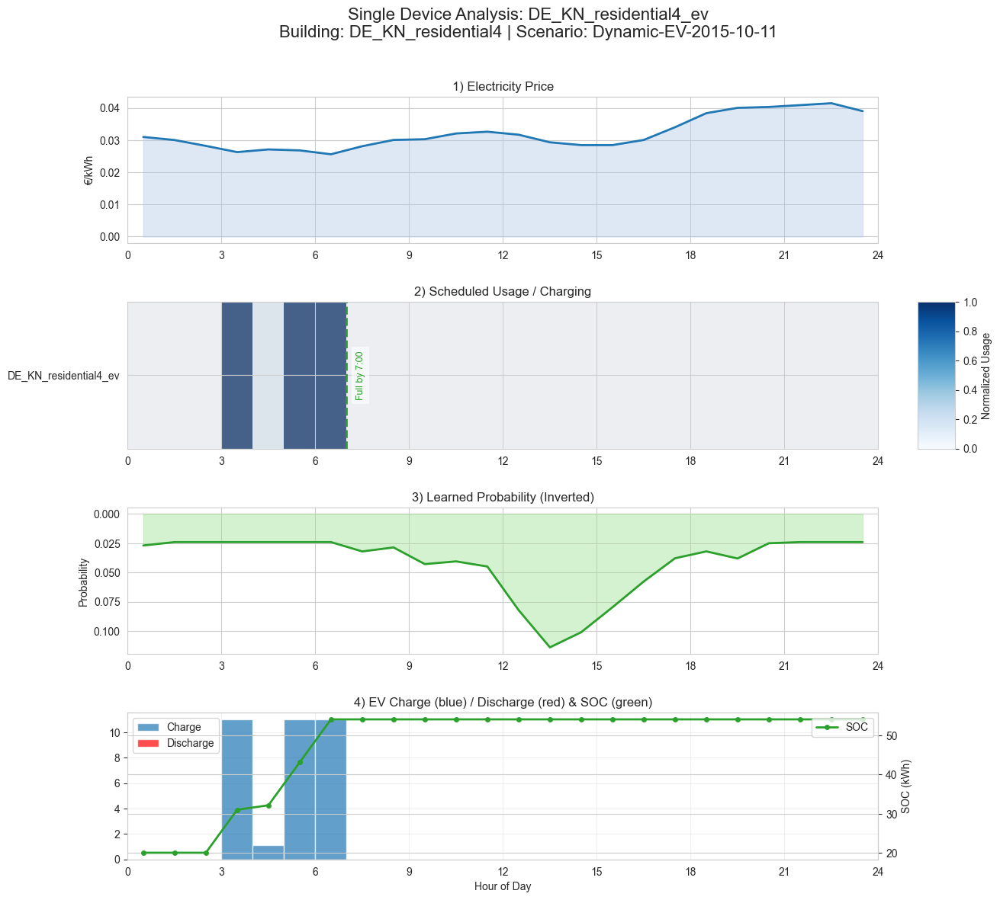

    📈 Total charging: 34.1 kWh
    🔋 SOC at 7:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 3
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-12 (Departure: 6:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


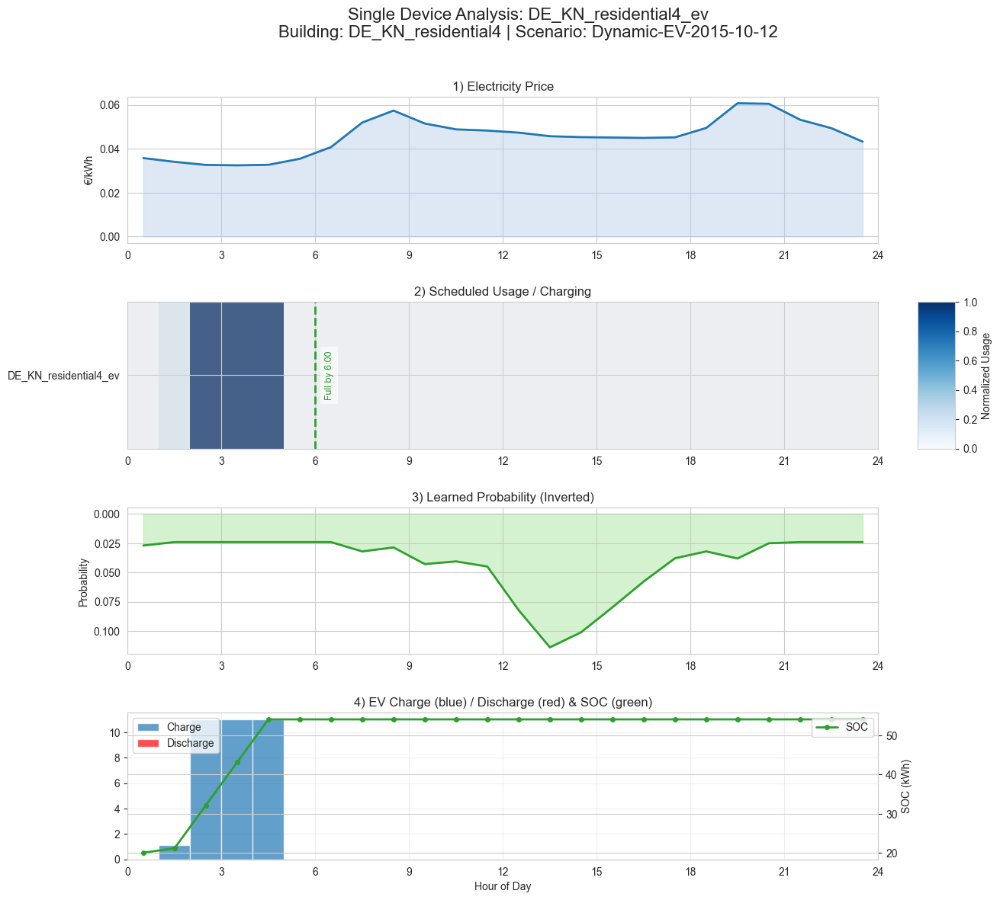

    📈 Total charging: 34.1 kWh
    🔋 SOC at 6:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 2
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-13 (Departure: 8:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


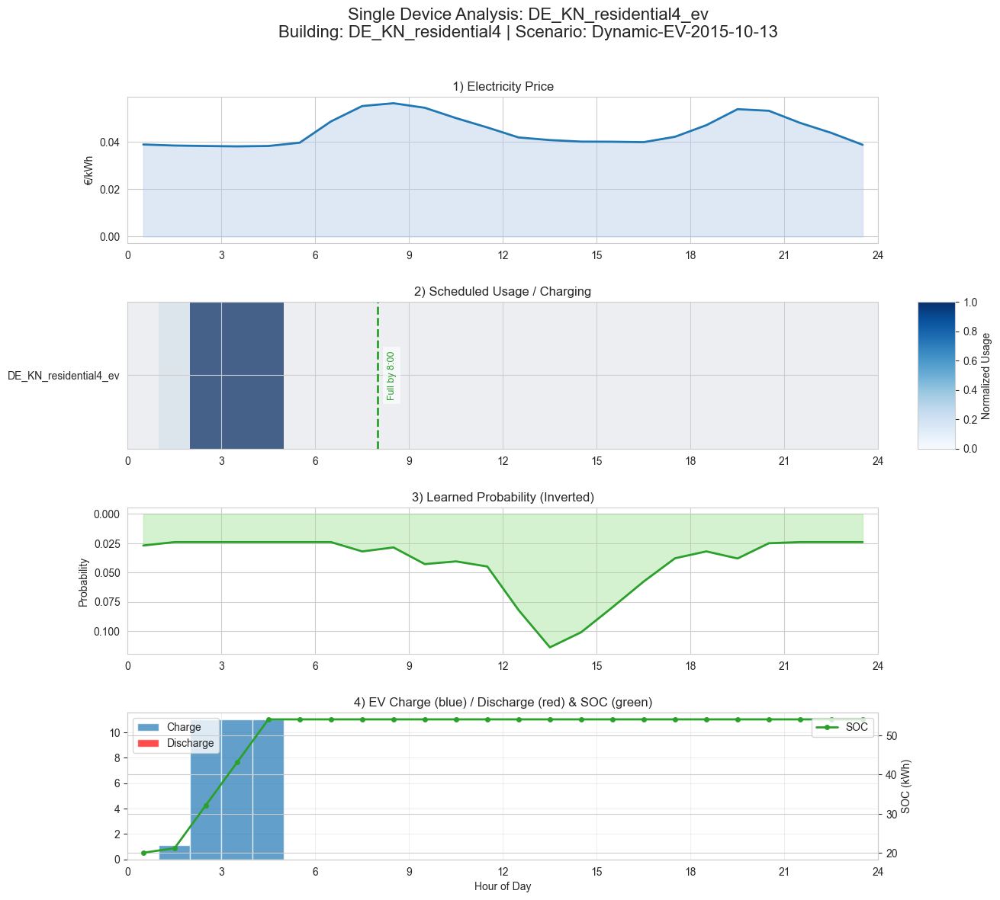

    📈 Total charging: 34.1 kWh
    🔋 SOC at 8:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 2
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-14 (Departure: 7:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


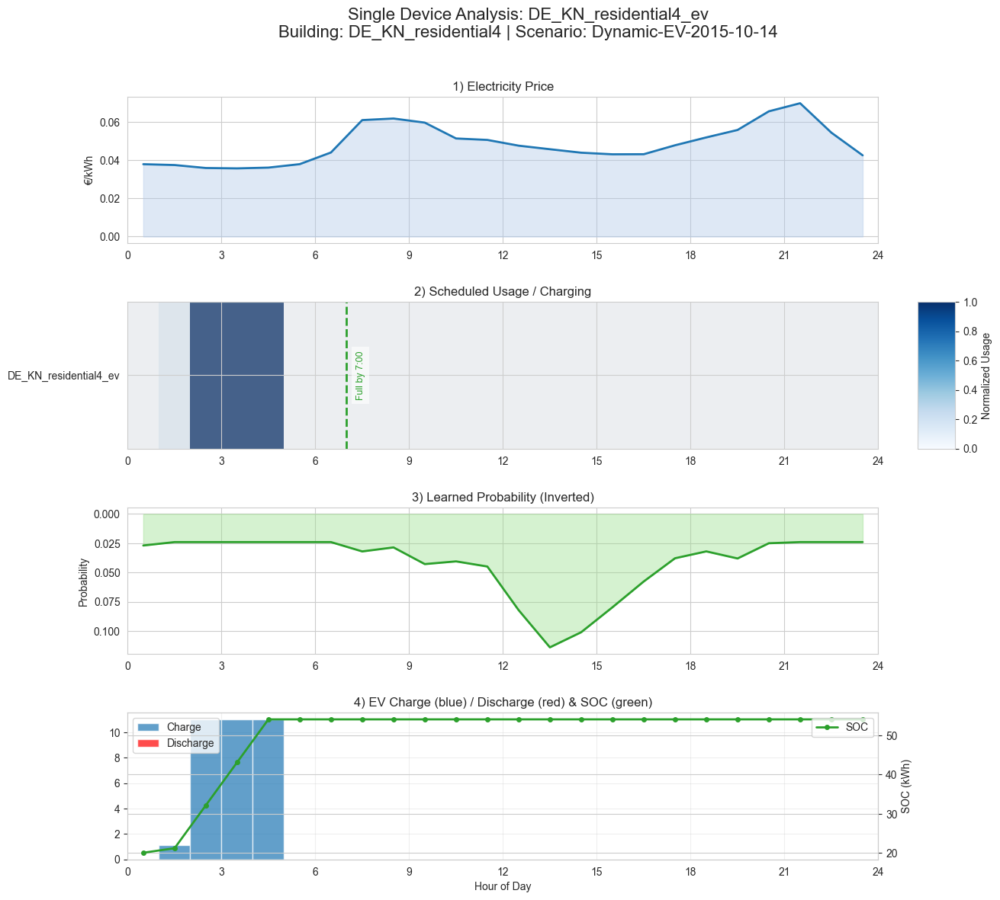

    📈 Total charging: 34.1 kWh
    🔋 SOC at 7:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 2
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-15 (Departure: 9:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


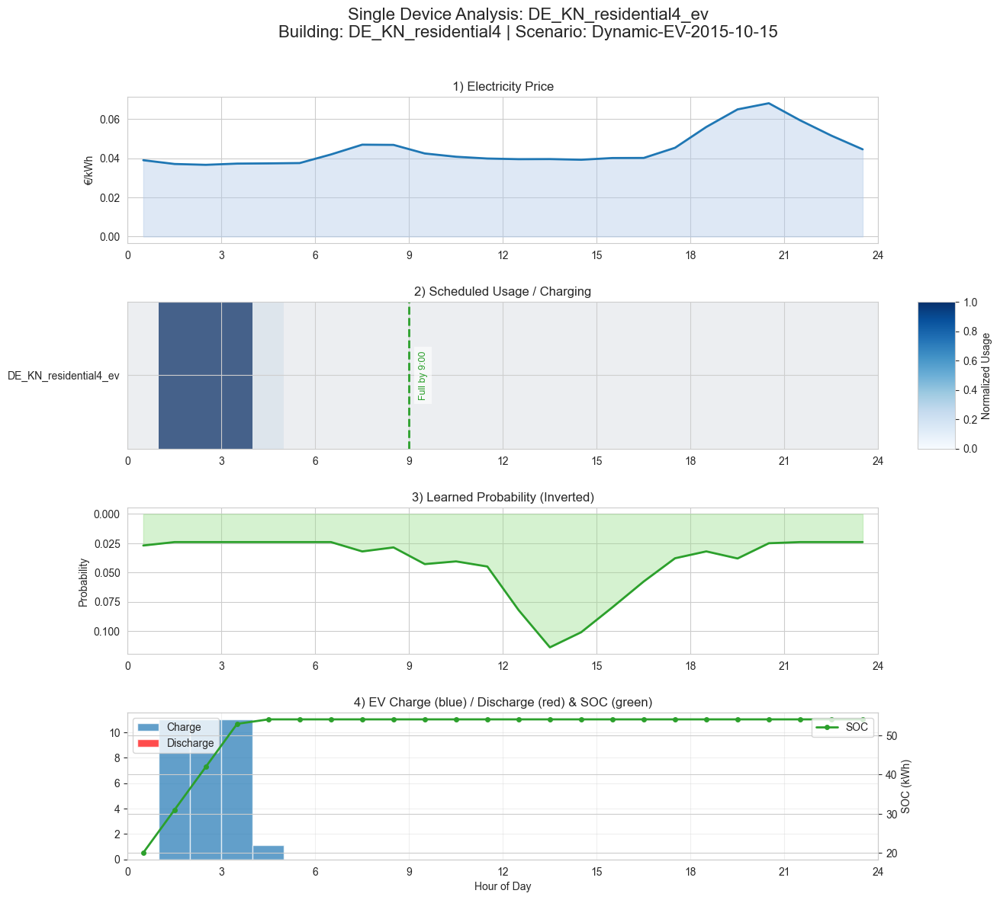

    📈 Total charging: 34.1 kWh
    🔋 SOC at 9:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 1
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-16 (Departure: 11:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


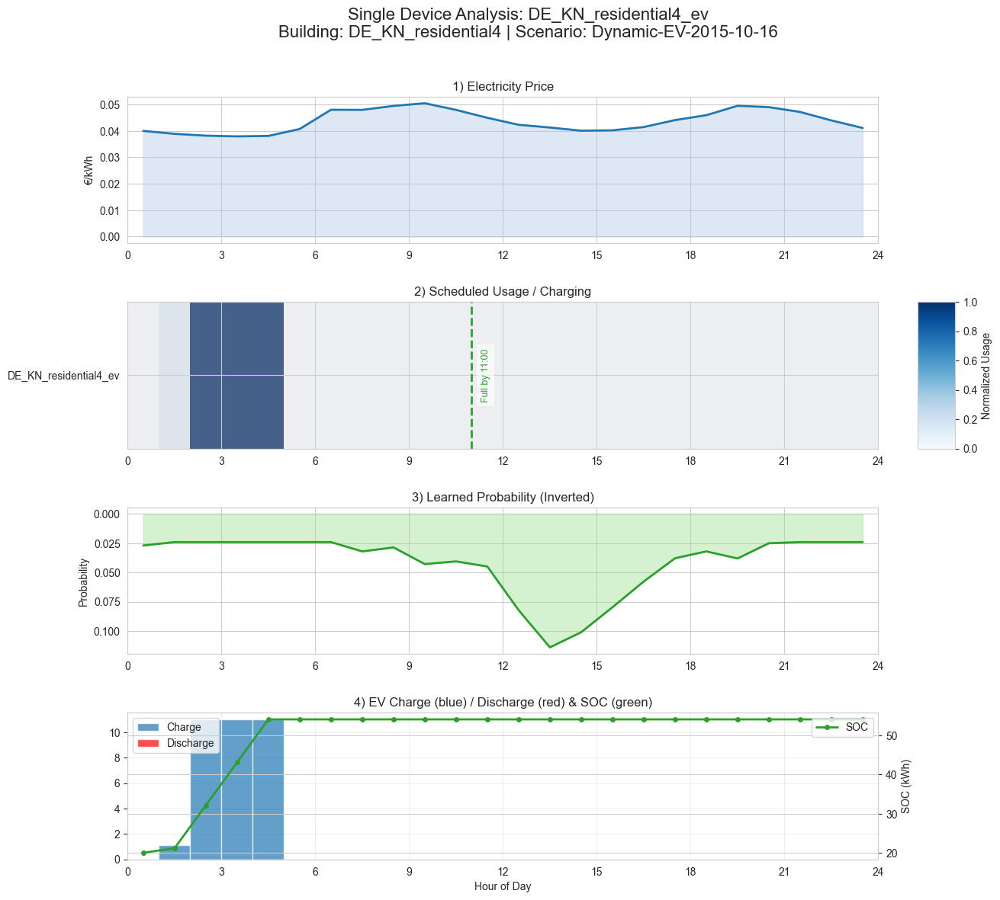

    📈 Total charging: 34.1 kWh
    🔋 SOC at 11:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 2
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-17 (Departure: 12:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


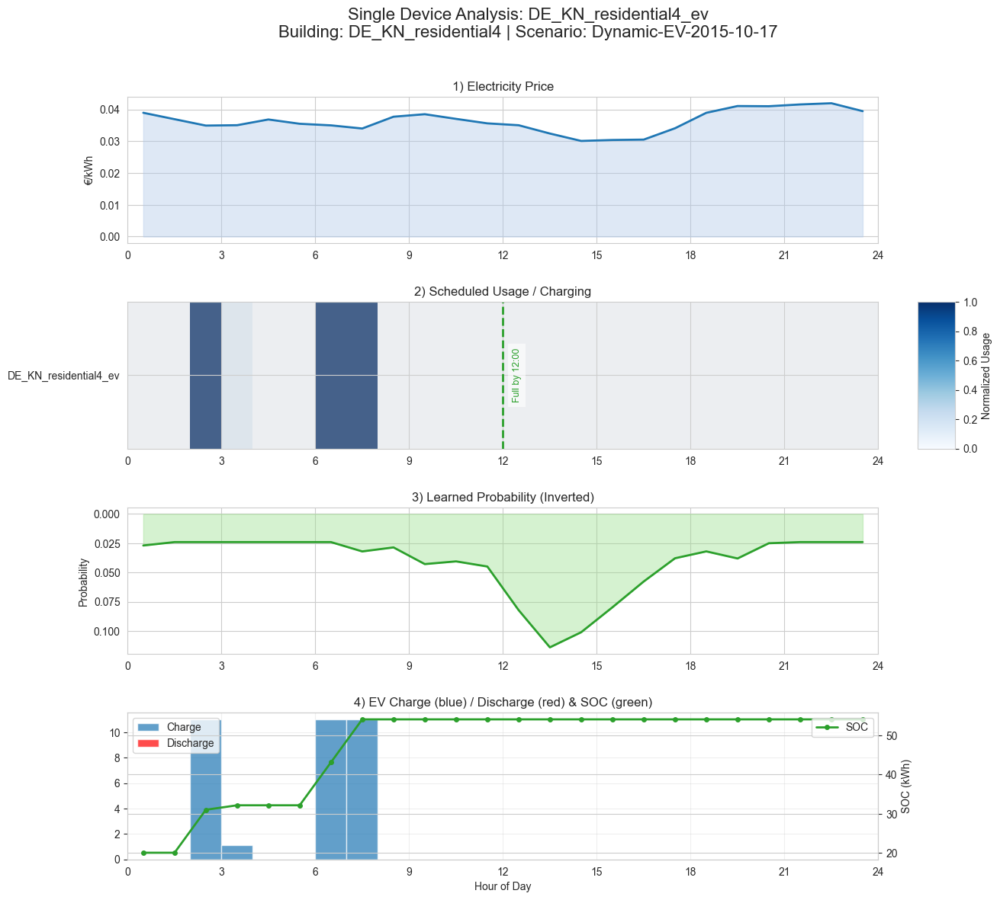

    📈 Total charging: 34.1 kWh
    🔋 SOC at 12:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 2
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-18 (Departure: 6:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


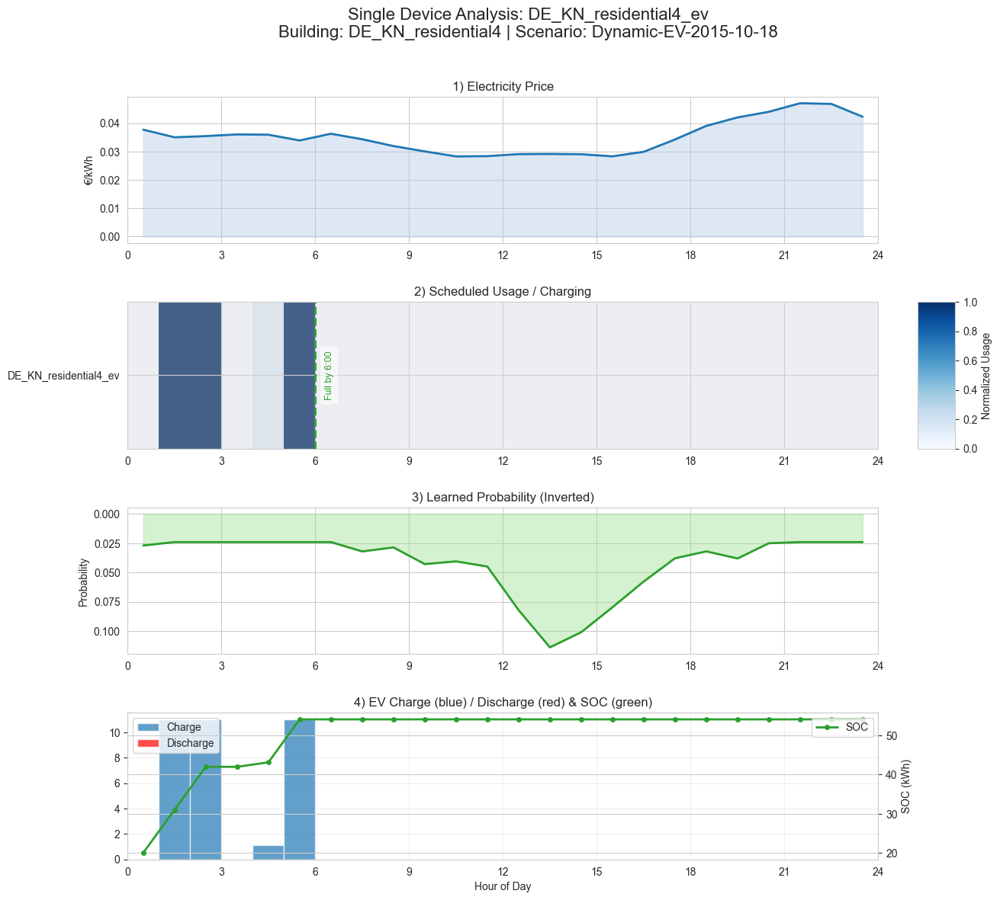

    📈 Total charging: 34.1 kWh
    🔋 SOC at 6:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 1
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-19 (Departure: 10:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


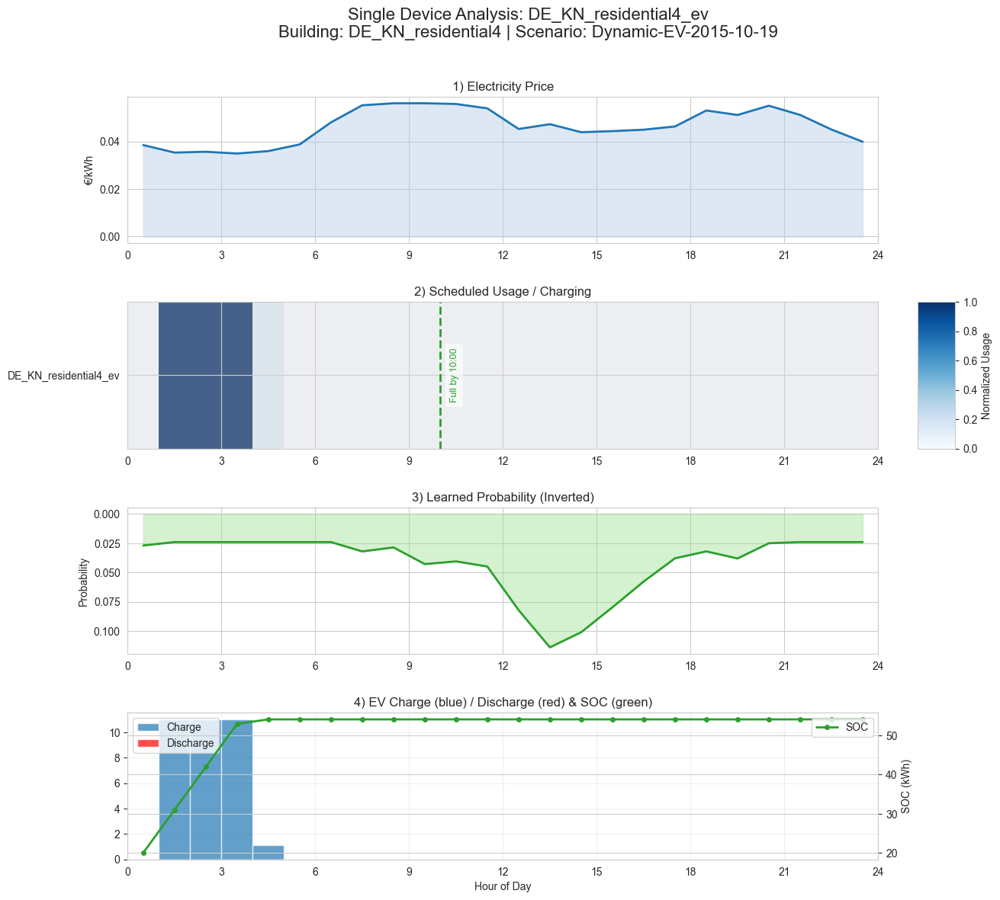

    📈 Total charging: 34.1 kWh
    🔋 SOC at 10:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 1
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-20 (Departure: 7:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


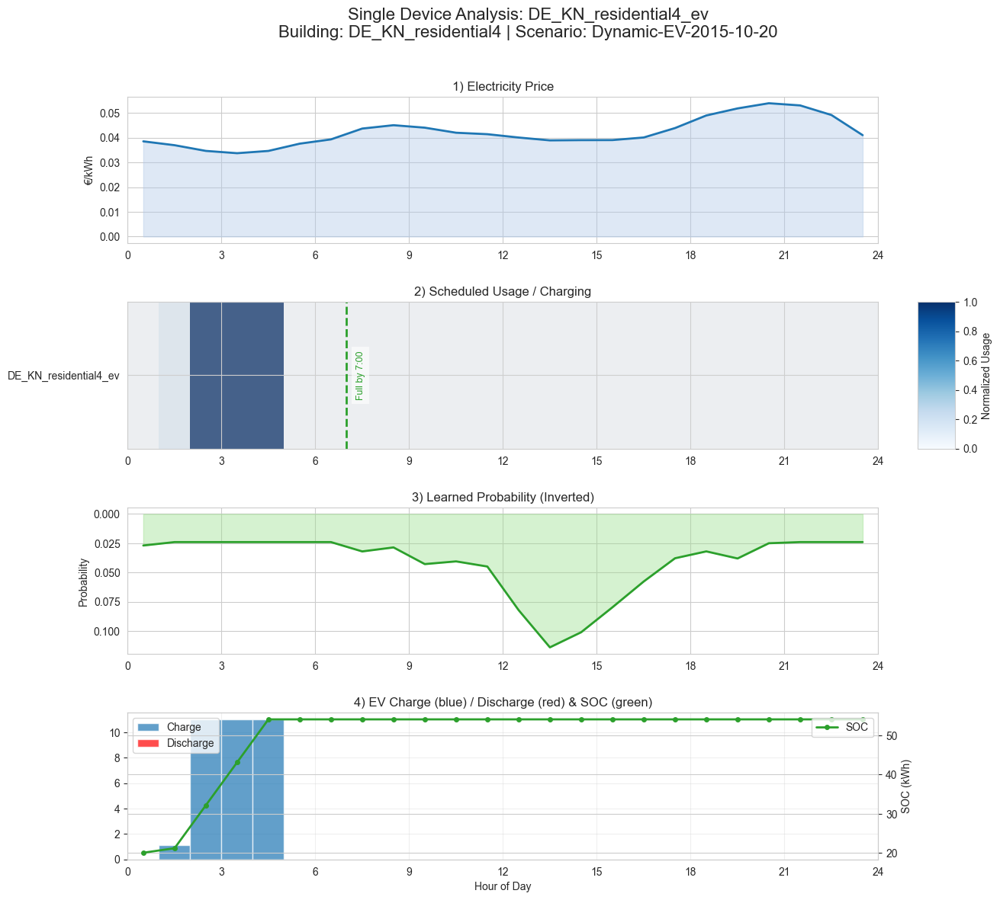

    📈 Total charging: 34.1 kWh
    🔋 SOC at 7:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 2
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-21 (Departure: 18:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


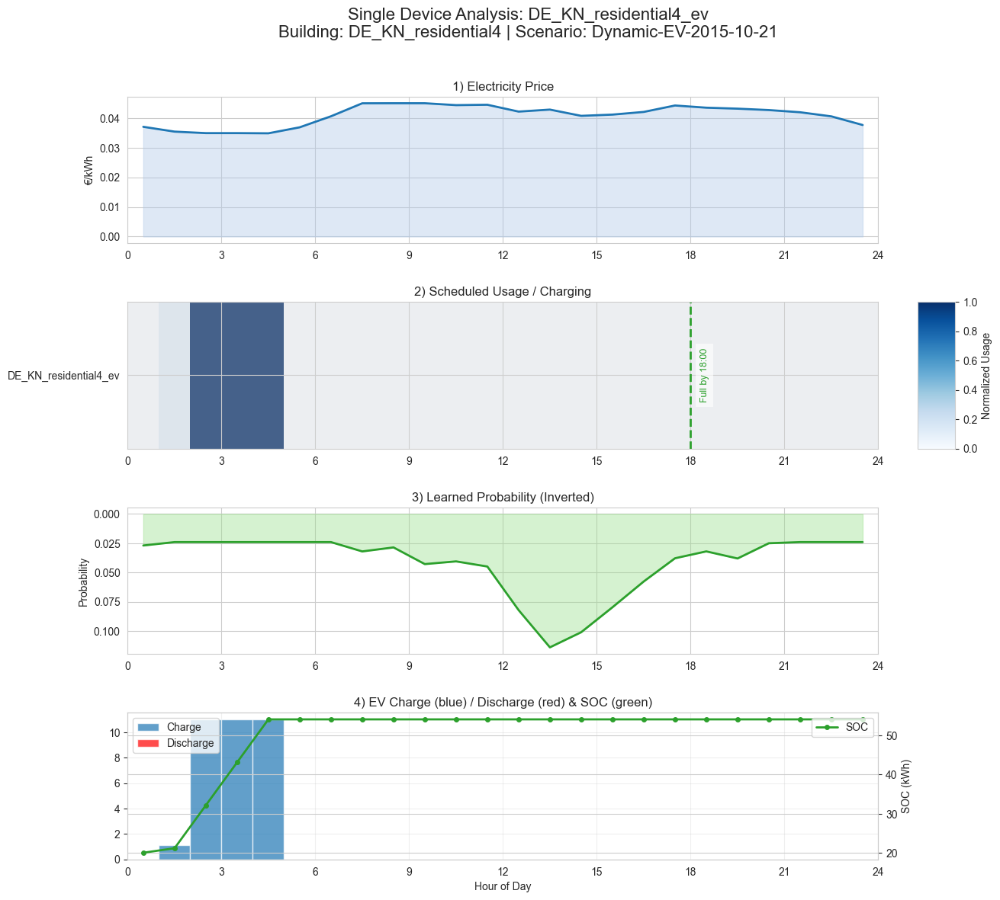

    📈 Total charging: 34.1 kWh
    🔋 SOC at 18:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 2
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-22 (Departure: 19:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


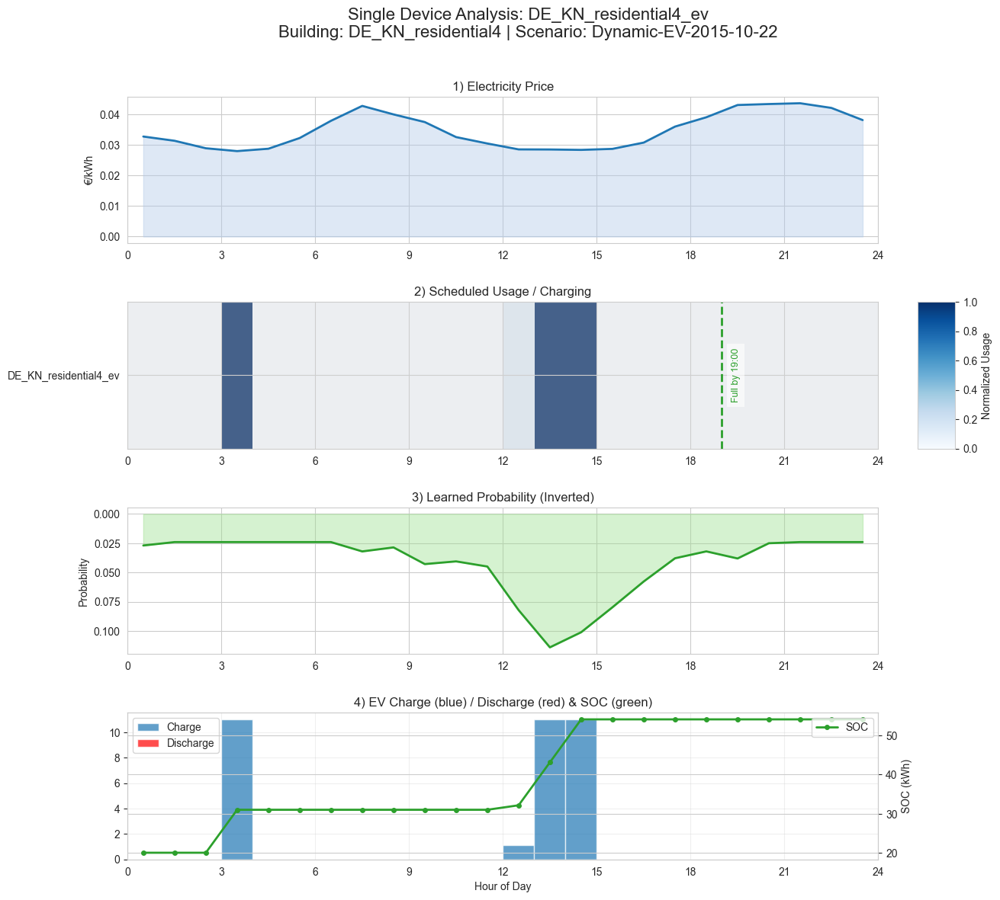

    📈 Total charging: 34.1 kWh
    🔋 SOC at 19:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 3
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-23 (Departure: 13:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


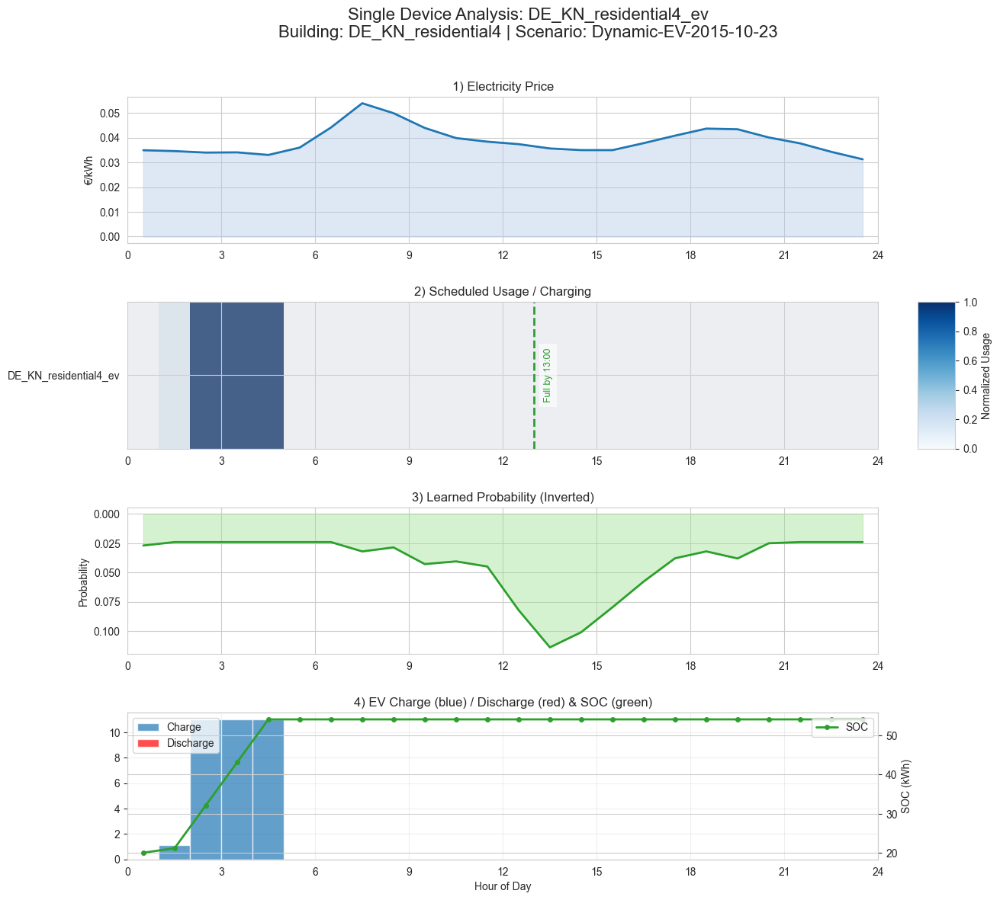

    📈 Total charging: 34.1 kWh
    🔋 SOC at 13:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 2
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-24 (Departure: 15:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


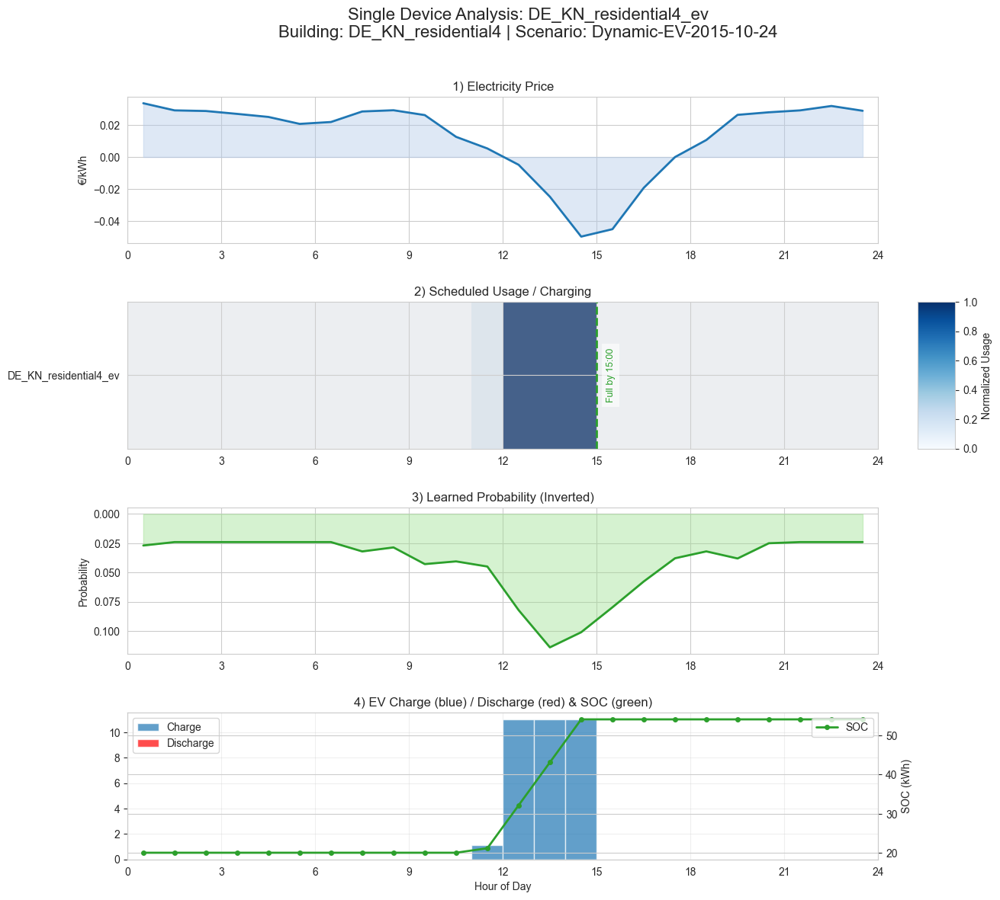

    📈 Total charging: 34.1 kWh
    🔋 SOC at 15:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 12
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-26 (Departure: 8:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


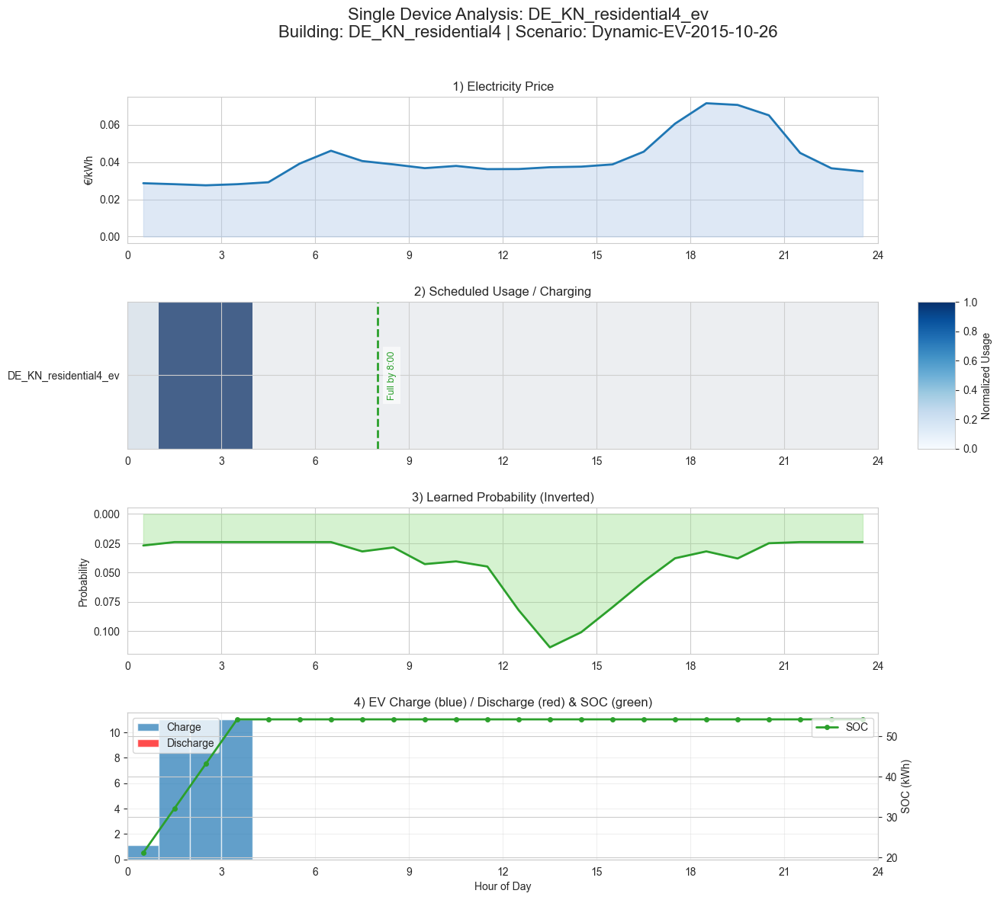

    📈 Total charging: 34.1 kWh
    🔋 SOC at 8:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 1
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-27 (Departure: 6:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


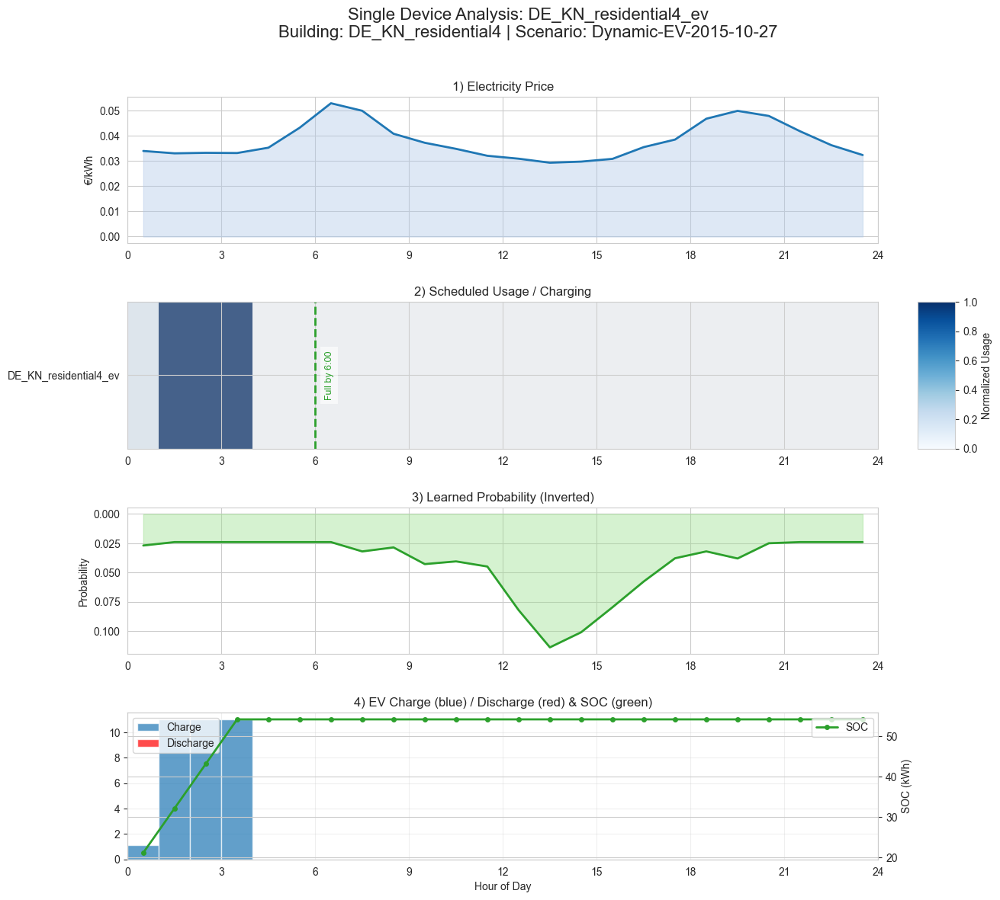

    📈 Total charging: 34.1 kWh
    🔋 SOC at 6:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 1
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-28 (Departure: 14:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


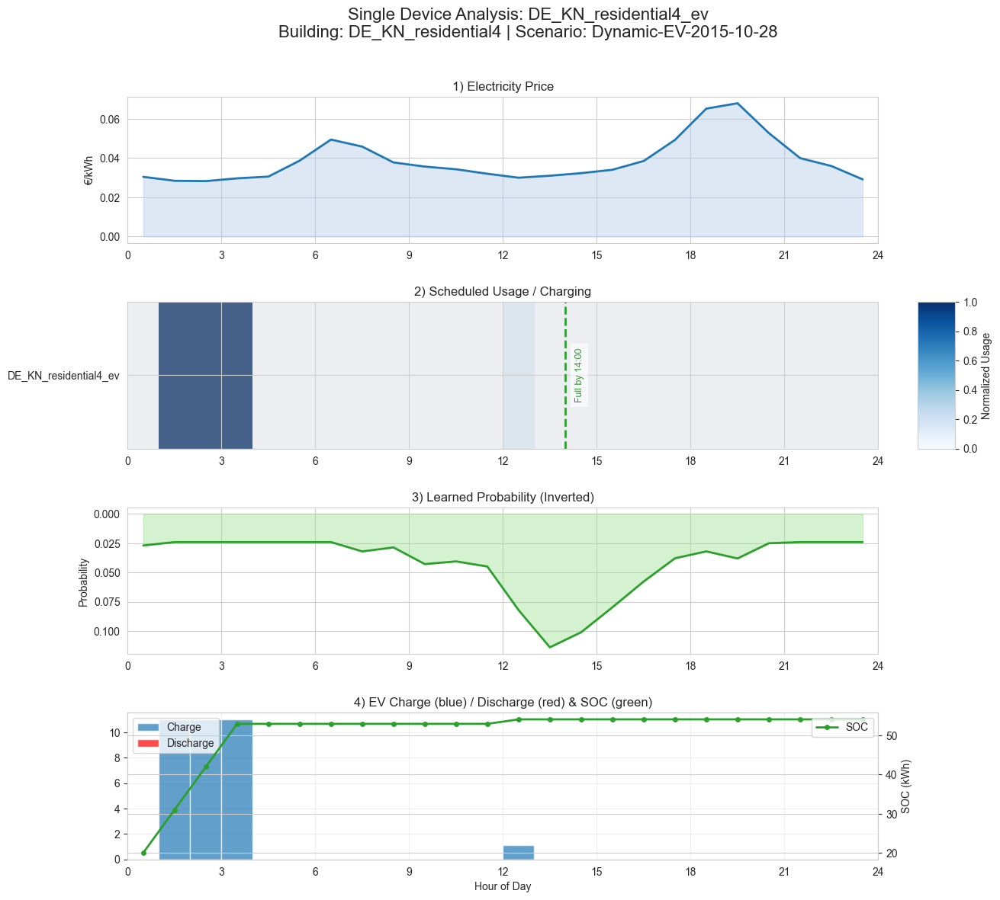

    📈 Total charging: 34.1 kWh
    🔋 SOC at 14:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 1
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-29 (Departure: 7:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


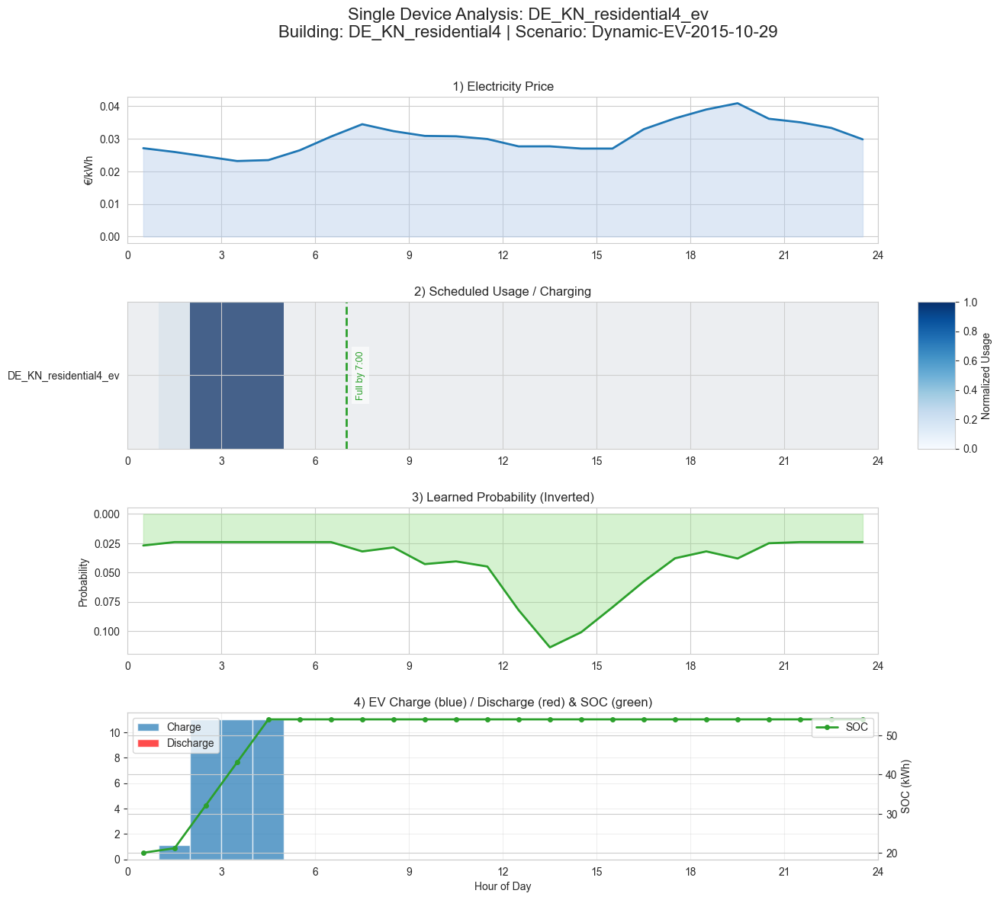

    📈 Total charging: 34.1 kWh
    🔋 SOC at 7:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 2
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-30 (Departure: 20:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


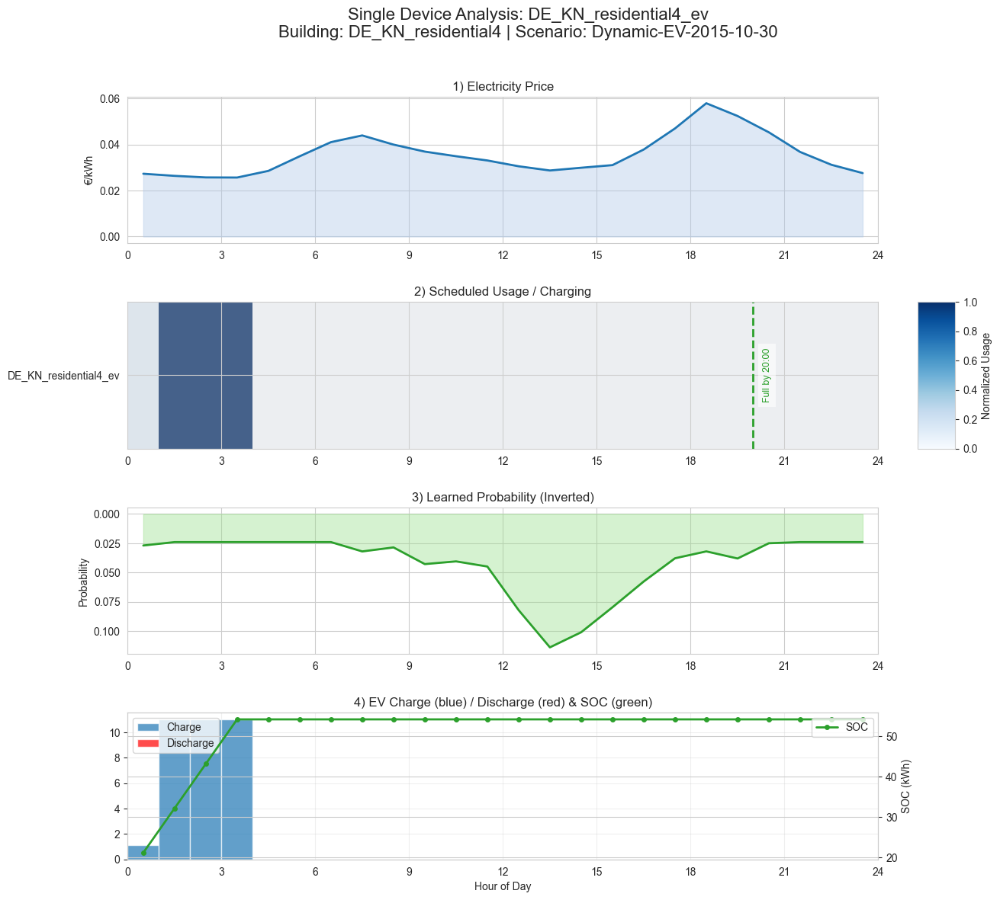

    📈 Total charging: 34.1 kWh
    🔋 SOC at 20:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 1
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-10-31 (Departure: 10:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


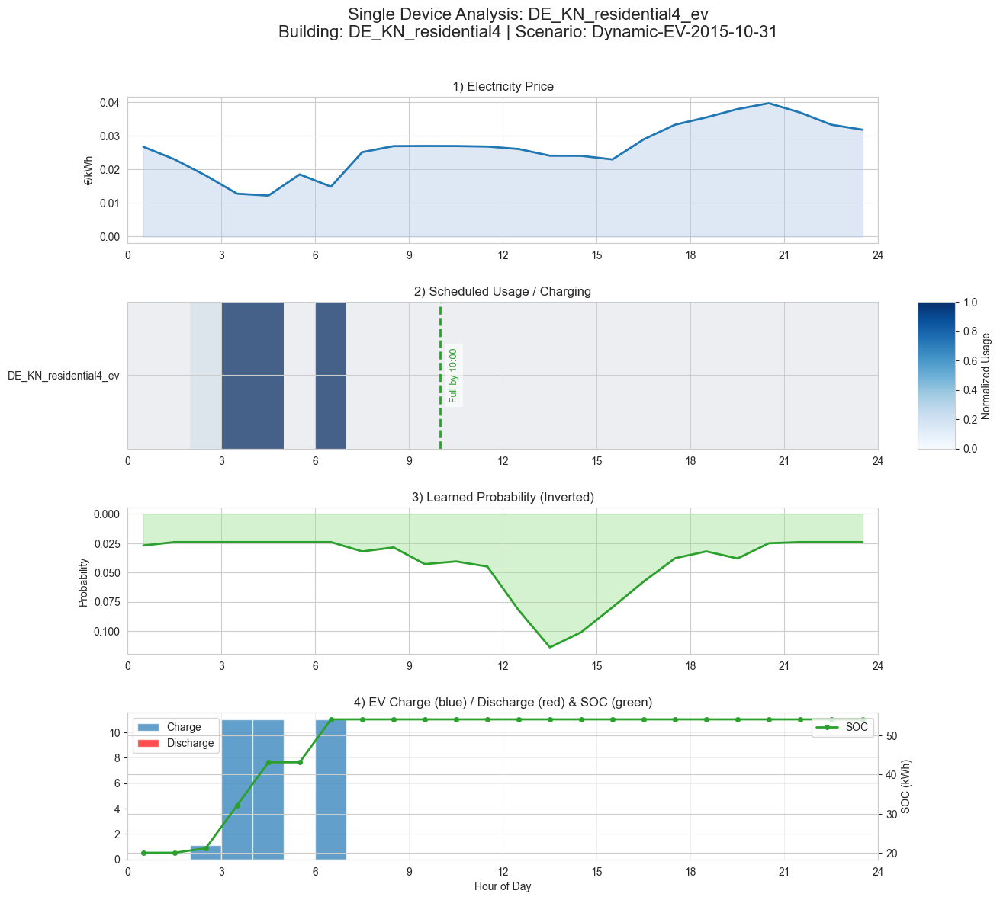

    📈 Total charging: 34.1 kWh
    🔋 SOC at 10:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 3
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-11-01 (Departure: 11:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


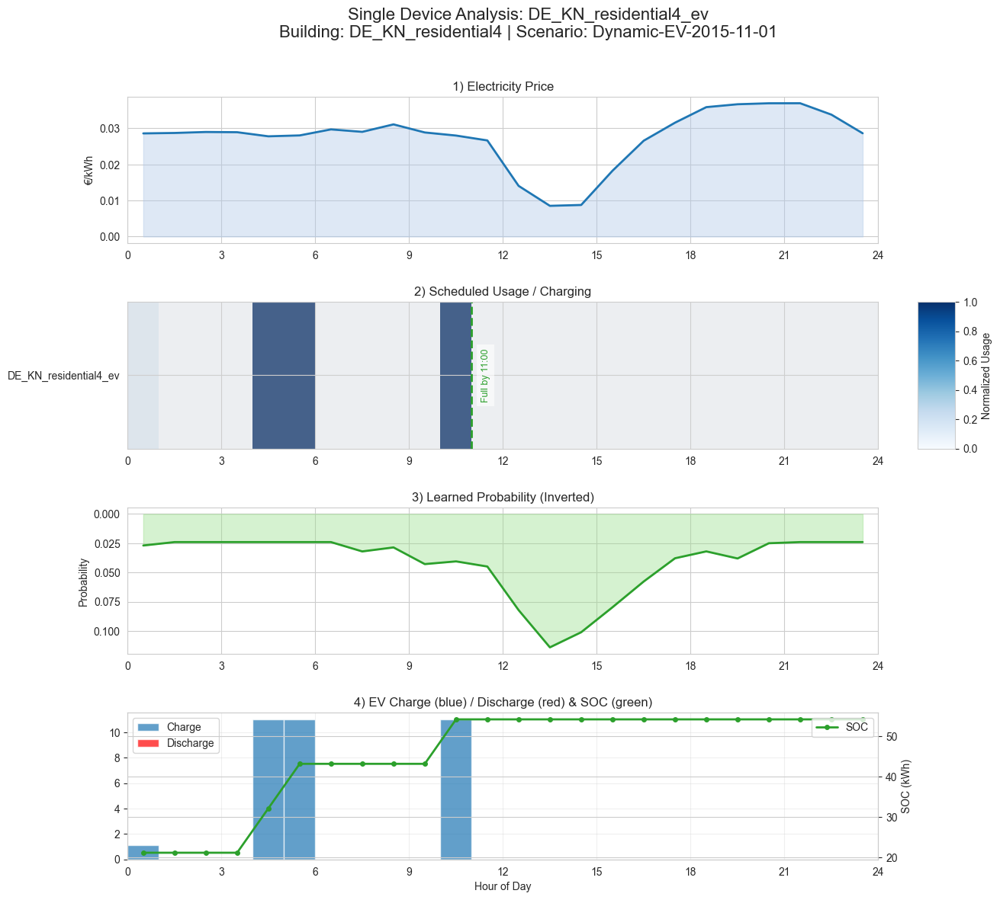

    📈 Total charging: 34.1 kWh
    🔋 SOC at 11:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 4
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-11-02 (Departure: 7:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


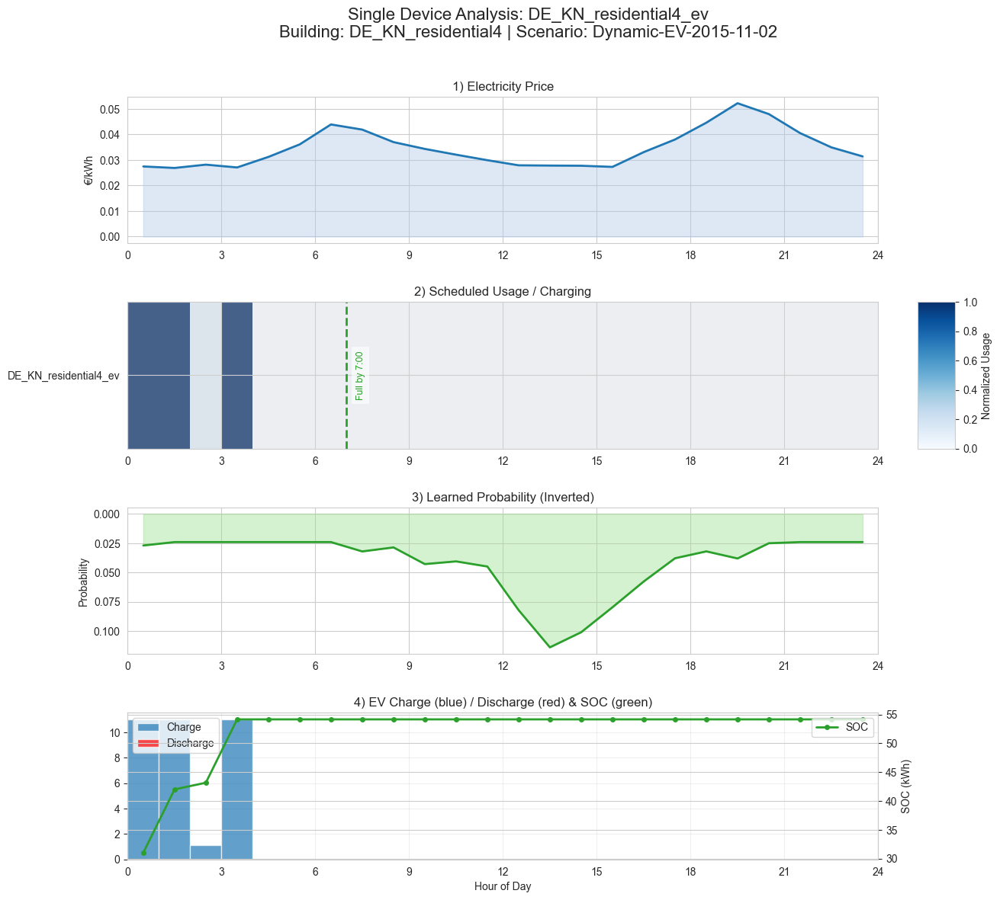

    📈 Total charging: 34.1 kWh
    🔋 SOC at 7:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 0
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-11-03 (Departure: 6:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


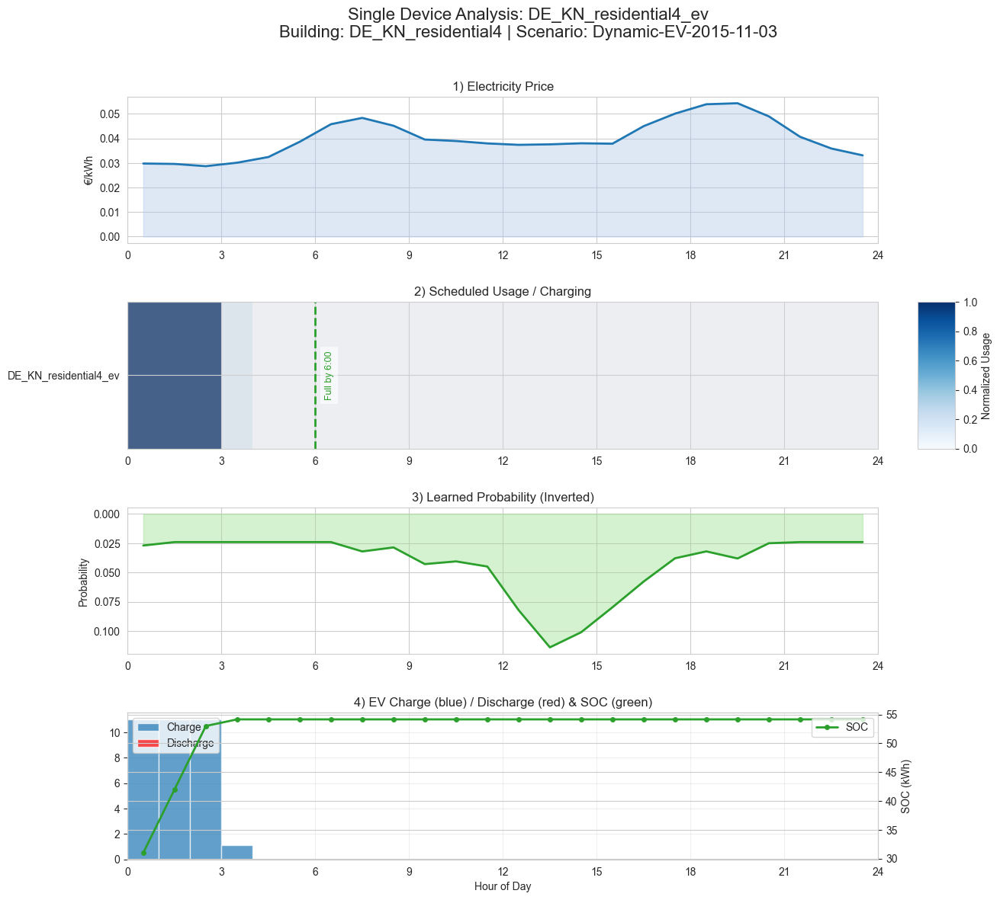

    📈 Total charging: 34.1 kWh
    🔋 SOC at 6:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 0
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-11-04 (Departure: 9:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


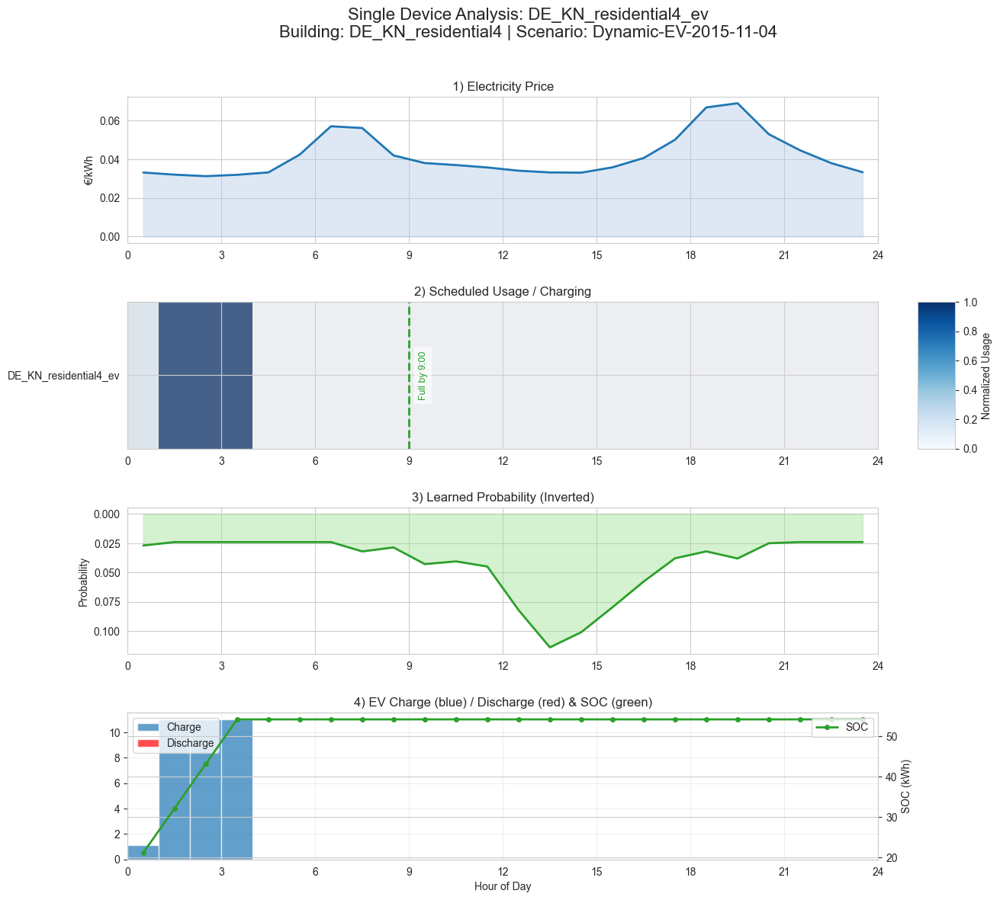

    📈 Total charging: 34.1 kWh
    🔋 SOC at 9:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 1
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-11-05 (Departure: 7:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


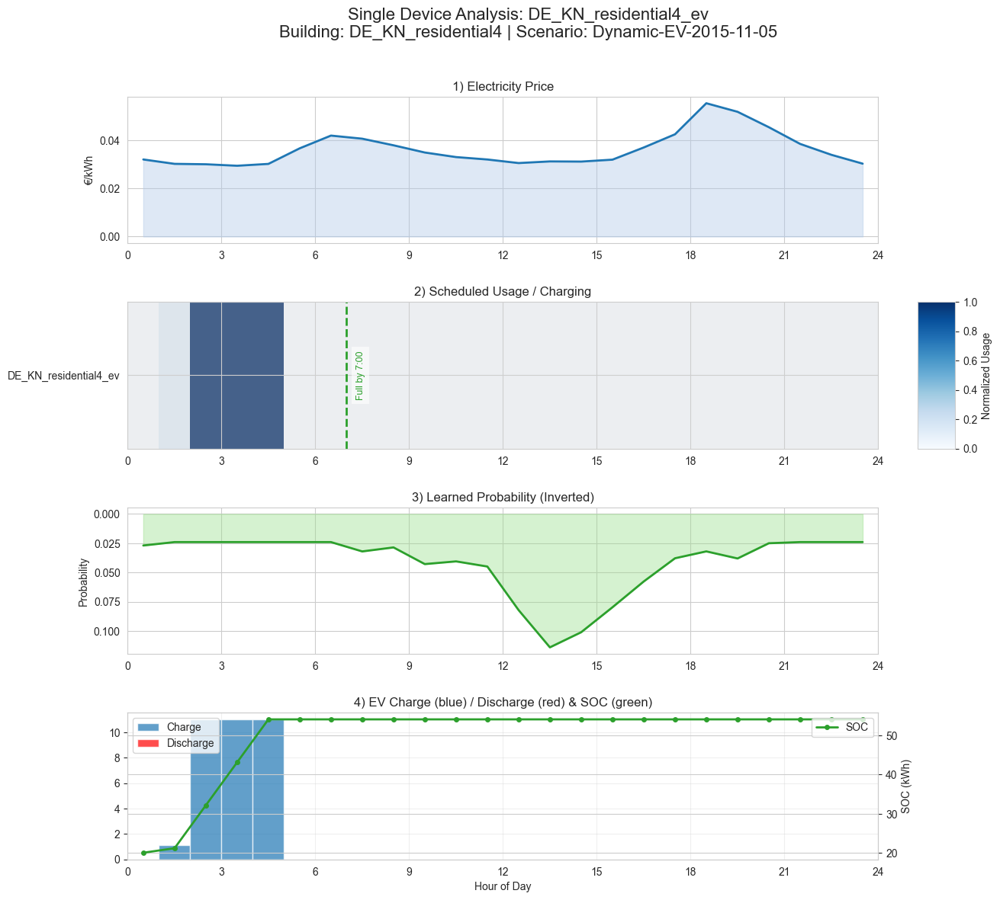

    📈 Total charging: 34.1 kWh
    🔋 SOC at 7:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 2
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-11-06 (Departure: 17:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


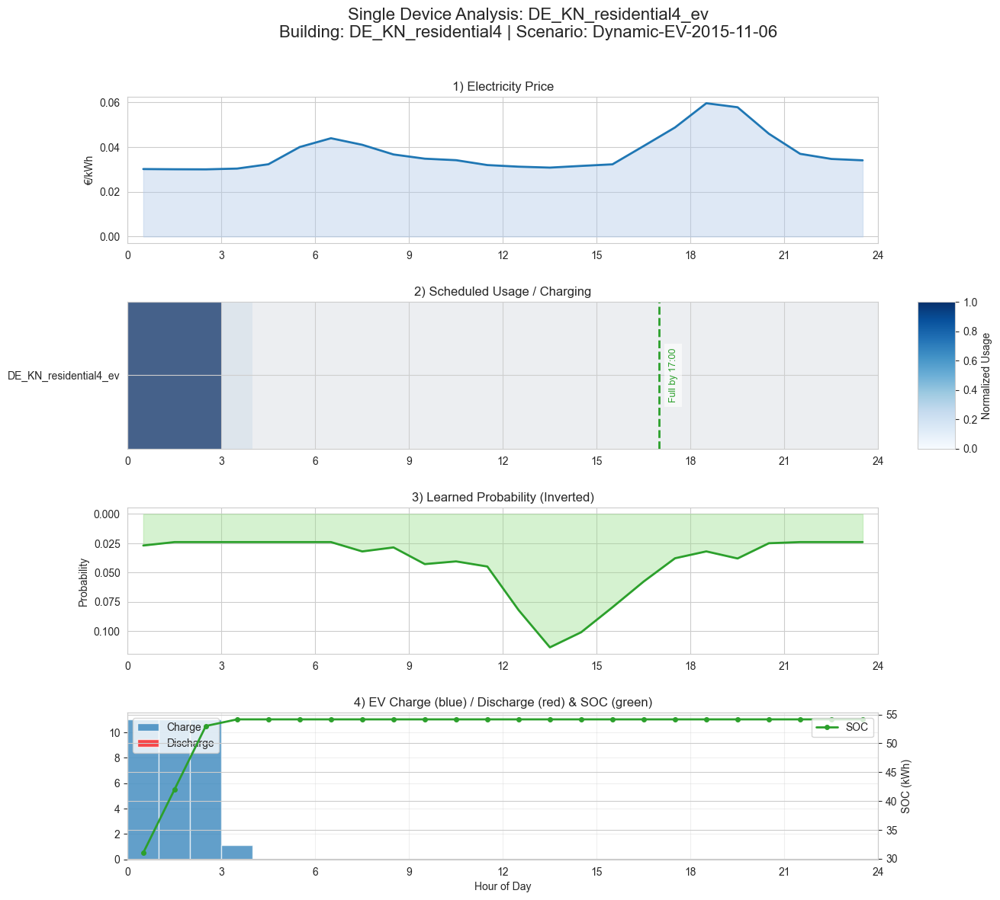

    📈 Total charging: 34.1 kWh
    🔋 SOC at 17:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 0
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-11-07 (Departure: 12:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


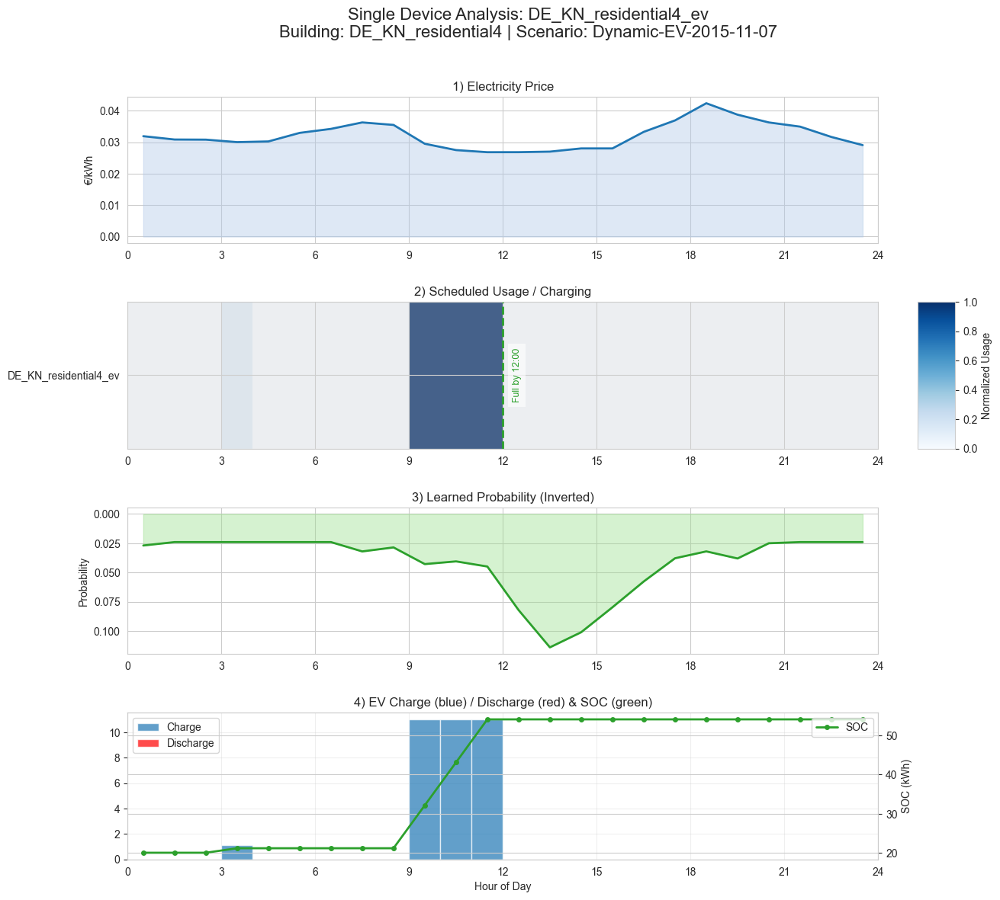

    📈 Total charging: 34.1 kWh
    🔋 SOC at 12:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 9
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-11-08 (Departure: 10:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


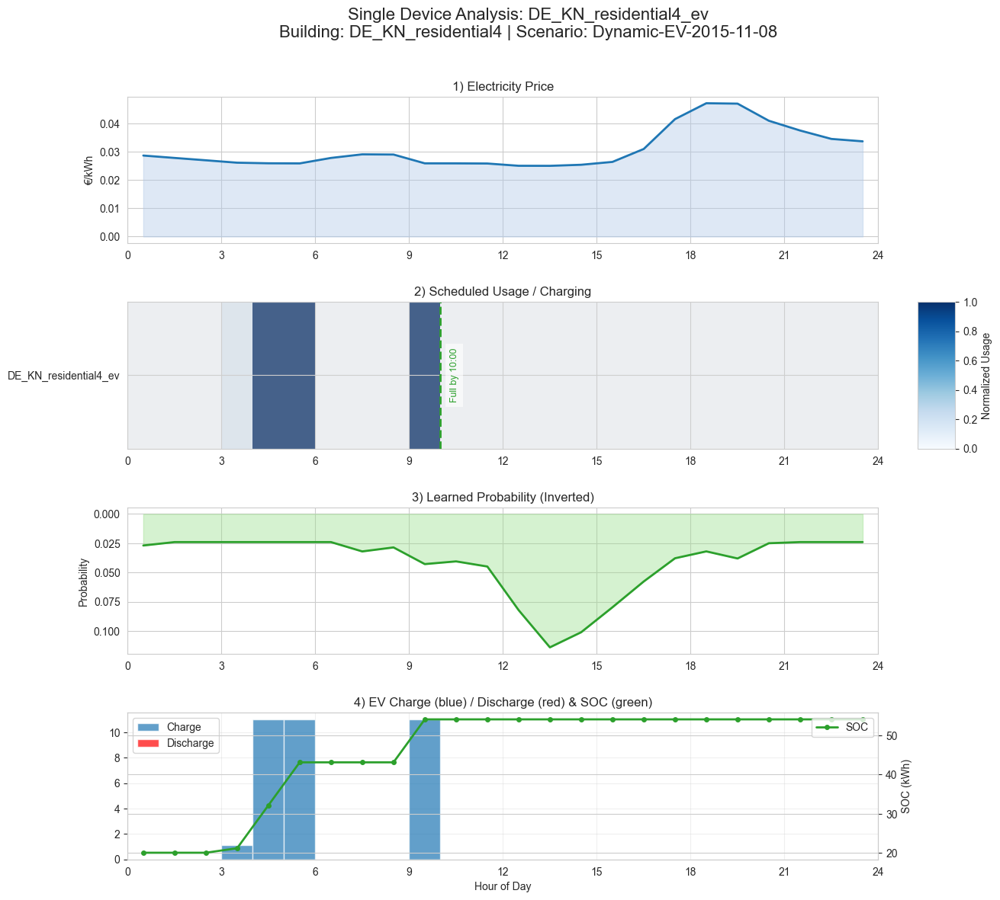

    📈 Total charging: 34.1 kWh
    🔋 SOC at 10:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 4
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-11-09 (Departure: 7:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


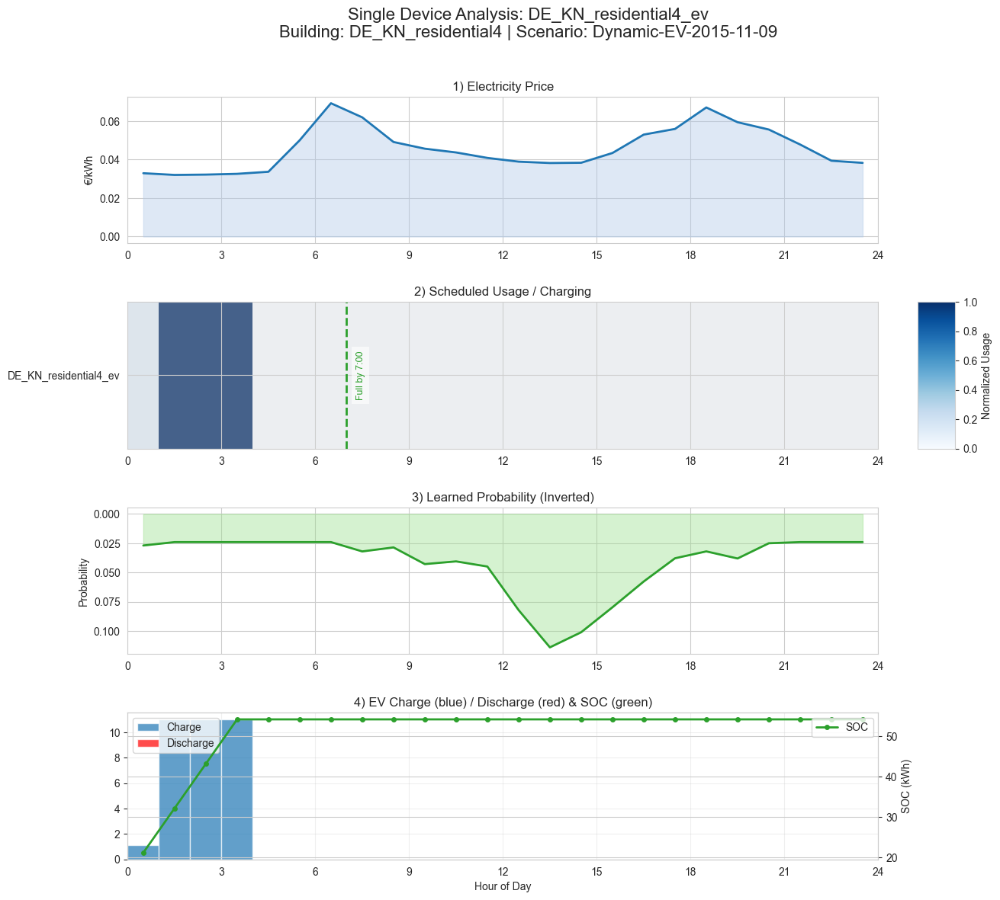

    📈 Total charging: 34.1 kWh
    🔋 SOC at 7:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 1
    ✅ EV requirement MET (≥51.3 kWh)

=== EV Analysis for 2015-11-10 (Departure: 8:00) ===
--- EV Single‐device plot for ev ---


C:\Users\20235149\AppData\Local\Temp\ipykernel_96200\3415293135.py:373: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


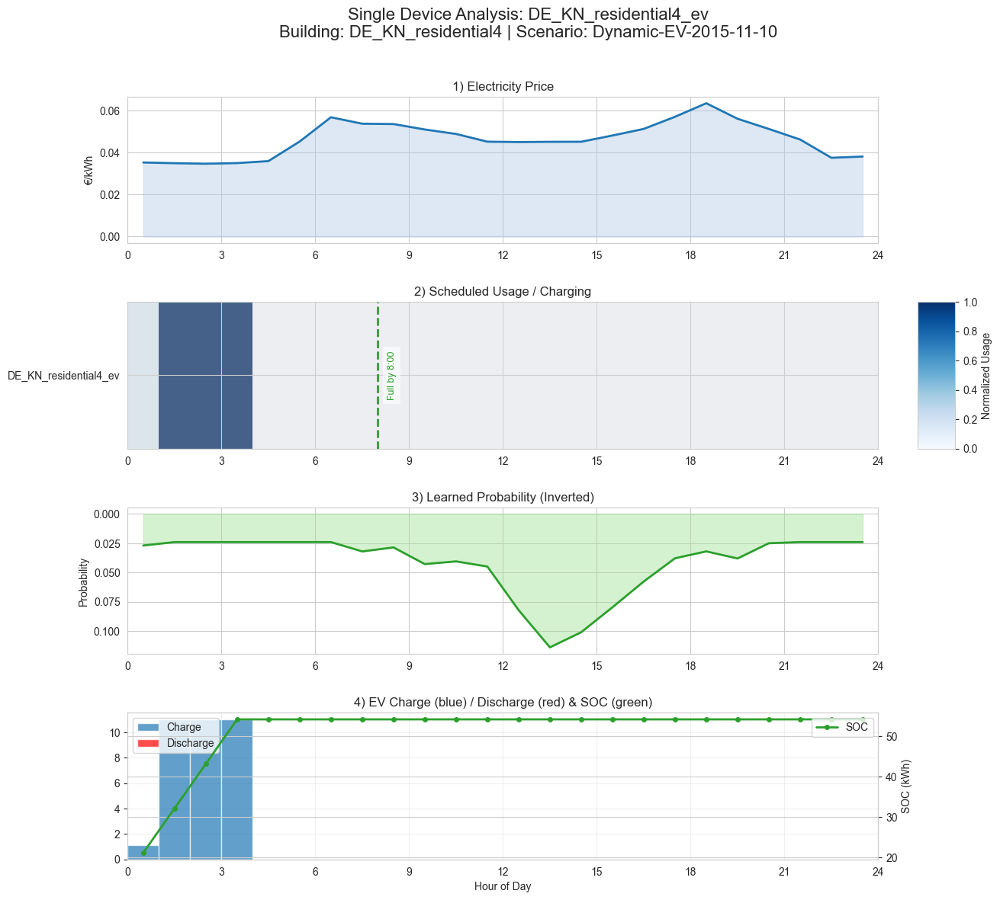

    📈 Total charging: 34.1 kWh
    🔋 SOC at 8:00: 54.1 kWh
    ⚡ Peak charging: 11.0 kW at hour 1
    ✅ EV requirement MET (≥51.3 kWh)

✅ Pipeline C EV visualization completed for 30 days
📁 EV plots saved to: results/plots/pipeline_c/

--- Pipeline C: Summary Report ---

📊 EV Performance Summary (30 days):
  • Average charging: 34.1 kWh/day
  • Average departure SOC: 54.2 kWh
  • Success rate: 100.0% of days
  • Average cost: €0.99/day

📈 Performance by Departure Hour:
  • 6:00 departure: 34.15 kWh, 54.15 kWh SOC, 100% success, €1.11
  • 7:00 departure: 34.15 kWh, 54.15 kWh SOC, 100% success, €1.02
  • 8:00 departure: 34.15 kWh, 54.15 kWh SOC, 100% success, €1.15
  • 9:00 departure: 34.15 kWh, 54.15 kWh SOC, 100% success, €1.17
  • 10:00 departure: 34.15 kWh, 54.15 kWh SOC, 100% success, €0.85
  • 11:00 departure: 34.15 kWh, 54.15 kWh SOC, 100% success, €1.13
  • 12:00 departure: 34.15 kWh, 54.15 kWh SOC, 100% success, €1.07
  • 13:00 departure: 34.15 kWh, 54.15 kWh SOC, 100% success, 

In [10]:
# ─────────────────────────────────────────────────────────────────────────────
# Pipeline C: Dynamic EV Departure Testing Pipeline
# Extends Phase 2 with variable "full by" hours and EV-focused visualization
# ─────────────────────────────────────────────────────────────────────────────

import numpy as np
import pandas as pd
from datetime import datetime, date

print("🚗 Pipeline C: Dynamic EV Departure Testing...")
print("\n--- Pipeline C: EV Departure Schedule Definition ---")

# ─────────────────────────────────────────────────────────────────────────────
# Section: Dynamic EV "Full By" Schedule for Testing
# ─────────────────────────────────────────────────────────────────────────────

# Define different departure patterns for testing
ev_departure_schedule = {
    # Early commute days (typical workday)
    '2015-10-11': 7,   # Monday - early commute
    '2015-10-12': 6,   # Tuesday - very early commute  
    '2015-10-13': 8,   # Wednesday - slightly later
    '2015-10-14': 7,   # Thursday - early commute
    '2015-10-15': 9,   # Friday - relaxed start
    
    # Weekend/flexible days
    '2015-10-16': 11,  # Saturday - weekend leisure
    '2015-10-17': 12,  # Sunday - late weekend start
    
    # Variable work schedule
    '2015-10-18': 6,   # Monday - very early meeting
    '2015-10-19': 10,  # Tuesday - late start
    '2015-10-20': 7,   # Wednesday - normal
    
    # Evening departure (work from home)
    '2015-10-21': 18,  # Thursday - evening appointment
    '2015-10-22': 19,  # Friday - evening social
    
    # Different patterns for testing
    '2015-10-23': 13,  # Saturday - midday departure
    '2015-10-24': 15,  # Sunday - afternoon trip
    '2015-10-26': 8,   # Monday - back to normal
    '2015-10-27': 6,   # Tuesday - early again
    '2015-10-28': 14,  # Wednesday - afternoon meeting
    '2015-10-29': 7,   # Thursday - normal
    '2015-10-30': 20,  # Friday - evening event
    '2015-10-31': 10,  # Saturday - Halloween late start
    '2015-11-01': 11,  # Sunday - daylight saving
    '2015-11-02': 7,   # Monday - back to work
    '2015-11-03': 6,   # Tuesday - early flight
    '2015-11-04': 9,   # Wednesday - late start
    '2015-11-05': 7,   # Thursday - normal
    '2015-11-06': 17,  # Friday - early weekend start
    '2015-11-07': 12,  # Saturday - weekend
    '2015-11-08': 10,  # Sunday - normal weekend
    '2015-11-09': 7,   # Monday - work
    '2015-11-10': 8,   # Tuesday - slightly late
}

# Fallback to 7 AM if day not specified
def get_ev_departure_hour(day_str):
    return ev_departure_schedule.get(day_str, 7)

print("🚗 EV Departure Schedule defined for testing:")
for day in selected_days[:10]:  # Show first 10 days
    hour = get_ev_departure_hour(str(day))
    print(f"  {day}: Must be full by {hour}:00")

print("\n--- Pipeline C: Phase 2 with Dynamic EV Departures ---")
pipeline_c_results = {}

for day in selected_days:      # **all** days from original selection
    print(f"\nProcessing day {day} with dynamic EV schedule…")

    # (1) Load day data and ensure a 'day' column for cost‐eval
    query = f"""
      SELECT * FROM {view_name}
      WHERE DATE(utc_timestamp) = '{day}'
      ORDER BY utc_timestamp
    """
    df_day = con.execute(query).df()
    if df_day.empty:
        print(f"⚠ No data for {day}, skipping")
        continue

    # reset index, add 'day' and extract 'hour' once for price + diagnostics
    df_day = df_day.reset_index(drop=True).copy()
    df_day['day'] = day
    df_day['hour'] = df_day['utc_timestamp'].dt.hour

    # (2) Extract full‐day price curve (€/kWh) once
    if 'price_per_kwh' in df_day.columns:
        price_series = (
            df_day.groupby('hour')['price_per_kwh']
            .mean()
            .reindex(range(24), fill_value=df_day['price_per_kwh'].mean())
        )
    else:
        price_series = pd.Series([0.25]*24, index=range(24))
    print("  ✓ Extracted price series for plotting & optimization")

    # Get day-specific departure time
    departure_hour = get_ev_departure_hour(str(day))
    print(f"  🚗 EV departure time for {day}: {departure_hour}:00")

    # (3) Build GlobalConnectionLayer and device agents
    global_layer   = GlobalConnectionLayer(max_building_load=50.0, total_hours=24)
    devices        = []
    ev_agent_local = None

    # (3.a) Identify ALL device columns (no test slicing)
    dev_cols = [
        c for c in df_day.columns
        if building_id in c
        and 'grid' not in c.lower()
        and 'pv'   not in c.lower()
    ]

    for col in dev_cols:
        short = col.replace(f"{building_id}_", "")
        spec  = device_specs.get(short, {
            'category': 'Partially Flexible',
            'power_rating': 2.0,
            'flexibility_model': 'continuous'
        })

        # — EVAgent for the EV column (UPDATED with dynamic departure)
        # In the device creation loop, update the EV agent creation:
        if short.lower() in ('ev', 'electric_vehicle'):
            # Update EV spec with dynamic departure and ensure max charge rate
            ev_spec = {
                **spec,  # Start with device specs
                'must_be_full_by_hour': departure_hour,
                'max_charge_rate': EV_PARAMS['max_charge_rate'],
                'power_rating': EV_PARAMS['max_charge_rate'],
                'capacity': EV_PARAMS['capacity'],
                'soc_max': EV_PARAMS['soc_max'],
                'soc_min': EV_PARAMS['soc_min'],
                'initial_soc': EV_PARAMS['initial_soc'],
                'efficiency_charge': EV_PARAMS['efficiency_charge'],
                'efficiency_discharge': EV_PARAMS['efficiency_discharge'],
                'max_discharge_rate': EV_PARAMS['max_discharge_rate'],
                'max_charge_rate': EV_PARAMS['max_charge_rate'],
                'must_be_full_by_hour': departure_hour,
            }

            ev = EVAgent(
                data=df_day,
                device_name=col,
                category=ev_spec['category'],
                power_rating=float(ev_spec['power_rating']),
                global_layer=global_layer,
                pv_agent=pv_agent,  # Only if needed for PV coordination
                spec=ev_spec,
                must_be_full_by_hour=departure_hour,
                max_charge_rate=float(EV_PARAMS['max_charge_rate']),
                initial_soc=float(EV_PARAMS.get('initial_soc', EV_PARAMS['soc_max'])),
                soc_min=float(EV_PARAMS['soc_min']),
                soc_max=float(EV_PARAMS['soc_max']),
                capacity=float(EV_PARAMS['capacity']),
                efficiency_charge=float(EV_PARAMS['efficiency_charge']),
                efficiency_discharge=float(EV_PARAMS['efficiency_discharge']),
                max_discharge_rate=0.0  # Prevent discharging
            )
            
            # Initialize SOC tracking
            ev.hourly_soc = [ev.initial_soc] * 24
            ev.hourly_charge = [0] * 24
            
            # Store in learning results if needed
            ev.hour_probability = learning_results.get(col, {}) \
                                        .get('probabilities', {h:1/24 for h in range(24)})
            ev.original_consumption = df_day[col].values[:24].tolist()
            
            # Add to devices list and store reference
            devices.append(ev)
            ev_agent_local = ev
            print(f"  ✓ EVAgent created for '{short}' - must be full by {departure_hour}:00")
            print(f"  ⚡ EV Parameters: {ev_spec}")

        # — FlexibleDevice for all other loads
        else:
            fd = FlexibleDevice(
                data=df_day,
                device_name=col,
                category=spec['category'],
                power_rating=spec['power_rating'],
                global_layer=global_layer,
                battery_agent=battery_agent,
                pv_agent=pv_agent,
                spec=spec
            )
            fd.hour_probability = learning_results.get(col, {}) \
                                     .get('probabilities', {h:1/24 for h in range(24)})
            fd.original_consumption = df_day[col].values[:24].tolist()
            devices.append(fd)
            print(f"  ✓ FlexibleDevice created for '{short}'")

    # (4) Initialize GlobalOptimizer once
    optimizer = GlobalOptimizer(
        devices=devices,
        global_layer=global_layer,
        pv_agent=pv_agent,
        weather_agent=weather_agent,
        battery_agent=battery_agent,
        ev_agent=ev_agent_local,
        grid_agent=grid_agent,
        max_iterations=1,
        online_iterations=1
    )
    print("  ✓ GlobalOptimizer initialized with all devices")

    # (5) Run phases-centralized optimization
    try:
        ok = optimizer.optimize_phases_centralized(
            devices,
            global_layer,
            pv_agent,
            battery_agent,
            ev_agent_local,
            grid_agent,
            weather_agent
        )
        print(f"  ✓ optimize_phases_centralized() → {ok}")
    except Exception as e:
        print(f"  ⚠ optimize_phases_centralized failed: {e}")
        ok = optimizer.optimize_centralized()
        print(f"  ✓ fallback optimize_centralized() → {ok}")

    # (6) Extract battery schedule and SOC history
    charge   = getattr(battery_agent, 'hourly_charge',    [0]*24)
    discharge= getattr(battery_agent, 'hourly_discharge', [0]*24)
    batt_sched = [charge[h] - discharge[h] for h in range(24)]
    soc_hist   = getattr(battery_agent, 'hourly_soc', [battery_agent.initial_soc]*24)[:24]
    print("  ✓ Extracted battery schedule & SOC history")

    # (7) EV-specific metrics and validation
    if ev_agent_local:
        departure_soc = ev_agent_local.hourly_soc[departure_hour] if len(ev_agent_local.hourly_soc) > departure_hour else 0
        max_soc = getattr(ev_agent_local, 'soc_max', 54.0)
        departure_percentage = (departure_soc / max_soc) * 100 if max_soc > 0 else 0
        
        print(f"  📊 EV Metrics:")
        print(f"    • Departure time: {departure_hour}:00")
        print(f"    • SOC at departure: {departure_soc:.1f} kWh ({departure_percentage:.1f}%)")
        print(f"    • Total charging: {sum(ev_agent_local.hourly_charge):.1f} kWh")
        print(f"    • Peak charging hour: {np.argmax(ev_agent_local.hourly_charge)}")

    # (8) Gather each device's phases schedule
    device_schedules = {}
    for d in devices:
        short = d.device_name.replace(f"{building_id}_", "")
        sched = getattr(d, 'phases_optimized_schedule', None)
        if isinstance(sched, (list, np.ndarray)) and len(sched) == 24:
            device_schedules[short] = list(sched)

    # (9) Store results for downstream plotting
    pipeline_c_results[day] = {
        'learning_results': learning_results,
        'departure_hour': departure_hour,
        'phases_result': {
            'success': ok,
            'battery_schedule': batt_sched,
            'device_schedules': device_schedules,
            'price_series': price_series
        },
        'battery_schedule': batt_sched,
        'soc_history': soc_hist,
        'devices': devices,
        'optimizer': optimizer,
        'ev_agent': ev_agent_local
    }
    print(f"  ✓ Pipeline C completed for {day}")

print(f"\n✅ Pipeline C Phase 2 finished for {len(pipeline_c_results)} day(s)")

# ─────────────────────────────────────────────────────────────────────────────
# Section: EV-Focused Visualization for Pipeline C
# ─────────────────────────────────────────────────────────────────────────────

print("\n--- Pipeline C: EV-Only Visualization ---")

# Create results directory
import os
os.makedirs("results/plots/pipeline_c", exist_ok=True)

# Plot only EV devices for each day
for day, results in pipeline_c_results.items():
    devices = results["devices"]
    departure_hour = results["departure_hour"]
    
    print(f"\n=== EV Analysis for {day} (Departure: {departure_hour}:00) ===")
    
    # Find EV device
    ev_device = None
    for dev in devices:
        if 'ev' in dev.device_name.lower():
            ev_device = dev
            break
    
    if ev_device:
        # Plot single EV device analysis
        short = ev_device.device_name.replace(f"{building_id}_", "")
        print(f"--- EV Single‐device plot for {short} ---")
        
        # Use the helper function to plot EV with updated departure time
        plot_single_device_heatmap(
            devices,                    # pass full list so helper can locate by name
            building_id,               # building ID
            f"Dynamic-EV-{day}",       # scenario name with day
            short,                     # device suffix (ev)
            save_path="results/plots/pipeline_c"  # separate directory for Pipeline C
        )
        
        # Additional EV-specific summary
        if hasattr(ev_device, 'hourly_soc') and hasattr(ev_device, 'hourly_charge'):
            total_charge = sum(ev_device.hourly_charge)
            departure_soc = ev_device.hourly_soc[departure_hour] if len(ev_device.hourly_soc) > departure_hour else 0
            max_charge_hour = np.argmax(ev_device.hourly_charge)
            max_charge_value = max(ev_device.hourly_charge)
            
            print(f"    📈 Total charging: {total_charge:.1f} kWh")
            print(f"    🔋 SOC at {departure_hour}:00: {departure_soc:.1f} kWh")
            print(f"    ⚡ Peak charging: {max_charge_value:.1f} kW at hour {max_charge_hour}")
            
            # Check if EV met departure requirement
            required_soc = getattr(ev_device, 'soc_max', 54.0) * 0.9  # 90% as "full"
            if departure_soc >= required_soc:
                print(f"    ✅ EV requirement MET (≥{required_soc:.1f} kWh)")
            else:
                print(f"    ❌ EV requirement NOT MET (need {required_soc:.1f} kWh)")
    else:
        print("  ⚠ No EV device found for this day")

print(f"\n✅ Pipeline C EV visualization completed for {len(pipeline_c_results)} days")
print(f"📁 EV plots saved to: results/plots/pipeline_c/")

# ─────────────────────────────────────────────────────────────────────────────
# Section: Pipeline C Summary Report
# ─────────────────────────────────────────────────────────────────────────────

print("\n--- Pipeline C: Summary Report ---")

# Collect EV performance across all days
ev_summary = []
for day, results in pipeline_c_results.items():
    departure_hour = results["departure_hour"]
    ev_agent = results.get("ev_agent")
    
    if ev_agent and hasattr(ev_agent, 'hourly_soc') and hasattr(ev_agent, 'hourly_charge'):
        total_charge = sum(ev_agent.hourly_charge)
        departure_soc = ev_agent.hourly_soc[departure_hour] if len(ev_agent.hourly_soc) > departure_hour else 0
        required_soc = getattr(ev_agent, 'soc_max', 54.0) * 0.9
        met_requirement = departure_soc >= required_soc
        
        # Calculate charging cost (simplified)
        price_series = results['phases_result']['price_series']
        charging_cost = sum(ev_agent.hourly_charge[h] * price_series[h] for h in range(24))
        
        ev_summary.append({
            'day': day,
            'departure_hour': departure_hour,
            'total_charge_kwh': total_charge,
            'departure_soc_kwh': departure_soc,
            'met_requirement': met_requirement,
            'charging_cost_eur': charging_cost
        })

# Create summary DataFrame
if ev_summary:
    ev_df = pd.DataFrame(ev_summary)
    
    print(f"\n📊 EV Performance Summary ({len(ev_df)} days):")
    print(f"  • Average charging: {ev_df['total_charge_kwh'].mean():.1f} kWh/day")
    print(f"  • Average departure SOC: {ev_df['departure_soc_kwh'].mean():.1f} kWh")
    print(f"  • Success rate: {ev_df['met_requirement'].mean()*100:.1f}% of days")
    print(f"  • Average cost: €{ev_df['charging_cost_eur'].mean():.2f}/day")
    
    # Group by departure hour
    print(f"\n📈 Performance by Departure Hour:")
    departure_groups = ev_df.groupby('departure_hour').agg({
        'total_charge_kwh': 'mean',
        'departure_soc_kwh': 'mean', 
        'met_requirement': 'mean',
        'charging_cost_eur': 'mean'
    }).round(2)
    
    for hour, row in departure_groups.iterrows():
        print(f"  • {hour}:00 departure: {row['total_charge_kwh']} kWh, "
              f"{row['departure_soc_kwh']} kWh SOC, "
              f"{row['met_requirement']*100:.0f}% success, "
              f"€{row['charging_cost_eur']:.2f}")

print("\n🎉 Pipeline C: Dynamic EV Departure Testing Complete!")